In [68]:
# standard imports
import warnings
import math
import cmath
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.linear_model import LinearRegression
import os.path
import datetime
import random

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


pd.set_option('display.max_rows', None)
end_dt = dt.datetime.today()
DD = dt.timedelta(days=365*20)
start_dt = end_dt - DD
end = end_dt.strftime("%Y-%m-%d")
start = start_dt.strftime("%Y-%m-%d")
print(start, end)
annual_risk_free_interest_rate = (5.1/100)
# compound interest rate is translated into a monthly rate with this formula: i_monthly = (1 + i_annual) ^ (1/12) – 1
monthly_risk_free_interest_rate = (1 + annual_risk_free_interest_rate / 100 )**(1/12) - 1
equity_risk_premium = (8.0/100) # India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
#tickers=['^NSEI', 'ACC.NS','TCS.NS', 'INFY.NS', 'WIPRO.NS']
t=['^NSEI', 'ACC.NS', 'AJANTSOY.BO', 'AMARAJABAT.NS', 'AROGRANITE.NS', 'ASHOKLEY.NS', 'ATULAUTO.NS', 'BAJAJST.BO', 'BHARTIARTL.NS', 'CANBK.NS', 'CYIENT.NS', 'DABUR.NS', 'DCW.NS', 'DECCANCE.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DIXON.NS', 'DWARKESH.NS', 'EIDPARRY.NS', 'FSL.NS', 'GPIL.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HEMIPROP.NS', 'HGS.NS', 'HINDALCO.NS', 'IGPL.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDNIPPON.NS', 'INTENTECH.NS', 'INTLCONV.NS', 'ITC.NS', 'JENBURPH.BO', 'JKTYRE.NS', 'JSLHISAR.NS', 'LGBBROSLTD.NS', 'LINCOLN.NS', 'LT.NS', 'MANALIPETC.NS', 'MCX.NS', 'MIDHANI.NS', 'MINDTREE.NS', 'MPHASIS.NS', 'NMDC.NS', 'NTPC.NS', 'OPTOCIRCUI.NS', 'PNB.NS', 'POWERGRID.NS', 'RELIANCE.NS', 'RPOWER.NS', 'SUZLON.NS', 'TATACHEM.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCS.NS', 'TINPLATE.NS', 'TITAN.NS', 'ULTRACEMCO.NS', 'WOCKPHARMA.NS', 'ZEEL.NS']
j=['^NSEI', 'ACC.NS', 'ANSALHSG.NS', 'DABUR.NS', 'DLF.NS', 'GICHSGFIN.NS', 'GMRINFRA.NS', 'IDBI.NS', 'JPASSOCIAT.NS', 'LT.NS', 'Parsvnath.NS', 'PURVA.NS', 'RELCAPITAL.NS', 'Reliance.NS', 'Suzlon.NS', 'TTML.NS', 'UNITECH.NS']
nifty500=['^NSEI', '3MINDIA.NS', 'ABB.NS', 'ACC.NS', 'AIAENG.NS', 'APLAPOLLO.NS', 'AUBANK.NS', 'POWERINDIA.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AAVAS.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ACC.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANITRANS.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AIAENG.NS', 'AJANTPHARM.NS', 'ALEMBICLTD.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALOKINDS.NS', 'AMARAJABAT.NS', 'AMBER.NS', 'AMBUJACEM.NS', 'ANGELBRKG.NS', 'ANURAS.NS', 'APLAPOLLO.NS', 'APLLTD.NS', 'APOLLOHOSP.NS', 'APOLLOTYRE.NS', 'ASAHIINDIA.NS', 'ASHOKA.NS', 'ASHOKLEY.NS', 'ASIANPAINT.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ASTRAZEN.NS', 'ATGL.NS', 'ATUL.NS', 'AUBANK.NS', 'AUROPHARMA.NS', 'AVANTIFEED.NS', 'AXISBANK.NS', 'BAJAJ-AUTO.NS', 'BAJAJCON.NS', 'BAJAJELEC.NS', 'BAJAJFINSV.NS', 'BAJAJHLDNG.NS', 'BAJFINANCE.NS', 'BALAMINES.NS', 'BALKRISIND.NS', 'BALRAMCHIN.NS', 'BANDHANBNK.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'BASF.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BBTC.NS', 'BDL.NS', 'BEL.NS', 'BEML.NS', 'BERGEPAINT.NS', 'BHARATFORG.NS', 'BHARATRAS.NS', 'BHARTIARTL.NS', 'BHEL.NS', 'BIOCON.NS', 'BIRLACORPN.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BOSCHLTD.NS', 'BPCL.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'BSE.NS', 'BSOFT.NS', 'BURGERKING.NS', 'CADILAHC.NS', 'CAMS.NS', 'CANBK.NS', 'CANFINHOME.NS', 'CAPLIPOINT.NS', 'CARBORUNIV.NS', 'CASTROLIND.NS', 'CCL.NS', 'CDSL.NS', 'CEATLTD.NS', 'CENTRALBK.NS', 'CENTURYPLY.NS', 'CENTURYTEX.NS', 'CERA.NS', 'CESC.NS', 'CGCL.NS', 'CGPOWER.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHOLAFIN.NS', 'CHOLAHLDNG.NS', 'CIPLA.NS', 'COALINDIA.NS', 'COCHINSHIP.NS', 'COFORGE.NS', 'COLPAL.NS', 'CONCOR.NS', 'COROMANDEL.NS', 'CREDITACC.NS', 'CRISIL.NS', 'CROMPTON.NS', 'CSBBANK.NS', 'CUB.NS', 'CUMMINSIND.NS', 'CYIENT.NS', 'DABUR.NS', 'DALBHARAT.NS', 'DBL.NS', 'DCBBANK.NS', 'DCMSHRIRAM.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DHANI.NS', 'DHANUKA.NS', 'DIVISLAB.NS', 'DIXON.NS', 'DLF.NS', 'DMART.NS', 'DRREDDY.NS', 'ECLERX.NS', 'EDELWEISS.NS', 'EICHERMOT.NS', 'EIDPARRY.NS', 'EIHOTEL.NS', 'ELGIEQUIP.NS', 'EMAMILTD.NS', 'ENDURANCE.NS', 'ENGINERSIN.NS', 'EPL.NS', 'EQUITAS.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'ESCORTS.NS', 'EXIDEIND.NS', 'FACT.NS', 'FDC.NS', 'FEDERALBNK.NS', 'FINCABLES.NS', 'FINEORG.NS', 'FINPIPE.NS', 'FLUOROCHEM.NS', 'FORTIS.NS', 'FRETAIL.NS', 'FSL.NS', 'GAEL.NS', 'GAIL.NS', 'GALAXYSURF.NS', 'GARFIBRES.NS', 'GESHIP.NS', 'GICRE.NS', 'GILLETTE.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'GMMPFAUDLR.NS', 'GNFC.NS', 'GODFRYPHLP.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GPPL.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GREAVESCOT.NS', 'GRINDWELL.NS', 'GSFC.NS', 'GSPL.NS', 'GUJALKALI.NS', 'GUJGASLTD.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HATHWAY.NS', 'HATSUN.NS', 'HAVELLS.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HEG.NS', 'HEIDELBERG.NS', 'HEMIPROP.NS', 'HEROMOTOCO.NS', 'HFCL.NS', 'HGS.NS', 'HIKAL.NS', 'HINDALCO.NS', 'HINDCOPPER.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'HOMEFIRST.NS', 'HONAUT.NS', 'HUDCO.NS', 'IBREALEST.NS', 'IBULHSGFIN.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ICIL.NS', 'IDBI.NS', 'IDEA.NS', 'IDFC.NS', 'IDFCFIRSTB.NS', 'IEX.NS', 'IFBIND.NS', 'IGL.NS', 'IIFL.NS', 'IIFLWAM.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDIAMART.NS', 'INDIANB.NS', 'INDIGO.NS', 'INDIGOPNTS.NS', 'INDOCO.NS', 'INDUSINDBK.NS', 'INDUSTOWER.NS', 'INFIBEAM.NS', 'INFY.NS', 'INGERRAND.NS', 'INOXLEISUR.NS', 'INTELLECT.NS', 'IOB.NS', 'IOC.NS', 'IOLCP.NS', 'IPCALAB.NS', 'IRB.NS', 'IRCON.NS', 'IRCTC.NS', 'IRFC.NS', 'ISEC.NS', 'ITC.NS', 'ITI.NS', 'JAMNAAUTO.NS', 'JBCHEPHARM.NS', 'JCHAC.NS', 'JINDALSAW.NS', 'JINDALSTEL.NS', 'JKCEMENT.NS', 'JKLAKSHMI.NS', 'JKPAPER.NS', 'JKTYRE.NS', 'JMFINANCIL.NS', 'JSL.NS', 'JSLHISAR.NS', 'JSWENERGY.NS', 'JSWSTEEL.NS', 'JUBLFOOD.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'KAJARIACER.NS', 'KALPATPOWR.NS', 'KALYANKJIL.NS', 'KANSAINER.NS', 'KARURVYSYA.NS', 'KEC.NS', 'KEI.NS', 'KNRCON.NS', 'KOTAKBANK.NS', 'KPITTECH.NS', 'KPRMILL.NS', 'KRBL.NS', 'KSB.NS', 'KSCL.NS', 'L&TFH.NS', 'LALPATHLAB.NS', 'LAOPALA.NS', 'LAURUSLABS.NS', 'LAXMIMACH.NS', 'LEMONTREE.NS', 'LICHSGFIN.NS', 'LINDEINDIA.NS', 'LODHA.NS', 'LT.NS', 'LTI.NS', 'LTTS.NS', 'LUPIN.NS', 'LUXIND.NS', 'LXCHEM.NS', 'M&M.NS', 'M&MFIN.NS', 'MAHABANK.NS', 'MAHINDCIE.NS', 'MAHLOG.NS', 'MANAPPURAM.NS', 'MARICO.NS', 'MARUTI.NS', 'MASTEK.NS', 'MAXHEALTH.NS', 'MAZDOCK.NS', 'MCDOWELL-N.NS', 'MCX.NS', 'METROPOLIS.NS', 'MFSL.NS', 'MGL.NS', 'MHRIL.NS', 'MIDHANI.NS', 'MINDACORP.NS', 'MINDAIND.NS', 'MINDTREE.NS', 'MMTC.NS', 'MOIL.NS', 'MOTILALOFS.NS', 'MPHASIS.NS', 'MRF.NS', 'MRPL.NS', 'MUTHOOTFIN.NS', 'NAM-INDIA.NS', 'NATCOPHARM.NS', 'NATIONALUM.NS', 'NAUKRI.NS', 'NAVINFLUOR.NS', 'NAZARA.NS', 'NBCC.NS', 'NCC.NS', 'NESCO.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NFL.NS', 'NH.NS', 'NHPC.NS', 'NIACL.NS', 'NILKAMAL.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NOCIL.NS', 'NTPC.NS', 'OBEROIRLTY.NS', 'OFSS.NS', 'OIL.NS', 'ONGC.NS', 'ORIENTELEC.NS', 'PAGEIND.NS', 'PEL.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFC.NS', 'PFIZER.NS', 'PGHH.NS', 'PGHL.NS', 'PHILIPCARB.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PIIND.NS', 'PNB.NS', 'PNBHOUSING.NS', 'PNCINFRA.NS', 'POLYCAB.NS', 'POLYMED.NS', 'POLYPLEX.NS', 'POONAWALLA.NS', 'POWERGRID.NS', 'POWERINDIA.NS', 'PRAJIND.NS', 'PRESTIGE.NS', 'PRINCEPIPE.NS', 'PRSMJOHNSN.NS', 'PVR.NS', 'QUESS.NS', 'RADICO.NS', 'RAILTEL.NS', 'RAIN.NS', 'RAJESHEXPO.NS', 'RALLIS.NS', 'RAMCOCEM.NS', 'RATNAMANI.NS', 'RBLBANK.NS', 'RCF.NS', 'RECLTD.NS', 'REDINGTON.NS', 'RELAXO.NS', 'RELIANCE.NS', 'RHIM.NS', 'RITES.NS', 'ROSSARI.NS', 'ROUTE.NS', 'RVNL.NS', 'SAIL.NS', 'SANOFI.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SBIN.NS', 'SCHAEFFLER.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SEQUENT.NS', 'SFL.NS', 'SHARDACROP.NS', 'SHILPAMED.NS', 'SHREECEM.NS', 'SHRIRAMCIT.NS', 'SIEMENS.NS', 'SIS.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SOBHA.NS', 'SOLARA.NS', 'SOLARINDS.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SPANDANA.NS', 'SPARC.NS', 'SPICEJET.NS', 'SRF.NS', 'SRTRANSFIN.NS', 'STAR.NS', 'STARCEMENT.NS', 'STLTECH.NS', 'SUDARSCHEM.NS', 'SUMICHEM.NS', 'SUNDARMFIN.NS', 'SUNDRMFAST.NS', 'SUNPHARMA.NS', 'SUNTECK.NS', 'SUNTV.NS', 'SUPPETRO.NS', 'SUPRAJIT.NS', 'SUPREMEIND.NS', 'SUVENPHAR.NS', 'SUZLON.NS', 'SWSOLAR.NS', 'SYMPHONY.NS', 'SYNGENE.NS', 'TANLA.NS', 'TASTYBITE.NS', 'TATACHEM.NS', 'TATACOFFEE.NS', 'TATACOMM.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAMOTORS.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCIEXP.NS', 'TCNSBRANDS.NS', 'TCS.NS', 'TEAMLEASE.NS', 'TECHM.NS', 'THERMAX.NS', 'THYROCARE.NS', 'TIINDIA.NS', 'TIMKEN.NS', 'TITAN.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TRENT.NS', 'TRIDENT.NS', 'TRITURBINE.NS', 'TTKPRESTIG.NS', 'TTML.NS', 'TV18BRDCST.NS', 'TVSMOTOR.NS', 'UBL.NS', 'UCOBANK.NS', 'UFLEX.NS', 'UJJIVAN.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UNIONBANK.NS', 'UPL.NS', 'UTIAMC.NS', 'VAIBHAVGBL.NS', 'VAKRANGEE.NS', 'VALIANTORG.NS', 'VARROC.NS', 'VBL.NS', 'VEDL.NS', 'VENKEYS.NS', 'VGUARD.NS', 'VINATIORGA.NS', 'VIPIND.NS', 'VMART.NS', 'VOLTAS.NS', 'VTL.NS', 'WABCOINDIA.NS', 'WELCORP.NS', 'WELSPUNIND.NS', 'WESTLIFE.NS', 'WHIRLPOOL.NS', 'WIPRO.NS', 'WOCKPHARMA.NS', 'YESBANK.NS', 'ZEEL.NS', 'ZENSARTECH.NS', 'ZYDUSWELL.NS']
all_stocks_nifty = ['^NSEI', 'RELIANCE.NS', 'TCS.NS', 'HDFCBANK.NS', 'INFY.NS', 'HINDUNILVR.NS', 'HDFC.NS', 'ICICIBANK.NS', 'KOTAKBANK.NS', 'SBIN.NS', 'BAJFINANCE.NS', 'BHARTIARTL.NS', 'ITC.NS', 'HCLTECH.NS', 'ASIANPAINT.NS', 'WIPRO.NS', 'AXISBANK.NS', 'MARUTI.NS', 'LT.NS', 'ULTRACEMCO.NS', 'DMART.NS', 'ADANIGREEN.NS', 'BAJAJFINSV.NS', 'SUNPHARMA.NS', 'ADANIPORTS.NS', 'HDFCLIFE.NS', 'TITAN.NS', 'ONGC.NS', 'HINDZINC.NS', 'ADANIENT.NS', 'JSWSTEEL.NS', 'POWERGRID.NS', 'SHREECEM.NS', 'BAJAJ-AUTO.NS', 'ATGL.NS', 'NTPC.NS', 'TATAMOTORS.NS', 'ADANITRANS.NS', 'M&M.NS', 'DIVISLAB.NS', 'TECHM.NS', 'DABUR.NS', 'GRASIM.NS', 'BPCL.NS', 'PIDILITIND.NS', 'TATASTEEL.NS', 'SBILIFE.NS', 'BRITANNIA.NS', 'SBICARD.NS', 'IOC.NS', 'VEDL.NS', 'COALINDIA.NS', 'DRREDDY.NS', 'GODREJCP.NS', 'BERGEPAINT.NS', 'INDUSINDBK.NS', 'HINDALCO.NS', 'EICHERMOT.NS', 'DLF.NS', 'LTI.NS', 'INDUSTOWER.NS', 'HAVELLS.NS', 'CIPLA.NS', 'SIEMENS.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'MOTHERSUMI.NS', 'INDIGO.NS', 'HDFCAMC.NS', 'AMBUJACEM.NS', 'GAIL.NS', 'TATACONSUM.NS', 'HEROMOTOCO.NS', 'NAUKRI.NS', 'BANDHANBNK.NS', 'MARICO.NS', 'AUROPHARMA.NS', 'BIOCON.NS', 'UPL.NS', 'MUTHOOTFIN.NS', 'LUPIN.NS', 'CHOLAFIN.NS', 'CADILAHC.NS', 'TORNTPHARM.NS', 'COLPAL.NS', 'HONAUT.NS', 'APOLLOHOSP.NS', 'BOSCHLTD.NS', 'IDBI.NS', 'PGHH.NS', 'GLAND.NS', 'MCDOWELL-N.NS', 'NMDC.NS', 'PEL.NS', 'GODREJPROP.NS', 'YESBANK.NS', 'JUBLFOOD.NS', 'PNB.NS', 'AUBANK.NS', 'BANKBARODA.NS', 'GUJGASLTD.NS', 'BAJAJHLDNG.NS', 'CONCOR.NS', 'SRTRANSFIN.NS', 'IGL.NS', 'ACC.NS', 'JINDALSTEL.NS', 'GICRE.NS', 'MRF.NS', 'HINDPETRO.NS', 'MINDTREE.NS', '3MINDIA.NS', 'PIIND.NS', 'PAGEIND.NS', 'PETRONET.NS', 'ASHOKLEY.NS', 'HAL.NS', 'MPHASIS.NS', 'VOLTAS.NS', 'ALKEM.NS', 'TATAPOWER.NS', 'UBL.NS', 'ADANIPOWER.NS', 'BALKRISIND.NS', 'SAIL.NS', 'ASTRAL.NS', 'KANSAINER.NS', 'SRF.NS', 'IDFCFIRSTB.NS', 'BEL.NS', 'TATACOMM.NS', 'PFC.NS', 'IRFC.NS', 'ABB.NS', 'DALBHARAT.NS', 'MFSL.NS', 'VBL.NS', 'ABCAPITAL.NS', 'SUNDARMFIN.NS', 'WHIRLPOOL.NS', 'IRCTC.NS', 'LTTS.NS', 'TVSMOTOR.NS', 'BHARATFORG.NS', 'OFSS.NS', 'TRENT.NS', 'IDEA.NS', 'IOB.NS', 'SUPREMEIND.NS', 'RECLTD.NS', 'CUMMINSIND.NS', 'NIACL.NS', 'CANBK.NS', 'CROMPTON.NS', 'M&MFIN.NS', 'NHPC.NS', 'GLAXO.NS', 'IPCALAB.NS', 'L&TFH.NS', 'RAMCOCEM.NS', 'INDIAMART.NS', 'TIINDIA.NS', 'AARTIIND.NS', 'COROMANDEL.NS', 'DEEPAKNTR.NS', 'LALPATHLAB.NS', 'JKCEMENT.NS', 'BANKINDIA.NS', 'UNIONBANK.NS', 'RELAXO.NS', 'SYNGENE.NS', 'LICHSGFIN.NS', 'EMAMILTD.NS', 'DIXON.NS', 'ATUL.NS', 'OBEROIRLTY.NS', 'NAM-INDIA.NS', 'PFIZER.NS', 'POLYCAB.NS', 'ENDURANCE.NS', 'TORNTPOWER.NS', 'MAXHEALTH.NS', 'ZEEL.NS', 'LAURUSLABS.NS', 'AIAENG.NS', 'GILLETTE.NS', 'TATACHEM.NS', 'AAVAS.NS', 'RUCHI.NS', 'APLLTD.NS', 'SUNTV.NS', 'GODREJIND.NS', 'SANOFI.NS', 'BATAINDIA.NS', 'COFORGE.NS', 'APLAPOLLO.NS', 'ESCORTS.NS', 'ABFRL.NS', 'SCHAEFFLER.NS', 'BHEL.NS', 'SUNDRMFAST.NS', 'TATAELXSI.NS', 'THERMAX.NS', 'HATSUN.NS', 'EXIDEIND.NS', 'AJANTPHARM.NS', 'GSPL.NS', 'LINDEINDIA.NS', 'FEDERALBNK.NS', 'NATCOPHARM.NS', 'FORTIS.NS', 'KAJARIACER.NS', 'MINDAIND.NS', 'PERSISTENT.NS', 'GMRINFRA.NS', 'AMARAJABAT.NS', 'SUMICHEM.NS', 'JSWENERGY.NS', 'VINATIORGA.NS', 'APOLLOTYRE.NS', 'RAJESHEXPO.NS', 'AFFLE.NS', 'MAHABANK.NS', 'NAVINFLUOR.NS', 'PHOENIXLTD.NS', 'CRISIL.NS', 'OIL.NS', 'BLUEDART.NS', 'INDHOTEL.NS', 'GLENMARK.NS', 'INDIANB.NS', 'SUVENPHAR.NS', 'MANAPPURAM.NS', 'ZYDUSWELL.NS', 'VAIBHAVGBL.NS', 'WABCOINDIA.NS', 'RBLBANK.NS', 'CASTROLIND.NS', 'ISEC.NS', 'PRESTIGE.NS', 'ALKYLAMINE.NS', 'SOLARINDS.NS', 'MGL.NS', 'CUB.NS', 'METROPOLIS.NS', 'INDIGOPNTS.NS', 'CHOLAHLDNG.NS', 'BAJAJELEC.NS', 'AMBER.NS', 'SKFINDIA.NS', 'TANLA.NS', 'HINDCOPPER.NS', 'UCOBANK.NS', 'IIFLWAM.NS', 'JUBLPHARMA.NS', 'VGUARD.NS', 'ITI.NS', 'IIFL.NS', 'KEC.NS', 'GRINDWELL.NS', 'AEGISCHEM.NS', 'AKZOINDIA.NS', 'CREDITACC.NS', 'QUESS.NS', 'PGHL.NS', 'SJVN.NS', 'NATIONALUM.NS', 'GODREJAGRO.NS', 'TTKPRESTIG.NS', 'ALOKINDS.NS', 'GRAPHITE.NS', 'IEX.NS', 'INTELLECT.NS', 'ORCHPHARMA.NS', 'TIMKEN.NS', 'JBCHEPHARM.NS', 'CARBORUNIV.NS', 'SFL.NS', 'CENTRALBK.NS', 'CHAMBLFERT.NS', 'MOTILALOFS.NS', 'IBULHSGFIN.NS', 'GALAXYSURF.NS', 'SHRIRAMCIT.NS', 'BLUESTARCO.NS', 'BASF.NS', 'CGPOWER.NS', 'RATNAMANI.NS', 'DHANI.NS', 'SYMPHONY.NS', 'HUDCO.NS', 'KIOCL.NS', 'NBCC.NS', 'NH.NS', 'ERIS.NS', 'CANFINHOME.NS', 'ROUTE.NS', 'WELSPUNIND.NS', 'JMFINANCIL.NS', 'DBL.NS', 'HAPPSTMNDS.NS', 'FSL.NS', 'FINPIPE.NS', 'POLYMED.NS', 'CESC.NS', 'DCMSHRIRAM.NS', 'BBTC.NS', 'STLTECH.NS', 'STAR.NS', 'IDFC.NS', 'ASAHIINDIA.NS', 'ASTRAZEN.NS', 'GRANULES.NS', 'RADICO.NS', 'VTL.NS', 'EPL.NS', 'PVR.NS', 'REDINGTON.NS', 'UTIAMC.NS', 'KPRMILL.NS', 'BIRLACORPN.NS', 'LAXMIMACH.NS', 'JCHAC.NS', 'TRIDENT.NS', 'CYIENT.NS', 'CENTURYPLY.NS', 'BSOFT.NS', 'KALYANKJIL.NS', 'FINEORG.NS', 'NLCINDIA.NS', 'ASTERDM.NS', 'EQUITASBNK.NS', 'CDSL.NS', 'MRPL.NS', 'CGCL.NS', 'PNCINFRA.NS', 'ORIENTELEC.NS', 'PRSMJOHNSN.NS', 'AARTIDRUGS.NS', 'TEAMLEASE.NS', 'MMTC.NS', 'FLUOROCHEM.NS', 'INFIBEAM.NS', 'PNBHOUSING.NS', 'CEATLTD.NS', 'GMMPFAUDLR.NS', 'SUNCLAYLTD.NS', 'ZENSARTECH.NS', 'MAHINDCIE.NS', 'BDL.NS', 'RVNL.NS', 'ELGIEQUIP.NS', 'KNRCON.NS', 'SEQUENT.NS', 'VAKRANGEE.NS', 'EDELWEISS.NS', 'BRIGADE.NS', 'FINCABLES.NS', 'EIHOTEL.NS', 'POWERINDIA.NS', 'RITES.NS', 'SIS.NS', 'TATASTLBSL.NS', 'BALAMINES.NS', 'HEG.NS', 'AVANTIFEED.NS', 'EIDPARRY.NS', 'KALPATPOWR.NS', 'VMART.NS', 'ROSSARI.NS', 'SONATSOFTW.NS', 'JUSTDIAL.NS', 'HEIDELBERG.NS', 'GARFIBRES.NS', 'UJJIVANSFB.NS', 'TATAINVEST.NS', 'VSTIND.NS', 'BEML.NS', 'CENTURYTEX.NS', 'INDIACEM.NS', 'SCI.NS', 'JKLAKSHMI.NS', 'CERA.NS', 'JYOTHYLAB.NS', 'VIPIND.NS', 'SOLARA.NS', 'TV18BRDCST.NS', 'COCHINSHIP.NS', 'BURGERKING.NS', 'VARROC.NS', 'RALLIS.NS', 'ANURAS.NS', 'KPITTECH.NS', 'FDC.NS', 'NCC.NS', 'RAIN.NS', 'THYROCARE.NS', 'GODFRYPHLP.NS', 'KEI.NS', 'GPPL.NS', 'GNFC.NS', 'MASFIN.NS', 'LXCHEM.NS', 'GESHIP.NS', 'PRINCEPIPE.NS', 'WOCKPHARMA.NS', 'HATHWAY.NS', 'BALRAMCHIN.NS', 'IFBIND.NS', 'NAZARA.NS', 'RESPONIND.NS', 'KARURVYSYA.NS', 'LUXIND.NS', 'ENGINERSIN.NS', 'DELTACORP.NS', 'MAZDOCK.NS', 'RCF.NS', 'JSWHL.NS', 'SUZLON.NS', 'KRBL.NS', 'MAHLOG.NS', 'IRCON.NS', 'SWSOLAR.NS', 'SOBHA.NS', 'JUBLINGREA.NS', 'SUNTECK.NS', 'MAHSCOOTER.NS', 'RAILTEL.NS', 'CSBBANK.NS', 'BHARATRAS.NS', 'STARCEMENT.NS', 'SUPPETRO.NS', 'HOMEFIRST.NS', 'HEMIPROP.NS', 'SPANDANA.NS', 'AGCNET.NS', 'INDOSTAR.NS', 'ADVENZYMES.NS', 'SUPRAJIT.NS', 'ECLERX.NS', 'BAJAJCON.NS', 'IRB.NS', 'NETWORK18.NS', 'FACT.NS', 'SPARC.NS', 'NESCO.NS', 'IBREALEST.NS', 'TASTYBITE.NS', 'TCIEXP.NS', 'GULFOILLUB.NS', 'WELCORP.NS', 'HGS.NS', 'SUDARSCHEM.NS', 'MOIL.NS', 'PRAJIND.NS', 'TATASTLLP.NS', 'TECHNOE.NS', 'PAISALO.NS', 'PRIVISCL.NS', 'MIDHANI.NS', 'SWANENERGY.NS', 'ITDC.NS', 'JSL.NS', 'TRITURBINE.NS', 'PHILIPCARB.NS', 'JINDALPOLY.NS', 'GSFC.NS', 'KSCL.NS', 'IOLCP.NS', 'HFCL.NS', 'DHANUKA.NS', 'INOXLEISUR.NS', 'BORORENEW.NS', 'DCBBANK.NS', 'ICRA.NS', 'MTARTECH.NS', 'KSB.NS', 'TCNSBRANDS.NS', 'CCL.NS', 'MASTEK.NS', 'CAPLIPOINT.NS', 'ALLCARGO.NS', 'CHALET.NS', 'CRAFTSMAN.NS', 'EQUITAS.NS', 'GET&D.NS', 'MAGMA.NS', 'MEGH.NS', 'GREAVESCOT.NS', 'JSLHISAR.NS', 'GAEL.NS', 'LEMONTREE.NS', 'MAHLIFE.NS', 'NILKAMAL.NS', 'SURYODAY.NS', 'NOCIL.NS', 'ASHOKA.NS', 'MHRIL.NS', 'SAREGAMA.NS', 'TTML.NS', 'ESABINDIA.NS', 'UFLEX.NS', 'SHILPAMED.NS', 'ORIENTREF.NS', 'POLYPLEX.NS', 'JAMNAAUTO.NS', 'JKTYRE.NS', 'NEULANDLAB.NS', 'NFL.NS', 'INDOCO.NS', 'ALEMBICLTD.NS', 'ICIL.NS', 'SHARDACROP.NS', 'TATAMETALI.NS', 'BSE.NS', 'UJJIVAN.NS', 'JKPAPER.NS', 'GPIL.NS', 'GUJALKALI.NS', 'HERANBA.NS', 'LAOPALA.NS', 'RUPA.NS', 'RAYMOND.NS', 'MINDACORP.NS', 'HCG.NS', 'ANGELBRKG.NS', 'JINDALSAW.NS', 'KIRLOSENG.NS', 'SHOPERSTOP.NS', 'DEN.NS', 'DEEPAKFERT.NS', 'BEPL.NS', 'FRETAIL.NS', 'PTC.NS', 'HIL.NS', 'IFCI.NS', 'RELIGARE.NS', 'GREENLAM.NS', 'SCHNEIDER.NS', 'EASEMYTRIP.NS', 'TATACOFFEE.NS', 'JPPOWER.NS', 'RAMCOIND.NS', 'GDL.NS', 'BALMLAWRIE.NS', 'MATRIMONY.NS', 'VENKEYS.NS', 'UNICHEMLAB.NS', 'GHCL.NS', 'INGERRAND.NS', 'SUVIDHAA.NS', 'GRSE.NS', 'HUHTAMAKI.NS', 'REPCOHOME.NS', 'MSTCLTD.NS', 'VRLLOG.NS', 'GREENPLY.NS', 'JTEKTINDIA.NS', 'MARKSANS.NS', 'TRIVENI.NS', 'ATFL.NS', 'SUBROS.NS', 'NEOGEN.NS', 'AHLUCONT.NS', 'ORIENTCEM.NS', 'SUBEXLTD.NS', 'JBMA.NS', 'BANARISUG.NS', 'NEWGEN.NS', 'BECTORFOOD.NS', 'TCI.NS', 'OAL.NS', 'ASTEC.NS', 'GREENPANEL.NS', 'SHIL.NS', 'NIITLTD.NS', 'EVEREADY.NS', 'VESUVIUS.NS', 'RENUKA.NS', 'HGINFRA.NS', 'GEPIL.NS', 'BOROLTD.NS', 'KIRLOSBROS.NS', 'KTKBANK.NS', 'SURYAROSNI.NS', 'DAAWAT.NS', 'MAYURUNIQ.NS', 'THOMASCOOK.NS', 'MAHSEAMLES.NS', 'NAVNETEDUL.NS', 'DFMFOODS.NS', 'J&KBANK.NS', 'APARINDS.NS', 'SOMANYCERA.NS', 'CAMLINFINE.NS', 'ADFFOODS.NS', 'OLECTRA.NS', 'SHRIPISTON.NS', 'HIKAL.NS', 'GMDCLTD.NS', 'ACE.NS', 'PILANIINVS.NS', 'HSCL.NS', 'PDSMFL.NS', 'KOLTEPATIL.NS', 'PFOCUS.NS', 'DCAL.NS', 'ARVIND.NS', 'DISHTV.NS', 'JPASSOCIAT.NS', 'TINPLATE.NS', 'SAGCEM.NS', 'RKFORGE.NS', 'PSPPROJECT.NS', 'PURVA.NS', 'AMRUTANJAN.NS', 'JAGRAN.NS', 'INEOSSTYRO.NS', 'HESTERBIO.NS', 'RAMCOSYS.NS', 'WELENT.NS', 'ANANTRAJ.NS', 'AUTOAXLES.NS', 'WSTCSTPAPR.NS', 'SWARAJENG.NS', 'TVTODAY.NS', 'SHK.NS', 'DBCORP.NS', 'MAITHANALL.NS', 'FMGOETZE.NS', 'WABAG.NS', 'VSTTILLERS.NS', 'INOXWIND.NS', 'DALMIASUG.NS', 'JAICORPLTD.NS', 'SARDAEN.NS', 'TIDEWATER.NS', 'LUMAXIND.NS', 'SOUTHBANK.NS', 'CHEMCON.NS', 'STOVEKRAFT.NS', 'CHENNPETRO.NS', 'GABRIEL.NS', 'ORISSAMINE.NS', 'TEJASNET.NS', 'FILATEX.NS', 'JKIL.NS', 'BOMDYEING.NS', 'MOREPENLAB.NS', 'HMT.NS', 'HIMATSEIDE.NS', 'IIFLSEC.NS', 'KIRIINDUS.NS', 'NUCLEUS.NS', 'KSL.NS', 'DIAMONDYD.NS', 'SOTL.NS', 'ARVINDFASN.NS', 'CAPACITE.NS', 'TIMETECHNO.NS', 'HERITGFOOD.NS', 'RSYSTEMS.NS', 'TVSSRICHAK.NS', 'SAFARI.NS', 'ASHIANA.NS', 'GTPL.NS', 'ITDCEM.NS', 'SASKEN.NS', 'DOLLAR.NS', 'APOLLOPIPE.NS', 'INDIAGLYCO.NS', 'GANECOS.NS', 'HINDOILEXP.NS', 'ACCELYA.NS', 'PRAKASH.NS', 'IGPL.NS', 'PCJEWELLER.NS', 'JMCPROJECT.NS', 'RTNPOWER.NS', 'GATI.NS', 'OMAXE.NS', 'GENUSPOWER.NS', 'SANDHAR.NS', 'PSB.NS', 'JSWISPL.NS', 'NBVENTURES.NS', 'CONFIPET.NS', 'IMFA.NS', 'RPOWER.NS', 'HCC.NS', 'DHAMPURSUG.NS', 'CARERATING.NS', '3IINFOTECH.NS', 'KIRLOSIND.NS', 'GEOJITFSL.NS', 'QUICKHEAL.NS', 'MMFL.NS', 'FCONSUMER.NS', 'MTNL.NS', 'CENTRUM.NS', 'MUKANDLTD.NS', 'SHARDAMOTR.NS', 'PFS.NS', 'DIGISPICE.NS', 'SUNDARMHLD.NS', 'GIPCL.NS', 'DPSCLTD.NS', 'IFGLEXPOR.NS', 'SUNFLAG.NS', 'COSMOFILMS.NS', 'ASTRAMICRO.NS', 'NXTDIGITAL.NS', 'SEAMECLTD.NS', 'VOLTAMP.NS', 'LUMAXTECH.NS', 'BODALCHEM.NS', 'PANACEABIO.NS', 'MOLDTKPAC.NS', 'SSWL.NS', 'WHEELS.NS', 'SHALBY.NS', 'WONDERLA.NS', 'JETAIRWAYS.NS', 'ELECTCAST.NS', 'GOCLCORP.NS', 'KCP.NS', 'PUNJABCHEM.NS', 'SADBHAV.NS', 'KKCL.NS', 'SANGHIIND.NS', 'YAARII.NS', 'VIDHIING.NS', 'EXCELINDUS.NS', 'NRBBEARING.NS', 'SMSPHARMA.NS', 'OPTIEMUS.NS', 'DREDGECORP.NS', 'BFINVEST.NS', 'MANINFRA.NS', 'GALLISPAT.NS', 'SESHAPAPER.NS', 'MANALIPETC.NS', 'BLISSGVS.NS', 'TNPL.NS', 'USHAMART.NS', 'INDORAMA.NS', 'BANCOINDIA.NS', 'KESORAMIND.NS', 'GTLINFRA.NS', 'HSIL.NS', 'BUTTERFLY.NS', 'FLFL.NS', 'INSECTICID.NS', 'SHANTIGEAR.NS', 'FAIRCHEMOR.NS', 'ESTER.NS', 'VINDHYATEL.NS', 'HONDAPOWER.NS', 'JINDWORLD.NS', 'TIIL.NS', 'LGBBROSLTD.NS', 'SHAKTIPUMP.NS', 'BLS.NS', 'SHANKARA.NS', 'PRABHAT.NS', 'APCOTEXIND.NS', 'BFUTILITIE.NS', 'HBLPOWER.NS', 'RELINFRA.NS', 'ONMOBILE.NS', 'OCCL.NS', 'GLOBUSSPR.NS', 'JISLJALEQS.NS', 'ASHAPURMIN.NS', 'SUVEN.NS', 'RPSGVENT.NS', 'TEXINFRA.NS', 'GUFICBIO.NS', 'PARAGMILK.NS', 'CIGNITITEC.NS', 'SHREDIGCEM.NS', 'EKC.NS', 'PANAMAPET.NS', 'TIRUMALCHM.NS', 'SIYSIL.NS', 'ANDHRAPAP.NS', 'PNBGILTS.NS', 'ARSHIYA.NS', 'SIRCA.NS', 'POWERMECH.NS', 'CLNINDIA.NS', 'IGARASHI.NS', 'TARC.NS', 'MANGCHEFER.NS', 'PRICOLLTD.NS', 'IMPAL.NS', 'RANEHOLDIN.NS', 'SHAREINDIA.NS', 'MPSLTD.NS', 'INDNIPPON.NS', 'INDIANHUME.NS', 'MAXVIL.NS', 'ACRYSIL.NS', 'POKARNA.NS', 'SATIA.NS', 'RADIOCITY.NS', 'MARINE.NS', 'SRIPIPES.NS', 'THANGAMAYL.NS', 'GFLLIMITED.NS', 'RAJRATAN.NS', 'PGEL.NS', 'ANDHRSUGAR.NS', 'VISAKAIND.NS', 'SMCGLOBAL.NS', 'NCLIND.NS', 'GMBREW.NS', 'ASALCBR.NS', 'APTECHT.NS', 'GOLDIAM.NS', 'EMAMIPAP.NS', 'MANGLMCEM.NS', 'KARDA.NS', 'NACLIND.NS', 'SNOWMAN.NS', 'FIEMIND.NS', 'GNA.NS', 'FOSECOIND.NS', 'FCL.NS', 'XCHANGING.NS', 'TEXRAIL.NS', 'EIHAHOTELS.NS', 'ELECON.NS', 'KINGFA.NS', 'AARTISURF.NS', 'RTNINFRA.NS', 'STERTOOLS.NS', 'BAJAJHIND.NS', 'TTKHLTCARE.NS', 'KELLTONTEC.NS', 'ENIL.NS', 'SADBHIN.NS', 'BHAGERIA.NS', 'KICL.NS', 'AVTNPL.NS', 'TAJGVK.NS', 'AWHCL.NS', 'DCW.NS', 'DATAMATICS.NS', 'JAYNECOIND.NS', 'TAKE.NS', 'KITEX.NS', 'SMLISUZU.NS', 'APEX.NS', 'VADILALIND.NS', 'SUTLEJTEX.NS', 'RPGLIFE.NS', '5PAISA.NS', 'SPENCERS.NS', 'BBL.NS', 'WENDT.NS', 'LIKHITHA.NS', 'CEREBRAINT.NS', 'GICHSGFIN.NS', 'SKIPPER.NS', 'GRAVITA.NS', 'RBL.NS', 'CANTABIL.NS', 'ZENTEC.NS', 'TIPSINDLTD.NS', 'MUTHOOTCAP.NS', 'NURECA.NS', 'DYNAMATECH.NS', 'PLASTIBLEN.NS', 'SPIC.NS', 'UNIENTER.NS', 'DYNPRO.NS', 'ALICON.NS', 'KUANTUM.NS', 'DBREALTY.NS', 'SUMMITSEC.NS', 'ANUP.NS', 'DECCANCE.NS', 'DWARKESH.NS', 'BALAJITELE.NS', 'HARITASEAT.NS', 'NATHBIOGEN.NS', 'KABRAEXTRU.NS', 'VSSL.NS', 'VHL.NS', 'NELCAST.NS', 'MUNJALSHOW.NS', 'RGL.NS', 'CENTENKA.NS', 'KOKUYOCMLN.NS', 'RIIL.NS', 'MIRZAINT.NS', 'PATELENG.NS', 'NSIL.NS', 'EXPLEOSOL.NS', 'MUNJALAU.NS', 'RAMKY.NS', 'APCL.NS', 'UNIDT.NS', 'TWL.NS', 'GAYAPROJ.NS', 'EBIXFOREX.NS', 'SHALPAINTS.NS', 'BALAXI.NS', 'ORIENTPPR.NS', 'ARMANFIN.NS', 'RML.NS', 'AMBIKCO.NS', 'SALASAR.NS', 'TFCILTD.NS', 'JAYBARMARU.NS', 'INDRAMEDCO.NS', 'DHFL.NS', 'SANDESH.NS', 'CENTUM.NS', 'SUULD.NS', 'HTMEDIA.NS', 'ALLSEC.NS', 'NBIFIN.NS', 'RICOAUTO.NS', 'STEELXIND.NS', 'THEINVEST.NS', 'RCOM.NS', 'MONTECARLO.NS', 'NAVKARCORP.NS', 'BINDALAGRO.NS', 'TDPOWERSYS.NS', 'MANINDS.NS', 'KOPRAN.NS', 'NITINSPIN.NS', 'LINCOLN.NS', 'EVERESTIND.NS', 'PRECWIRE.NS', 'SATIN.NS', 'STCINDIA.NS', 'ASIANTILES.NS', 'VISHWARAJ.NS', 'HMVL.NS', 'RSWM.NS', 'TNPETRO.NS', 'UNIVCABLES.NS', 'SANGHVIMOV.NS', 'SORILINFRA.NS', 'HITECH.NS', 'GULPOLY.NS', 'UNITECH.NS', 'NELCO.NS', 'V2RETAIL.NS', 'INDSWFTLAB.NS', 'REPRO.NS', 'SHREEPUSHK.NS', 'BCG.NS', 'AJMERA.NS', 'NECLIFE.NS', 'BLKASHYAP.NS', 'RUSHIL.NS', 'TBZ.NS', 'THEJO.NS', 'HEXATRADEX.NS', 'JAYAGROGN.NS', 'ADORWELD.NS', 'PILITA.NS', 'MADRASFERT.NS', 'ORIENTHOT.NS', 'TCPLPACK.NS', 'SRHHYPOLTD.NS', 'JAIBALAJI.NS', 'NRAIL.NS', 'KANORICHEM.NS', 'MAHEPC.NS', 'CONTROLPR.NS', 'SPAL.NS', 'ATULAUTO.NS', 'HINDCOMPOS.NS', 'SHRIRAMEPC.NS', 'KAYA.NS', 'ROSSELLIND.NS', 'ZUARI.NS', 'ASAHISONG.NS', 'IFBAGRO.NS', 'SAKSOFT.NS', 'PRECAM.NS', 'NAGAFERT.NS', 'NAHARSPING.NS', 'KAMDHENU.NS', 'DHANBANK.NS', 'DLINKINDIA.NS', 'PARSVNATH.NS', 'SCHAND.NS', 'PGIL.NS', 'AVADHSUGAR.NS', 'SASTASUNDR.NS', 'TI.NS', 'NDTV.NS', 'HLVLTD.NS', 'FEL.NS', 'DICIND.NS', 'JASH.NS', 'VIMTALABS.NS', 'HERCULES.NS', 'XELPMOC.NS', 'AKASH.NS', 'GALLANTT.NS', 'VIPULLTD.NS', 'REPL.NS', 'SREEL.NS', 'GANDHITUBE.NS', 'INFOBEAN.NS', 'UTTAMSUGAR.NS', 'DVL.NS', 'MAXIND.NS', 'ARVSMART.NS', 'ZOTA.NS', 'VENUSREM.NS', 'VISHNU.NS', 'ZEELEARN.NS', 'GOKEX.NS', 'KDDL.NS', 'CYBERTECH.NS', 'URJA.NS', 'MANAKSIA.NS', 'VASCONEQ.NS', 'BAFNAPH.NS', 'BIRLATYRE.NS', 'VERTOZ.NS', 'GENESYS.NS', 'HITECHGEAR.NS', 'SANGAMIND.NS', '63MOONS.NS', 'VLSFINANCE.NS', 'BGRENERGY.NS', 'AURIONPRO.NS', 'HPL.NS', 'UCALFUEL.NS', 'MIRCELECTR.NS', 'SWELECTES.NS', 'PPL.NS', 'ASHIMASYN.NS', 'ZEEMEDIA.NS', 'MENONBE.NS', 'GKWLIMITED.NS', 'VARDHACRLC.NS', 'ORIENTBELL.NS', 'GSCLCEMENT.NS', 'HCL-INSYS.NS', 'ARTEMISMED.NS', 'MEP.NS', 'HINDNATGLS.NS', 'MARATHON.NS', 'MSPL.NS', 'ORICONENT.NS', 'JUBLINDS.NS', 'CUPID.NS', 'FSC.NS', 'PPAP.NS', 'RUBYMILLS.NS', 'GANESHHOUC.NS', 'NAHARPOLY.NS', 'RELCAPITAL.NS', 'GOKULAGRO.NS', 'NIPPOBATRY.NS', 'KHADIM.NS', 'ADVANIHOTR.NS', 'AHLWEST.NS', 'DPABHUSHAN.NS', 'JINDRILL.NS', 'BCLIND.NS', 'THEMISMED.NS', 'GUJAPOLLO.NS', 'HARRMALAYA.NS', 'PTL.NS', 'CHEMBOND.NS', 'PROZONINTU.NS', 'SREINFRA.NS', 'GOACARBON.NS', 'TALBROAUTO.NS', 'ORIENTABRA.NS', 'INVENTURE.NS', 'RAMANEWS.NS', 'MCL.NS', 'LASA.NS', 'CREST.NS', 'BRNL.NS', 'EROSMEDIA.NS', 'MODIRUBBER.NS', 'WALCHANNAG.NS', 'TVSELECT.NS', 'CAREERP.NS', 'ZUARIGLOB.NS', 'SECURKLOUD.NS', 'KRISHANA.NS', 'AYMSYNTEX.NS', 'PENIND.NS', 'BIRLAMONEY.NS', 'PDMJEPAPER.NS', 'KOTARISUG.NS', 'ALANKIT.NS', 'PENINLAND.NS', 'GIRRESORTS.NS', 'HDIL.NS', 'LINCPEN.NS', 'JPINFRATEC.NS', 'VETO.NS', 'MAHESHWARI.NS', 'ADSL.NS', 'RNAVAL.NS', 'TRIL.NS', 'OMINFRAL.NS', 'LIBERTSHOE.NS', 'MMP.NS', 'MBAPL.NS', 'ALBERTDAVD.NS', 'BRFL.NS', 'VINYLINDIA.NS', 'PITTIENG.NS', 'KHAICHEM.NS', 'HITECHCORP.NS', 'GEECEE.NS', 'SDBL.NS', 'SPTL.NS', 'JAGSNPHARM.NS', 'ZODIACLOTH.NS', 'MBLINFRA.NS', 'BIL.NS', 'KANPRPLA.NS', 'SILINV.NS', 'WANBURY.NS', 'SINTERCOM.NS', 'SELAN.NS', 'SARLAPOLY.NS', 'SINTEX.NS', 'PODDARMENT.NS', 'MCLEODRUSS.NS', 'WINDMACHIN.NS', 'UFO.NS', 'HIRECT.NS', 'REFEX.NS', 'SALZERELEC.NS', 'VIKASMCORP.NS', 'UGARSUGAR.NS', 'AIRAN.NS', 'EIMCOELECO.NS', 'BASML.NS', 'EIFFL.NS', 'JAYSREETEA.NS', 'ASTRON.NS', 'TRIGYN.NS', 'AKSHARCHEM.NS', 'APOLLO.NS', 'KOTHARIPRO.NS', 'MAJESCO.NS', 'STARPAPER.NS', 'SETCO.NS', 'ONWARDTEC.NS', 'GENCON.NS', 'CONSOFINVT.NS', 'GULFPETRO.NS', 'SHIVATEX.NS', 'GENUSPAPER.NS', 'AHLEAST.NS', 'BIRLACABLE.NS', 'MAZDA.NS', 'DTIL.NS', 'SHIVAMAUTO.NS', 'GOKUL.NS', 'SPECIALITY.NS', 'CHEMFAB.NS', 'INSPIRISYS.NS', 'SHEMAROO.NS', 'SAKAR.NS', 'RANEENGINE.NS', 'NAHARINDUS.NS', 'NAHARCAP.NS', 'SIMPLEXINF.NS', 'UNIVPHOTO.NS', 'ROHLTD.NS', 'ABAN.NS', 'BANSWRAS.NS', 'NILAINFRA.NS', 'KREBSBIO.NS', 'KCPSUGIND.NS', 'RAJTV.NS', 'NIRAJ.NS', 'PREMEXPLN.NS', 'AGARIND.NS', 'DHUNINV.NS', 'BBTCL.NS', 'ESSARSHPNG.NS', 'EMKAY.NS', 'DCMNVL.NS', 'MANGALAM.NS', 'ANDHRACEMT.NS', 'ISMTLTD.NS', 'GREENPOWER.NS', 'ORBTEXP.NS', 'BIGBLOC.NS', 'SHREYAS.NS', 'MANAKSTEEL.NS', 'DONEAR.NS', 'CAPTRUST.NS', 'BHARATWIRE.NS', 'KOTHARIPET.NS', '3RDROCK.NS', 'GOODLUCK.NS', 'TIL.NS', 'WELINV.NS', 'BROOKS.NS', 'STEL.NS', 'NDL.NS', 'PARACABLES.NS', 'RUCHIRA.NS', 'AXISCADES.NS', 'ASPINWALL.NS', 'SOUTHWEST.NS', 'UNITEDTEA.NS', 'SMSLIFE.NS', 'EMMBI.NS', 'RANASUG.NS', 'APOLSINHOT.NS', 'BSHSL.NS', 'ARIHANTSUP.NS', 'IRISDOREME.NS', 'DPWIRES.NS', 'REVATHI.NS', 'RKEC.NS', 'PIONDIST.NS', 'MAGADSUGAR.NS', 'ELECTHERM.NS', 'SHREYANIND.NS', 'MAWANASUG.NS', 'BHAGYANGR.NS', 'HINDMOTORS.NS', 'NITCO.NS', 'SUNDRMBRAK.NS', 'GINNIFILA.NS', 'VIDEOIND.NS', 'OSWALAGRO.NS', 'CEBBCO.NS', 'BALLARPUR.NS', 'SUPERHOUSE.NS', 'MBECL.NS', 'WEALTH.NS', 'MARALOVER.NS', 'VIVIMEDLAB.NS', 'EMKAYTOOLS.NS', 'DENORA.NS', 'ROML.NS', 'ELGIRUBCO.NS', 'DANGEE.NS', 'WEBELSOLAR.NS', 'AAKASH.NS', 'KAKATCEM.NS', 'UMANGDAIRY.NS', 'PRECOT.NS', 'CLEDUCATE.NS', 'RPPINFRA.NS', 'JHS.NS', 'JOCIL.NS', 'PONNIERODE.NS', 'SIL.NS', 'IITL.NS', 'AUTOIND.NS', 'KILITCH.NS', 'INDTERRAIN.NS', '20MICRONS.NS', 'JMTAUTOLTD.NS', 'SKMEGGPROD.NS', 'SEYAIND.NS', 'MAHASTEEL.NS', 'PASHUPATI.NS', 'LOVABLE.NS', 'JBFIND.NS', 'CREATIVE.NS', 'RUCHINFRA.NS', 'COMPINFO.NS', 'TPLPLASTEH.NS', 'PENTAGOLD.NS', 'IVC.NS', 'PODDARHOUS.NS', 'AHLADA.NS', 'RAMASTEEL.NS', 'TOUCHWOOD.NS', 'RHFL.NS', 'VIPCLOTHNG.NS', 'ASIANHOTNR.NS', 'SHYAMCENT.NS', 'BETA.NS', 'MGEL.NS', 'MOLDTECH.NS', 'TCIDEVELOP.NS', 'SHRENIK.NS', 'DRCSYSTEMS.NS', 'ALPHAGEO.NS', 'SAKUMA.NS', 'SAKHTISUG.NS', 'NOIDATOLL.NS', 'NDRAUTO.NS', 'SMARTLINK.NS', 'HUBTOWN.NS', 'BPL.NS', 'FCSSOFT.NS', 'EMAMIREAL.NS', 'DRSDILIP.NS', 'PRIMESECU.NS', 'UTTAMSTL.NS', 'RAJMET.NS', 'DEEPENR.NS', 'SILVERTUC.NS', 'KMSUGAR.NS', 'BIOFILCHEM.NS', 'MINDTECK.NS', 'GRPLTD.NS', 'GPTINFRA.NS', 'DUCON.NS', 'PIONEEREMB.NS', 'ICEMAKE.NS', 'MAANALU.NS', 'KSOLVES.NS', 'LSIL.NS', 'PRAXIS.NS', 'INNOVANA.NS', 'PAVNAIND.NS', 'MURUDCERA.NS', 'ARIES.NS', 'IVP.NS', 'KAPSTON.NS', 'ISFT.NS', 'SOFTTECH.NS', 'TEMBO.NS', 'TTL.NS', 'RVHL.NS', 'SPLIL.NS', 'MOTOGENFIN.NS', 'ARROWGREEN.NS', 'TRF.NS', 'GROBTEA.NS', 'MAHAPEXLTD.NS', 'ANSALAPI.NS', 'PALREDTEC.NS', 'BHAGYAPROP.NS', 'RPPL.NS', 'INDOTECH.NS', 'MACPOWER.NS', 'PANSARI.NS', 'AMJLAND.NS', 'LGBFORGE.NS', 'ADHUNIKIND.NS', 'GSS.NS', 'SIGIND.NS', 'CINELINE.NS', 'GILLANDERS.NS', 'OPTOCIRCUI.NS', 'AKSHOPTFBR.NS', 'CORALFINAC.NS', 'OMAXAUTO.NS', 'XPROINDIA.NS', 'SPECTRUM.NS', 'LOTUSEYE.NS', 'JINDALPHOT.NS', 'OSIAHYPER.NS', 'KERNEX.NS', 'GTL.NS', 'KECL.NS', 'REMSONSIND.NS', 'GEEKAYWIRE.NS', 'URAVI.NS', 'SVLL.NS', 'INDIANCARD.NS', 'ORIENTLTD.NS', 'MANAKCOAT.NS', 'ALMONDZ.NS', 'AARVI.NS', 'INDOSOLAR.NS', 'PAR.NS', 'BALPHARMA.NS', 'WORTH.NS', 'ALPA.NS', 'ACCURACY.NS', 'WEIZMANIND.NS', 'VISASTEEL.NS', 'HOVS.NS', 'LYKALABS.NS', 'SHIVAUM.NS', 'PREMIERPOL.NS', 'SITINET.NS', 'NDGL.NS', 'BYKE.NS', 'JMA.NS', 'TEXMOPIPES.NS', 'KALYANIFRG.NS', 'INTENTECH.NS', 'AKG.NS', 'GOLDENTOBC.NS', 'COMPUSOFT.NS', 'KAMATHOTEL.NS', 'IL&FSTRANS.NS', 'LCCINFOTEC.NS', 'PANACHE.NS', 'FMNL.NS', 'DSSL.NS', 'ABMINTLTD.NS', 'PKTEA.NS', 'BHARATGEAR.NS', 'SUPREMEENG.NS', 'IZMO.NS', 'CCHHL.NS', 'TOKYOPLAST.NS', 'A2ZINFRA.NS', 'GAMMNINFRA.NS', 'MAHICKRA.NS', 'KRITIKA.NS', 'ARCHIDPLY.NS', 'MUKTAARTS.NS', 'CMICABLES.NS', 'LIBAS.NS', 'VIKASECO.NS', 'AROGRANITE.NS', 'AUSOMENT.NS', 'TOTAL.NS', 'DEVIT.NS', 'RSSOFTWARE.NS', 'BANKA.NS', 'SONAMCLOCK.NS', 'ARVEE.NS', 'HISARMETAL.NS', 'SICAL.NS', 'SRPL.NS', 'PNC.NS', 'SHREERAMA.NS', 'GANGESSECU.NS', 'GOENKA.NS', 'BDR.NS', 'SILGO.NS', 'TARMAT.NS', 'MCDHOLDING.NS', 'JAKHARIA.NS', 'AARON.NS', 'SICAGEN.NS', 'PARIN.NS', 'SUNDARAM.NS', 'MANAKALUCO.NS', 'ROLLT.NS', 'E2E.NS', 'LOKESHMACH.NS', 'INDBANK.NS', 'DAMODARIND.NS', 'SURANAT&P.NS', 'INDOTHAI.NS', 'IMAGICAA.NS', 'SAGARDEEP.NS', 'SKIL.NS', 'MITCON.NS', 'WFL.NS', 'AVG.NS', 'SARVESHWAR.NS', 'PRAENG.NS', 'GLOBALVECT.NS', 'ROLTA.NS', 'ATLANTA.NS', 'JYOTISTRUC.NS', 'MOKSH.NS', 'TAINWALCHM.NS', 'NILASPACES.NS', 'STEELCITY.NS', 'ASAL.NS', 'GODHA.NS', 'MORARJEE.NS', 'CORDSCABLE.NS', 'WIPL.NS', 'ALKALI.NS', 'LAMBODHARA.NS', 'PRESSMN.NS', 'PUNJLLOYD.NS', 'CTE.NS', 'FLEXITUFF.NS', 'RAJSREESUG.NS', 'GLOBE.NS', 'BEDMUTHA.NS', 'SALONA.NS', 'SURYALAXMI.NS', 'UJAAS.NS', 'NITIRAJ.NS', 'HPIL.NS', 'SUMEETINDS.NS', 'PALASHSECU.NS', 'TERASOFT.NS', 'OSWALSEEDS.NS', 'MRO-TEK.NS', 'MRO.NS', 'MTEDUCARE.NS', 'NIBL.NS', 'GANGAFORGE.NS', 'DCM.NS', 'TARACHAND.NS', 'SURANASOL.NS', 'MALUPAPER.NS', 'MHHL.NS', 'SHRADHA.NS', 'UNIVASTU.NS', 'ARSSINFRA.NS', 'MADHAV.NS', 'MEGASOFT.NS', 'TIRUPATI.NS', 'ENERGYDEV.NS', 'DGCONTENT.NS', 'CNOVAPETRO.NS', 'AARVEEDEN.NS', 'PATINTLOG.NS', 'KANANIIND.NS', 'BAGFILMS.NS', 'AIROLAM.NS', 'SANWARIA.NS', 'NECCLTD.NS', 'ANIKINDS.NS', 'ARTNIRMAN.NS', 'BVCL.NS', 'SHAIVAL.NS', 'VARDMNPOLY.NS', 'SAMBHAAV.NS', 'IL&FSENGG.NS', 'ZENITHEXPO.NS', 'KEYFINSERV.NS', 'MDL.NS', 'KHFM.NS', 'SERVOTECH.NS', 'GLOBAL.NS', 'MADHUCON.NS', 'SHIVAMILLS.NS', 'BANG.NS', 'AAATECH.NS', 'SOMICONVEY.NS', 'SPMLINFRA.NS', 'MANUGRAPH.NS', 'KRIDHANINF.NS', 'TREJHARA.NS', 'VAISHALI.NS', 'DELTAMAGNT.NS', 'CINEVISTA.NS', 'ARCHIES.NS', 'ASCOM.NS', 'CENTEXT.NS', 'LGHL.NS', 'BSL.NS', 'INDOWIND.NS', 'BLBLIMITED.NS', 'AMDIND.NS', 'SANGINITA.NS', 'MKPL.NS', 'AISL.NS', 'BANARBEADS.NS', 'BHANDARI.NS', 'ONEPOINT.NS', 'VINNY.NS', 'BCONCEPTS.NS', 'ANSALHSG.NS', 'TREEHOUSE.NS', 'AJOONI.NS', 'GAL.NS', 'DBSTOCKBRO.NS', 'VASWANI.NS', 'LATTEYS.NS', 'EDUCOMP.NS', 'SIMBHALS.NS', 'SUMIT.NS', 'UNITEDPOLY.NS', 'TIRUPATIFL.NS', 'GIRIRAJ.NS', 'SANGHVIFOR.NS', 'DCI.NS', 'SIKKO.NS', 'PIGL.NS', 'AURDIS.NS', 'BEARDSELL.NS', 'TMRVL.NS', 'CELEBRITY.NS', 'VCL.NS', 'SALSTEEL.NS', 'UCL.NS', 'LPDC.NS', 'SHANTI.NS', 'LAGNAM.NS', 'KGL.NS', 'NANDANI.NS', 'LFIC.NS', 'ORTINLAB.NS', 'GUJRAFFIA.NS', 'HINDCON.NS', 'OILCOUNTUB.NS', 'LEXUS.NS', 'PRITI.NS', 'RELIABLE.NS', 'KEERTI.NS', 'FOCUS.NS', 'CUBEXTUB.NS', 'MERCATOR.NS', 'HECPROJECT.NS', 'OMKARCHEM.NS', 'BRIGHT.NS', 'AGROPHOS.NS', 'PEARLPOLY.NS', 'GOLDSTAR.NS', 'NEXTMEDIA.NS', 'AMBANIORG.NS', 'FELIX.NS', 'HUSYSLTD.NS', 'SUPERSPIN.NS', 'EXCEL.NS', 'SGL.NS', 'METALFORGE.NS', 'DHARSUGAR.NS', 'MANGTIMBER.NS', 'BALKRISHNA.NS', 'TIMESGTY.NS', 'KSHITIJPOL.NS', 'UNIINFO.NS', 'PROLIFE.NS', 'ZODIAC.NS', 'VIVIDHA.NS', 'ROHITFERRO.NS', 'JITFINFRA.NS', 'DIAPOWER.NS', 'SONAHISONA.NS', 'MMNL.NS', 'MUKANDENGG.NS', 'RMCL.NS', 'WILLAMAGOR.NS', 'COX&KINGS.NS', 'MILTON.NS', 'NAGREEKEXP.NS', 'SILLYMONKS.NS', 'SOMATEX.NS', 'TIJARIA.NS', 'SEZAL.NS', 'MAGNUM.NS', 'AGRITECH.NS', 'JETFREIGHT.NS', 'SIGMA.NS', 'BURNPUR.NS', 'AVSL.NS', 'RKDL.NS', 'LAXMICOT.NS', 'MARSHALL.NS', 'ORIENTALTL.NS', 'KHANDSE.NS', 'SOLEX.NS', 'WSI.NS', 'ATALREAL.NS', 'SHAHALLOYS.NS', 'KKVAPOW.NS', 'ASLIND.NS', 'GOLDTECH.NS', 'NATNLSTEEL.NS', 'GICL.NS', 'VSCL.NS', 'NITINFIRE.NS', 'VERA.NS', 'ADROITINFO.NS', 'UWCSL.NS', 'KARMAENG.NS', 'SEPOWER.NS', 'SURANI.NS', 'ADL.NS', 'COUNCODOS.NS', 'SRIRAM.NS', '3PLAND.NS', 'INNOVATIVE.NS', 'INFOMEDIA.NS', 'ARIHANT.NS', 'PATSPINLTD.NS', '21STCENMGM.NS', 'MIC.NS', 'CADSYS.NS', 'ANKITMETAL.NS', 'PRAKASHSTL.NS', 'RMDRIP.NS', 'WEWIN.NS', 'SPYL.NS', 'NARMADA.NS', 'NKIND.NS', 'MOHITIND.NS', 'GAYAHWS.NS', 'SSINFRA.NS', 'CALSOFT.NS', 'LYPSAGEMS.NS', 'ZODJRDMKJ.NS', 'S&SPOWER.NS', 'TGBHOTELS.NS', 'AVROIND.NS', 'CYBERMEDIA.NS', 'HBSL.NS', 'EASTSILK.NS', 'SHUBHLAXMI.NS', 'MITTAL.NS', 'INDLMETER.NS', 'PARTYCRUS.NS', 'HILTON.NS', 'CASTEXTECH.NS', 'EMCO.NS', 'AHIMSA.NS', 'HAVISHA.NS', 'CANDC.NS', 'BTML.NS', 'TNTELE.NS', 'PERFECT.NS', 'MOHOTAIND.NS', 'UNITY.NS', 'SETUINFRA.NS', 'MASKINVEST.NS', 'ACEINTEG.NS', 'SECL.NS', 'ZENITHSTL.NS', 'SYNCOM.NS', 'CROWN.NS', 'DALALSTCOM.NS', 'UMESLTD.NS', 'ABINFRA.NS', 'IMPEXFERRO.NS', 'TVVISION.NS', 'VICEROY.NS', 'PAEL.NS', 'ABNINT.NS', 'EASUNREYRL.NS', 'BSELINFRA.NS', 'DNAMEDIA.NS', 'SKSTEXTILE.NS', 'BARTRONICS.NS', 'SANCO.NS', 'ONELIFECAP.NS', 'PREMIER.NS', 'NAGREEKCAP.NS', 'CMMIPL.NS', 'JETKNIT.NS', 'MPTODAY.NS', 'EUROTEXIND.NS', 'MINDPOOL.NS', 'THIRUSUGAR.NS', 'RAJRAYON.NS', 'ALPSINDUS.NS', 'NORBTEAEXP.NS', 'GLFL.NS', 'SPENTEX.NS', 'NIRAJISPAT.NS', 'DSML.NS', 'SECURCRED.NS', 'AMJUMBO.NS', 'SUBCAPCITY.NS', 'ACCORD.NS', 'OMFURN.NS', 'GTNTEX.NS', 'GFSTEELS.NS', 'CONTI.NS', 'TCIFINANCE.NS', 'KALYANI.NS', 'TFL.NS', 'CREATIVEYE.NS', 'VIJIFIN.NS', 'KAUSHALYA.NS', 'BKMINDST.NS', 'JALAN.NS', 'PULZ.NS', 'DRL.NS', 'TANTIACONS.NS', 'TRANSWIND.NS', 'SONISOYA.NS', 'BHALCHANDR.NS', 'GRETEX.NS', 'TECHIN.NS', 'RADAAN.NS', 'SMVD.NS', 'LAKPRE.NS', 'EUROCERA.NS', 'NTL.NS', 'RAMSARUP.NS', 'MANAV.NS', 'ARENTERP.NS', 'POWERFUL.NS', 'VASA.NS', 'JIKIND.NS', 'THOMASCOTT.NS', 'MELSTAR.NS', 'ORTEL.NS', 'BOHRA.NS', 'GBGLOBAL.NS', 'DCMFINSERV.NS', 'GISOLUTION.NS', 'JAINSTUDIO.NS', 'HOTELRUGBY.NS', 'SABEVENTS.NS', 'BLUECHIP.NS']
len(all_stocks_nifty)

delisted = ['MAGMA.NS', 'ORIENTREF.NS', '3IINFOTECH.NS', 'PRABHAT.NS', 'FCL.NS', 'TEXRAIL.NS', 'RTNINFRA.NS', 'BAJAJHIND.NS', 'TTKHLTCARE.NS', 'ENIL.NS', 'BHAGERIA.NS', 'DCW.NS', 'DATAMATICS.NS', 'KITEX.NS', 'SUTLEJTEX.NS', 'ZENTEC.NS', 'TIPSINDLTD.NS', 'PLASTIBLEN.NS', 'DECCANCE.NS', 'VHL.NS', 'NELCAST.NS', 'EXPLEOSOL.NS', 'GAYAPROJ.NS', 'EBIXFOREX.NS', 'ALLSEC.NS', 'TDPOWERSYS.NS', 'LINCOLN.NS', 'STCINDIA.NS', 'NELCO.NS', 'RUSHIL.NS', 'ATULAUTO.NS', 'ZUARI.NS', 'ASAHISONG.NS', 'SAKSOFT.NS', 'NAHARSPING.NS', 'JASH.NS', 'GALLANTT.NS', 'VIPULLTD.NS', 'REPL.NS', 'GANDHITUBE.NS', 'DVL.NS', 'CYBERTECH.NS', 'MANAKSIA.NS', 'GENESYS.NS', 'HITECHGEAR.NS', 'SANGAMIND.NS', 'VLSFINANCE.NS', 'BGRENERGY.NS', 'MENONBE.NS', 'MARATHON.NS', 'CUPID.NS', 'PPAP.NS', 'NAHARPOLY.NS', 'GUJAPOLLO.NS', 'PTL.NS', 'ORIENTABRA.NS', 'CAREERP.NS', 'TRIL.NS', 'VINYLINDIA.NS', 'KHAICHEM.NS', 'VIKASMCORP.NS', 'BBTCL.NS', 'EMKAYTOOLS.NS', 'PENTAGOLD.NS', 'BETA.NS', 'DRSDILIP.NS', 'SILVERTUC.NS', 'KSOLVES.NS', 'INNOVANA.NS', 'ADHUNIKIND.NS', 'SPECTRUM.NS', 'OSIAHYPER.NS', 'SHIVAUM.NS', 'ABMINTLTD.NS', 'GAMMNINFRA.NS', 'KRITIKA.NS', 'DEVIT.NS', 'SONAMCLOCK.NS', 'BDR.NS', 'JAKHARIA.NS', 'PARIN.NS', 'E2E.NS', 'MITCON.NS', 'AVG.NS', 'HPIL.NS', 'OSWALSEEDS.NS', 'TARACHAND.NS', 'MHHL.NS', 'TIRUPATI.NS', 'SHAIVAL.NS', 'KHFM.NS', 'AAATECH.NS', 'ASCOM.NS', 'LGHL.NS', 'MKPL.NS', 'LATTEYS.NS', 'UNITEDPOLY.NS', 'GIRIRAJ.NS', 'DCI.NS', 'AURDIS.NS', 'VCL.NS', 'UCL.NS', 'NANDANI.NS', 'LEXUS.NS', 'HECPROJECT.NS', 'BRIGHT.NS', 'AMBANIORG.NS', 'HUSYSLTD.NS', 'KSHITIJPOL.NS', 'PROLIFE.NS', 'SONAHISONA.NS', 'MILTON.NS', 'SEZAL.NS', 'JETFREIGHT.NS', 'AVSL.NS', 'SOLEX.NS', 'ATALREAL.NS', 'ASLIND.NS', 'GICL.NS', 'VERA.NS', 'UWCSL.NS', 'SURANI.NS', 'SRIRAM.NS', 'CADSYS.NS', 'RMDRIP.NS', 'AVROIND.NS', 'SHUBHLAXMI.NS', 'PARTYCRUS.NS', 'AHIMSA.NS', 'BTML.NS', 'PERFECT.NS', 'ACEINTEG.NS', 'CROWN.NS', 'ABINFRA.NS', 'ABNINT.NS', 'SKSTEXTILE.NS', 'JETKNIT.NS', 'MINDPOOL.NS', 'DSML.NS', 'AMJUMBO.NS', 'ACCORD.NS', 'KALYANI.NS', 'PULZ.NS', 'TRANSWIND.NS', 'BHALCHANDR.NS', 'SMVD.NS', 'MANAV.NS', 'POWERFUL.NS', 'BOHRA.NS', 'MRO.NS', 'PAVNAIND.NS', 'WFL.NS', 'AISL.NS', 'SANGHVIFOR.NS', 'PRITI.NS', 'UNIINFO.NS', 'SIGMA.NS', 'WEWIN.NS', 'SECL.NS', 'SECURCRED.NS', 'OMFURN.NS', 'DRL.NS', 'GRETEX.NS', 'VASA.NS', 'EMAMIPAP.NS', 'GUJRAFFIA.NS', 'MMNL.NS', 'NIRAJISPAT.NS', 'SUBCAPCITY.NS', 'SARVESHWAR.NS', 'ZODIAC.NS'] #150 Companies delisted 
# Entries after MRO.NS need to be reassessed
# Last 5 entries do not have right data in yahoo finance
len(delisted)

all_stocks_nifty = [i for i in all_stocks_nifty if i not in delisted]
len(all_stocks_nifty)

tickers=all_stocks_nifty #nifty500
#Remove duplicates if any
tickers = list(dict.fromkeys(tickers))
data_directory = '../2021-12-03_nifty_all_stocks_20years/'
bad_tickers =[]

def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    df_ret = df[indices_to_keep].astype(np.float64).round(5)
    #print("Changed from {} to {}".format(df.shape, df_ret.shape))
    return df_ret

def dateparse (time_in_secs):    
    return datetime.datetime.strptime(time_in_secs, "%Y-%m-%d")



2001-12-28 2021-12-23


1794

171

1623

In [13]:
################## Takes ~70m to execute [download from yahoo] or 20 secs to read from already downloaded files ######################

def get_ticker_info(tickers):
    stock_details = pd.DataFrame()
    df_all_stock_details = pd.DataFrame()
    bad_tickers =[]
    for i in tickers:
        try:
            if (os.path.exists(data_directory + i + '_info.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
                stock_details = pd.read_csv(data_directory + i + '_info.csv', sep = ',', index_col=0, header=None ) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
                sd = stock_details
                sd.columns = [i]
            else:
                stock_details = yf.Ticker(i)
                s = stock_details.get_info()
                sd = pd.DataFrame.from_dict(data=s, orient='index', columns=[i])
                sd.to_csv(data_directory + i + '_info.csv', header=False)
                (stock_details.get_financials()).to_csv(data_directory + i + '_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_financials).to_csv(data_directory + i + '_quarterly_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_balancesheet).to_csv(data_directory + i + '_quarterly_balancesheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.balance_sheet).to_csv(data_directory + i + '_balance_sheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.actions).to_csv(data_directory + i + '_actions_dividends_stock_splits.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.institutional_holders).to_csv(data_directory + i + '_institutional_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.major_holders).to_csv(data_directory + i + '_major_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_earnings).to_csv(data_directory + i + '_quarterly_earnings.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_cashflow).to_csv(data_directory + i + '_quarterly_cashflow.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                #stock_details.stats()
        except:
            bad_tickers.append(i)

        df_all_stock_details = pd.concat([df_all_stock_details, sd],axis =1)
        

    pd.set_option('display.max_columns', None)
    df_all_stock_details.T.to_csv(data_directory + 'AllStockDetails.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

    return(df_all_stock_details.T, bad_tickers)

df_all_stock_details, bad_tickers = get_ticker_info(tickers)
df_all_stock_details.head()
bad_tickers

,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,fax,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,quoteSourceName,averageDailyVolume3Month,regularMarketTime,regularMarketChange,exchangeDataDelayedBy,postMarketChange,postMarketPrice,exchangeName,preMarketChange,regularMarketSource,marketState,regularMarketChangePercent
^NSEI,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,^NSEI,finmb_INDEXNSEI,in_market,17401.65,17424.9,16123.705,NaN,NaN,NaN,17489.8,NaN,327620,NaN,17401.65,17821.375,NaN,17424.9,NaN,327620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17180.8,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,337160,NaN,17180.8,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13131.45,0,False,NaN,0,17489.8,17196.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RELIANCE.NS,NSI,RELIANCE INDS,Asia/Kolkata,IST,False,19800000,EQUITY,RELIANCE.NS,finmb_878373,in_market,2467,2469.7,2221.1145,0.0028374544,0.088199995,NaN,2496.2,NaN,10232198,NaN,2467,2549.673,7,2469.7,NaN,10232198,NaN,NaN,NaN,7,1623369600,0.970471,NaN,NaN,2461.6,2,INR,5869044,NaN,NaN,NaN,16798889017344,NaN,NaN,6714897,2.9215715,2461.6,0,NaN,0,5869044,2751.35,34.556023,1,NaN,NaN,1830,0,False,0.0028,0,2496.2,2482.85,NaN,https://logo.clearbit.com/ril.com,400021,Energy,236334,Reliance Industries Limited engages in hydroca...,Mumbai,91 22 3555 5000,India,[],http://www.ril.com,Maker Chambers IV,91 22 2204 2268,Oil & Gas Refining & Marketing,3rd Floor 222 Nariman Point,0.15945,0.09092,0.34008,95024997

[]

In [5]:
def epochToDateTime(epochtime):
    datetime = datetime.datetime.fromtimestamp(epochtime)
    print(datetime)

def download_stock_price(stock, start, end):
    ret_val = -1
    df_single_stock = pd.DataFrame()
    if start < end:
        #print("Downloading stock data for {} from internet for the period {} to {}".format(stock, start, end))
        try:
            df_single_stock = yf.download(stock,start,end)
        except: # catch *all* exceptions
            exc_type, exc_value, exc_tb = sys.exc_info()
            print("Oops!", sys.exc_info(), "occurred.")
        finally:
            # - ^NSEI: Data doesn't exist for startDate = 1009238400, endDate = 1189987200
            if (e.con)
        
        if (len(df_single_stock.index) > 0):
            ret_val = 0
        else:
            print("Failed download: No data found for this date range, symbol {}".format(stock))
    elif start > end:
        print("Failed download: start should be before end, symbol {}".format(stock))

    return ret_val, df_single_stock



def get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory):

    DF_percentage_change = pd.DataFrame()
    df_single_stock = pd.DataFrame()
    df_percentage_change = pd.DataFrame()
    DF_all_stock_price = pd.DataFrame()
    bad_tickers =[]

    for i in tickers:
        print(i)
        try:
            if (os.path.exists(data_directory + i +'.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '.csv for:' + i)
                df_single_stock = pd.read_csv(data_directory + i + '.csv', delimiter=',', parse_dates=True, date_parser=dateparse, index_col='Date', header=0)
                df_single_stock = df_single_stock.sort_values(by='Date')

                str_dt = np.datetime64(df_single_stock.head(1).index.values[0], 'D')
                start_dt = start
                start_dt = np.datetime64(start_dt, 'D')
                str_DD = np.timedelta64(start_dt - str_dt, 'D')
                #print(str_dt, start_dt, str_DD) 

                en_dt = np.datetime64(df_single_stock.tail(1).index.values[0], 'D')
                end_dt = end
                end_dt = np.datetime64(end_dt, 'D')
                en_DD = np.timedelta64(end_dt - en_dt, 'D')
                #print(en_dt, end_dt, en_DD)

                if (str_DD < 0 and en_DD > 0):
                    ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))
                    if (ret_val_str == -1 and ret_val_en == -1):
                        continue
                    # Remove header
                    df_single_stock = pd.concat([df_single_stock_str,df_single_stock, df_single_stock_en])


                elif (str_DD < 0):
                    # Download delta
                    ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))

                    if (ret_val_str == -1):
                        continue
                    # Remove header
                    df_single_stock = pd.concat([df_single_stock_str,df_single_stock])


                elif(en_DD > 0):
                    # Download delta
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))

                    if (ret_val_en == -1):
                        continue

                    df_single_stock = pd.concat([df_single_stock,df_single_stock_en])

            else:
                ret_val, df_single_stock = download_stock_price(i, start, end)
                if (ret_val == -1):
                    tickers.remove(i)
                    bad_tickers.append(i)
                    continue

            df_single_stock.to_csv(data_directory + i + '.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

            # USE dropna() on the raw price data before calculating returns using pct_change
            # Use Adjusted prices only
            df_all_stock_price = df_single_stock[['Adj Close']]#.dropna()
            df_all_stock_price.columns = [i]

            df_percentage_change = df_all_stock_price.pct_change()
            df_percentage_change.columns = [i]

            # pd.concat requires that the indices be unique. To remove rows with duplicate indices, use:
            df_percentage_change = df_percentage_change.loc[~df_percentage_change.index.duplicated(keep='first')]
            df_all_stock_price = df_all_stock_price.loc[~df_all_stock_price.index.duplicated(keep='first')]
            
            DF_percentage_change = pd.concat([DF_percentage_change, df_percentage_change.round(5)], axis =1)
            DF_all_stock_price = pd.concat([DF_all_stock_price, df_all_stock_price.round(5)], axis =1)
        except:
            print("Oops!", sys.exc_info(), "occurred.")
            bad_tickers.append(i)
            
    return(DF_percentage_change, DF_all_stock_price, bad_tickers)


#df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers)

In [6]:

df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory)

if (len(df_adj_close_percent_change.index) > 0 and len(df_all_stock_price.index) > 0):
    df_adj_close_percent_change.to_csv(data_directory + 'AdjCloseStockPercentChange.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    df_all_stock_price.to_csv(data_directory + 'AllStockPrice.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
else:
    print("No entries to write!")


^NSEI
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- ^NSEI: Data doesn't exist for startDate = 1009238400, endDate = 1189987200
Failed download: No data found for this date range, symbol ^NSEI
[*********************100%***********************]  1 of 1 completed
RELIANCE.NS
[*********************100%***********************]  1 of 1 completed
TCS.NS
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- TCS.NS: Data doesn't exist for startDate = 1009238400, endDate = 1029110400
Failed download: No data found for this date range, symbol TCS.NS
[*********************100%***********************]  1 of 1 completed
HDFCBANK.NS
[*********************100%***********************]  1 of 1 completed
INFY.NS
[*********************100%***********************]  1 of 1 completed
HINDUNILVR.NS
[*********************100%***********************]  1 of 1 completed
HDFC.NS
[*********************100%***********************]  1 o

In [7]:
df_adj_close_percent_change.head()
df_all_stock_price.head()

^NSEI  RELIANCE.NS  TCS.NS  HDFCBANK.NS  INFY.NS  HINDUNILVR.NS  \
Date                                                                          
2001-12-17    NaN          NaN     NaN          NaN      NaN            NaN   
2001-12-18    NaN     -0.00371     NaN     -0.01579  0.01420        0.00161   
2001-12-19    NaN     -0.00146     NaN     -0.00633 -0.05521       -0.00437   
2001-12-20    NaN      0.00518     NaN      0.01183  0.03072        0.00416   
2001-12-21    NaN      0.00016     NaN      0.00584 -0.02880        0.00414   

            HDFC.NS  ICICIBANK.NS  KOTAKBANK.NS  SBIN.NS  BAJFINANCE.NS  \
Date                                                                      
2001-12-17      NaN           NaN           NaN      NaN            NaN   
2001-12-18      NaN           NaN      -0.00592  0.02015            NaN   
2001-12-19      NaN           NaN      -0.01787 -0.00668            NaN   
2001-12-20      NaN           NaN       0.00607  0.03333            NaN   
2001-12-21      NaN           NaN      -0.00704 -0.02358            NaN   

            BHARTIARTL.NS   ITC.NS  HCLTECH.NS  ASIANPAINT.NS  WIPRO.NS  \
Date                                                                      
2001-12-17            NaN      NaN         NaN            NaN       NaN   
2001-12-18            NaN -0.01188         NaN            NaN  -0.01303   
2001-12-19            NaN -0.01121         NaN            NaN  -0.01136   
2001-12-20            NaN  0.01193         NaN            NaN   0.01478   
2001-12-21            NaN -0.02012         NaN            NaN  -0.00446   

            AXISBANK.NS  MARUTI.NS  LT.NS  ULTRACEMCO.NS  DMART.NS  \
Date                                                                 
2001-12-17          NaN        NaN    NaN            NaN       NaN   
2001-12-18      0.01664        NaN    NaN            NaN       NaN   
2001-12-19     -0.01818        NaN    NaN            NaN       NaN   
2001-12-20      0.00000        NaN    NaN            NaN       NaN   
2001-12-21     -0.02407        NaN    NaN            NaN       NaN   

            ADANIGREEN.NS  BAJAJFINSV.NS  SUNPHARMA.NS  ADANIPORTS.NS  \
Date                                                                    
2001-12-17            NaN            NaN           NaN            NaN   
2001-12-18            NaN            NaN      -0.00792            NaN   
2001-12-19            NaN            NaN      -0.00165            NaN   
2001-12-20            NaN            NaN      -0.00026            NaN   
2001-12-21            NaN            NaN      -0.01069            NaN   

            HDFCLIFE.NS  TITAN.NS  ONGC.NS  HINDZINC.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17          NaN       NaN      NaN          NaN          NaN   
2001-12-18          NaN  -0.00991 -0.02172          NaN          NaN   
2001-12-19          NaN  -0.05382 -0.01719          NaN          NaN   
2001-12-20          NaN  -0.00132 -0.00802          NaN          NaN   
2001-12-21          NaN  -0.04371  0.00147          NaN          NaN   

            JSWSTEEL.NS  POWERGRID.NS  SHREECEM.NS  BAJAJ-AUTO.NS  ATGL.NS  \
Date                                                                         
2001-12-17          NaN           NaN          NaN            NaN      NaN   
2001-12-18          NaN           NaN     -0.06226            NaN      NaN   
2001-12-19          NaN           NaN     -0.07469            NaN      NaN   
2001-12-20          NaN           NaN     -0.03812            NaN      NaN   
2001-12-21          NaN           NaN     -0.06177            NaN      NaN   

            NTPC.NS  TATAMOTORS.NS  ADANITRANS.NS   M&M.NS  DIVISLAB.NS  \
Date                                                                      
2001-12-17      NaN            NaN            NaN      NaN          NaN   
2001-12-18      NaN        0.02551            NaN -0.03764          NaN   
2001-12-19      NaN       -0.04740            NaN -

^NSEI  RELIANCE.NS  TCS.NS  HDFCBANK.NS   INFY.NS  HINDUNILVR.NS  \
Date                                                                           
2001-12-17    NaN     38.22468     NaN     19.42875  45.49545      133.99327   
2001-12-18    NaN     38.08303     NaN     19.12194  46.14159      134.20946   
2001-12-19    NaN     38.02761     NaN     19.00094  43.59421      133.62265   
2001-12-20    NaN     38.22468     NaN     19.22566  44.93346      134.17860   
2001-12-21    NaN     38.23084     NaN     19.33801  43.63956      134.73462   

            HDFC.NS  ICICIBANK.NS  KOTAKBANK.NS   SBIN.NS  BAJFINANCE.NS  \
Date                                                                       
2001-12-17      NaN           NaN       2.34687  12.63496            NaN   
2001-12-18      NaN           NaN       2.33297  12.88960            NaN   
2001-12-19      NaN           NaN       2.29127  12.80353            NaN   
2001-12-20      NaN           NaN       2.30517  13.23031            NaN   
2001-12-21      NaN           NaN       2.28895  12.91829            NaN   

            BHARTIARTL.NS    ITC.NS  HCLTECH.NS  ASIANPAINT.NS  WIPRO.NS  \
Date                                                                       
2001-12-17            NaN  10.11227         NaN            NaN  51.24195   
2001-12-18            NaN   9.99219         NaN            NaN  50.57421   
2001-12-19            NaN   9.88020         NaN            NaN  49.99944   
2001-12-20            NaN   9.99808         NaN            NaN  50.73845   
2001-12-21            NaN   9.79695         NaN            NaN  50.51224   

            AXISBANK.NS  MARUTI.NS  LT.NS  ULTRACEMCO.NS  DMART.NS  \
Date                                                                 
2001-12-17      4.17832        NaN    NaN            NaN       NaN   
2001-12-18      4.24783        NaN    NaN            NaN       NaN   
2001-12-19      4.17059        NaN    NaN            NaN       NaN   
2001-12-20      4.17059        NaN    NaN            NaN       NaN   
2001-12-21      4.07019        NaN    NaN            NaN       NaN   

            ADANIGREEN.NS  BAJAJFINSV.NS  SUNPHARMA.NS  ADANIPORTS.NS  \
Date                                                                    
2001-12-17            NaN            NaN      11.77923            NaN   
2001-12-18            NaN            NaN      11.68593            NaN   
2001-12-19            NaN            NaN      11.66666            NaN   
2001-12-20            NaN            NaN      11.66361            NaN   
2001-12-21            NaN            NaN      11.53888            NaN   

            HDFCLIFE.NS  TITAN.NS  ONGC.NS  HINDZINC.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17          NaN   1.81741  7.14193          NaN          NaN   
2001-12-18          NaN   1.79939  6.98683          NaN          NaN   
2001-12-19          NaN   1.70255  6.86676          NaN          NaN   
2001-12-20          NaN   1.70030  6.81172          NaN          NaN   
2001-12-21          NaN   1.62598  6.82173          NaN          NaN   

            JSWSTEEL.NS  POWERGRID.NS  SHREECEM.NS  BAJAJ-AUTO.NS  ATGL.NS  \
Date                                                                         
2001-12-17          NaN           NaN     43.17303            NaN      NaN   
2001-12-18          NaN           NaN     40.48521            NaN      NaN   
2001-12-19          NaN           NaN     37.46143            NaN      NaN   
2001-12-20          NaN           NaN     36.03354            NaN      NaN   
2001-12-21          NaN           NaN     33.80768            NaN      NaN   

            NTPC.NS  TATAMOTORS.NS  ADANITRANS.NS   M&M.NS  DIVISLAB.NS  \
Date                                                                      
2001-12-17      NaN       16.07871            NaN  9.00464          NaN   
2001-12-18      NaN       16.48880            NaN  8.66572          NaN   
2001-12-19      NaN       15.7

In [8]:
df_adj_close_percent_change.tail()

^NSEI  RELIANCE.NS   TCS.NS  HDFCBANK.NS  INFY.NS  \
Date                                                              
2021-12-13 -0.00817     -0.02005 -0.00747     -0.00749 -0.00830   
2021-12-14 -0.00250     -0.01224  0.00392     -0.00576  0.00430   
2021-12-15 -0.00597     -0.00292 -0.01475     -0.00163 -0.01024   
2021-12-16  0.00157      0.01294  0.00315      0.00007  0.02157   
2021-12-17 -0.01526     -0.02639  0.00077     -0.01803  0.02780   

            HINDUNILVR.NS  HDFC.NS  ICICIBANK.NS  KOTAKBANK.NS  SBIN.NS  \
Date                                                                      
2021-12-13       -0.01220 -0.01314      -0.00528      -0.01247 -0.01395   
2021-12-14        0.00605 -0.00718       0.00617      -0.01746  0.00154   
2021-12-15        0.00114 -0.01096      -0.00844       0.01467 -0.00768   
2021-12-16       -0.00493 -0.00816      -0.01476      -0.00356 -0.00753   
2021-12-17       -0.03431 -0.03047      -0.01734      -0.03598 -0.02775   

            BAJFINANCE.NS  BHARTIARTL.NS   ITC.NS  HCLTECH.NS  ASIANPAINT.NS  \
Date                                                                           
2021-12-13       -0.03137       -0.01069 -0.00635    -0.00267       -0.00101   
2021-12-14       -0.02117       -0.01636 -0.02558     0.00280        0.00538   
2021-12-15       -0.03094       -0.00889 -0.01990    -0.01157        0.00135   
2021-12-16        0.02652       -0.00591 -0.00513     0.00944       -0.00101   
2021-12-17       -0.01818       -0.02253 -0.02221     0.01005       -0.01664   

            WIPRO.NS  AXISBANK.NS  MARUTI.NS    LT.NS  ULTRACEMCO.NS  \
Date                                                                   
2021-12-13   0.01120      0.02318    0.01222 -0.00635       -0.00349   
2021-12-14   0.00232      0.00980   -0.00309  0.00226       -0.00378   
2021-12-15  -0.01623      0.00225    0.00998  0.00809       -0.00204   
2021-12-16   0.01241     -0.00400   -0.01548 -0.00367        0.00575   
2021-12-17   0.04113     -0.02924   -0.02070 -0.01430       -0.01031   

            DMART.NS  ADANIGREEN.NS  BAJAJFINSV.NS  SUNPHARMA.NS  \
Date                                                               
2021-12-13  -0.00642       -0.00212       -0.02186       0.00164   
2021-12-14   0.01020        0.03636       -0.01157      -0.00859   
2021-12-15  -0.01349        0.00202       -0.02703       0.02520   
2021-12-16  -0.00155       -0.02571        0.00256      -0.01374   
2021-12-17  -0.00934        0.00784       -0.02988       0.00589   

            ADANIPORTS.NS  HDFCLIFE.NS  TITAN.NS  ONGC.NS  HINDZINC.NS  \
Date                                                                     
2021-12-13       -0.01205     -0.01511   0.00477 -0.01084     -0.04241   
2021-12-14        0.00692     -0.00727   0.00185  0.00651     -0.03243   
2021-12-15       -0.02383      0.00500  -0.01346 -0.02008     -0.01654   
2021-12-16       -0.00047     -0.00498   0.01468  0.00973     -0.02763   
2021-12-17       -0.02845     -0.01927  -0.03260 -0.04094     -0.03212   

            ADANIENT.NS  JSWSTEEL.NS  POWERGRID.NS  SHREECEM.NS  \
Date                                                              
2021-12-13     -0.01198     -0.01324       0.00864      0.00103   
2021-12-14      0.00032     -0.00037       0.03841      0.00105   
2021-12-15     -0.01442     -0.01760      -0.01131     -0.00794   
2021-12-16      0.00398      0.00554      -0.00786      0.00437   
2021-12-17     -0.03334     -0.00287       0.00841     -0.00536   

            BAJAJ-AUTO.NS  ATGL.NS  NTPC.NS  TATAMOTORS.NS  ADANITRANS.NS  \
Date                                                                        
2021-12-13       -0.01175 -0.00822 -0.00277        0.00182       -0.03287   
2021-12-14       -0.00417  0.04961  0.00437       -0.01201        0.03316   
2021-12-15        0.00087  0.02392  0.00277        0.00460       -0.00686   
2021-12-16       -0.01255 -0.01519  0.00552        0.00061       -0.01075   
2021-12-17       -0.0227

In [9]:
bad_tickers
len(bad_tickers)

[]

0

In [10]:
tickers
len(tickers)

tickers = [i for i in tickers if i not in bad_tickers]
len(tickers)

['^NSEI',
 'RELIANCE.NS',
 'TCS.NS',
 'HDFCBANK.NS',
 'INFY.NS',
 'HINDUNILVR.NS',
 'HDFC.NS',
 'ICICIBANK.NS',
 'KOTAKBANK.NS',
 'SBIN.NS',
 'BAJFINANCE.NS',
 'BHARTIARTL.NS',
 'ITC.NS',
 'HCLTECH.NS',
 'ASIANPAINT.NS',
 'WIPRO.NS',
 'AXISBANK.NS',
 'MARUTI.NS',
 'LT.NS',
 'ULTRACEMCO.NS',
 'DMART.NS',
 'ADANIGREEN.NS',
 'BAJAJFINSV.NS',
 'SUNPHARMA.NS',
 'ADANIPORTS.NS',
 'HDFCLIFE.NS',
 'TITAN.NS',
 'ONGC.NS',
 'HINDZINC.NS',
 'ADANIENT.NS',
 'JSWSTEEL.NS',
 'POWERGRID.NS',
 'SHREECEM.NS',
 'BAJAJ-AUTO.NS',
 'ATGL.NS',
 'NTPC.NS',
 'TATAMOTORS.NS',
 'ADANITRANS.NS',
 'M&M.NS',
 'DIVISLAB.NS',
 'TECHM.NS',
 'DABUR.NS',
 'GRASIM.NS',
 'BPCL.NS',
 'PIDILITIND.NS',
 'TATASTEEL.NS',
 'SBILIFE.NS',
 'BRITANNIA.NS',
 'SBICARD.NS',
 'IOC.NS',
 'VEDL.NS',
 'COALINDIA.NS',
 'DRREDDY.NS',
 'GODREJCP.NS',
 'BERGEPAINT.NS',
 'INDUSINDBK.NS',
 'HINDALCO.NS',
 'EICHERMOT.NS',
 'DLF.NS',
 'LTI.NS',
 'INDUSTOWER.NS',
 'HAVELLS.NS',
 'CIPLA.NS',
 'SIEMENS.NS',
 'ICICIGI.NS',
 'ICICIPRULI.NS',
 'MOTHE

1623

1623

In [7]:

def get_adj_close_price_percentage_change_of_all_stocks():
    df_adj_close_percent_change = pd.DataFrame()
    if (os.path.exists(data_directory + 'AdjCloseStockPercentChange.csv')):
        print('Reading from local file. Path:' + data_directory + 'AdjCloseStockPercentChange.csv')
        df_adj_close_percent_change = pd.read_csv(data_directory + 'AdjCloseStockPercentChange.csv', delimiter=',', parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_adj_close_percent_change = df_adj_close_percent_change.sort_values(by='Date')
        df_adj_close_percent_change.shape
    else:
        print("File does not exist!!")
    return df_adj_close_percent_change

def get_all_stock_price():
    df_all_stock_price = pd.DataFrame()
    if (os.path.exists(data_directory + 'AllStockPrice.csv')):
        print('Reading from local file. Path:' + data_directory + 'AllStockPrice.csv')
        df_all_stock_price = pd.read_csv(data_directory + 'AllStockPrice.csv', delimiter=',', parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_all_stock_price = df_all_stock_price.sort_values(by='Date')
        df_all_stock_price.shape
    else:
        print("File does not exist!!")
    return df_all_stock_price


df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()
df_all_stock_price = get_all_stock_price()
df_adj_close_percent_change.head()
df_all_stock_price.head()


Reading from local file. Path:../2021-12-03_nifty_all_stocks_20years/AdjCloseStockPercentChange.csv
Reading from local file. Path:../2021-12-03_nifty_all_stocks_20years/AllStockPrice.csv


,^NSEI,RELIANCE.NS,TCS.NS,HDFCBANK.NS,INFY.NS,HINDUNILVR.NS,HDFC.NS,ICICIBANK.NS,KOTAKBANK.NS,SBIN.NS,BAJFINANCE.NS,BHARTIARTL.NS,ITC.NS,HCLTECH.NS,ASIANPAINT.NS,WIPRO.NS,AXISBANK.NS,MARUTI.NS,LT.NS,ULTRACEMCO.NS,DMART.NS,ADANIGREEN.NS,BAJAJFINSV.NS,SUNPHARMA.NS,ADANIPORTS.NS,HDFCLIFE.NS,TITAN.NS,ONGC.NS,HINDZINC.NS,ADANIENT.NS,JSWSTEEL.NS,POWERGRID.NS,SHREECEM.NS,BAJAJ-AUTO.NS,ATGL.NS,NTPC.NS,TATAMOTORS.NS,ADANITRANS.NS,M&M.NS,DIVISLAB.NS,TECHM.NS,DABUR.NS,GRASIM.NS,BPCL.NS,PIDILITIND.NS,TATASTEEL.NS,SBILIFE.NS,BRITANNIA.NS,SBICARD.NS,IOC.NS,VEDL.NS,COALINDIA.NS,DRREDDY.NS,GODREJCP.NS,BERGEPAINT.NS,INDUSINDBK.NS,HINDALCO.NS,EICHERMOT.NS,DLF.NS,LTI.NS,INDUSTOWER.NS,HAVELLS.NS,CIPLA.NS,SIEMENS.NS,ICICIGI.NS,ICICIPRULI.NS,MOTHERSUMI.NS,INDIGO.NS,HDFCAMC.NS,AMBUJACEM.NS,GAIL.NS,TATACONSUM.NS,HEROMOTOCO.NS,NAUKRI.NS,BANDHANBNK.NS,MARICO.NS,AUROPHARMA.NS,BIOCON.NS,UPL.NS,MUTHOOTFIN.NS,LUPIN.NS,CHOLAFIN.NS,CADILAHC.NS,TORNTPHARM.NS,COLPAL.NS,HONAUT.NS,APOLLOHOSP.NS,BOSCHLTD.NS,IDBI.NS,PGHH.NS,GLAND.NS,MCDOWELL-N.NS,NMDC.NS,PEL.NS,GODREJPROP.NS,YESBANK.NS,JUBLFOOD.NS,PNB.NS,AUBANK.NS,BANKBARODA.NS,GUJGASLTD.NS,BAJAJHLDNG.NS,CONCOR.NS,SRTRANSFIN.NS,IGL.NS,ACC.NS,JINDALSTEL.NS,GICRE.NS,MRF.NS,HINDPETRO.NS,MINDTREE.NS,3MINDIA.NS,PIIND.NS,PAGEIND.NS,PETRONET.NS,ASHOKLEY.NS,HAL.NS,MPHASIS.NS,VOLTAS.NS,ALKEM.NS,TATAPOWER.NS,UBL.NS,ADANIPOWER.NS,BALKRISIND.NS,SAIL.NS,ASTRAL.NS,KANSAINER.NS,SRF.NS,IDFCFIRSTB.NS,BEL.NS,TATACOMM.NS,PFC.NS,IRFC.NS,ABB.NS,DALBHARAT.NS,MFSL.NS,VBL.NS,ABCAPITAL.NS,SUNDARMFIN.NS,WHIRLPOOL.NS,IRCTC.NS,LTTS.NS,TVSMOTOR.NS,BHARATFORG.NS,OFSS.NS,TRENT.NS,IDEA.NS,IOB.NS,SUPREMEIND.NS,RECLTD.NS,CUMMINSIND.NS,NIACL.NS,CANBK.NS,CROMPTON.NS,M&MFIN.NS,NHPC.NS,GLAXO.NS,IPCALAB.NS,L&TFH.NS,RAMCOCEM.NS,INDIAMART.NS,TIINDIA.NS,AARTIIND.NS,COROMANDEL.NS,DEEPAKNTR.NS,LALPATHLAB.NS,JKCEMENT.NS,BANKINDIA.NS,UNIONBANK.NS,RELAXO.NS,SYNGENE.NS,LICHSGFIN.NS,EMAMILTD.NS,DIXON.NS,ATUL.NS,OBEROIRLTY.NS,NAM-INDIA.NS,PFIZER.NS,POLYCAB.NS,ENDURANCE.NS,TORNTPOWER.NS,MAXHEALTH.NS,ZEEL.NS,LAURUSLABS.NS,AIAENG.NS,GILLETTE.NS,TATACHEM.NS,AAVAS.NS,RUCHI.NS,APLLTD.NS,SUNTV.NS,GODREJIND.NS,SANOFI.NS,BATAINDIA.NS,COFORGE.NS,APLAPOLLO.NS,ESCORTS.NS,ABFRL.NS,SCHAEFFLER.NS,BHEL.NS,SUNDRMFAST.NS,TATAELXSI.NS,THERMAX.NS,HATSUN.NS,EXIDEIND.NS,AJANTPHARM.NS,GSPL.NS,LINDEINDIA.NS,FEDERALBNK.NS,NATCOPHARM.NS,FORTIS.NS,KAJARIACER.NS,MINDAIND.NS,PERSISTENT.NS,GMRINFRA.NS,AMARAJABAT.NS,SUMICHEM.NS,JSWENERGY.NS,VINATIORGA.NS,APOLLOTYRE.NS,RAJESHEXPO.NS,AFFLE.NS,MAHABANK.NS,NAVINFLUOR.NS,PHOENIXLTD.NS,CRISIL.NS,OIL.NS,BLUEDART.NS,INDHOTEL.NS,GLENMARK.NS,INDIANB.NS,SUVENPHAR.NS,MANAPPURAM.NS,ZYDUSWELL.NS,VAIBHAVGBL.NS,WABCOINDIA.NS,RBLBANK.NS,CASTROLIND.NS,ISEC.NS,PRESTIGE.NS,ALKYLAMINE.NS,SOLARINDS.NS,MGL.NS,CUB.NS,METROPOLIS.NS,INDIGOPNTS.NS,CHOLAHLDNG.NS,BAJAJELEC.NS,AMBER.NS,SKFINDIA.NS,...,IMAGICAA.NS,SAGARDEEP.NS,SKIL.NS,PRAENG.NS,GLOBALVECT.NS,ROLTA.NS,ATLANTA.NS,JYOTISTRUC.NS,MOKSH.NS,TAINWALCHM.NS,NILASPACES.NS,STEELCITY.NS,ASAL.NS,GODHA.NS,MORARJEE.NS,CORDSCABLE.NS,WIPL.NS,ALKALI.NS,LAMBODHARA.NS,PRESSMN.NS,PUNJLLOYD.NS,CTE.NS,FLEXITUFF.NS,RAJSREESUG.NS,GLOBE.NS,BEDMUTHA.NS,SALONA.NS,SURYALAXMI.NS,UJAAS.NS,NITIRAJ.NS,SUMEETINDS.NS,PALASHSECU.NS,TERASOFT.NS,MRO-TEK.NS,MTEDUCARE.NS,NIBL.NS,GANGAFORGE.NS,DCM.NS,SURANASOL.NS,MALUPAPER.NS,SHRADHA.NS,UNIVASTU.NS,ARSSINFRA.NS,MADHAV.NS,MEGASOFT.NS,ENERGYDEV.NS,DGCONTENT.NS,AARVEEDEN.NS,PATINTLOG.NS,KANANIIND.NS,BAGFILMS.NS,AIROLAM.NS,SANWARIA.NS,NECCLTD.NS,ANIKINDS.NS,ARTNIRMAN.NS,BVCL.NS,VARDMNPOLY.NS,SAMBHAAV.NS,IL&FSENGG.NS,ZENITHEXPO.NS,KEYFINSERV.NS,MDL.NS,SERVOTECH.NS,GLOBAL.NS,MADHUCON.NS,SHIVAMILLS.NS,BANG.NS,SOMICONVEY.NS,SPMLINFRA.NS,MANUGRAPH.NS,KRIDHANINF.NS,TREJHARA.NS,VAISHALI.NS,DELTAMAGNT.NS,CINEVISTA.NS,ARCHIES.NS,CENTEXT.NS,BSL.NS,INDOWIND.NS,BLBLIMITED.NS,AMDIND.NS,SANGINITA.NS,BANARBEADS.NS,BHANDARI.NS,ONEPOINT.NS,VINNY.NS,BCONCEPTS.NS,ANSALHSG.NS,TREEHOUSE.NS,AJOONI.NS,GAL.NS,DBSTOCKBRO.NS,VASWANI.NS,EDUCOMP.NS,SIMBHALS.NS,SUMIT.NS,TIRUPATIFL.NS,SIKKO.NS,PIGL.NS,BEARDSELL.NS,TMRVL.NS,CELEBRIT

,^NSEI,RELIANCE.NS,TCS.NS,HDFCBANK.NS,INFY.NS,HINDUNILVR.NS,HDFC.NS,ICICIBANK.NS,KOTAKBANK.NS,SBIN.NS,BAJFINANCE.NS,BHARTIARTL.NS,ITC.NS,HCLTECH.NS,ASIANPAINT.NS,WIPRO.NS,AXISBANK.NS,MARUTI.NS,LT.NS,ULTRACEMCO.NS,DMART.NS,ADANIGREEN.NS,BAJAJFINSV.NS,SUNPHARMA.NS,ADANIPORTS.NS,HDFCLIFE.NS,TITAN.NS,ONGC.NS,HINDZINC.NS,ADANIENT.NS,JSWSTEEL.NS,POWERGRID.NS,SHREECEM.NS,BAJAJ-AUTO.NS,ATGL.NS,NTPC.NS,TATAMOTORS.NS,ADANITRANS.NS,M&M.NS,DIVISLAB.NS,TECHM.NS,DABUR.NS,GRASIM.NS,BPCL.NS,PIDILITIND.NS,TATASTEEL.NS,SBILIFE.NS,BRITANNIA.NS,SBICARD.NS,IOC.NS,VEDL.NS,COALINDIA.NS,DRREDDY.NS,GODREJCP.NS,BERGEPAINT.NS,INDUSINDBK.NS,HINDALCO.NS,EICHERMOT.NS,DLF.NS,LTI.NS,INDUSTOWER.NS,HAVELLS.NS,CIPLA.NS,SIEMENS.NS,ICICIGI.NS,ICICIPRULI.NS,MOTHERSUMI.NS,INDIGO.NS,HDFCAMC.NS,AMBUJACEM.NS,GAIL.NS,TATACONSUM.NS,HEROMOTOCO.NS,NAUKRI.NS,BANDHANBNK.NS,MARICO.NS,AUROPHARMA.NS,BIOCON.NS,UPL.NS,MUTHOOTFIN.NS,LUPIN.NS,CHOLAFIN.NS,CADILAHC.NS,TORNTPHARM.NS,COLPAL.NS,HONAUT.NS,APOLLOHOSP.NS,BOSCHLTD.NS,IDBI.NS,PGHH.NS,GLAND.NS,MCDOWELL-N.NS,NMDC.NS,PEL.NS,GODREJPROP.NS,YESBANK.NS,JUBLFOOD.NS,PNB.NS,AUBANK.NS,BANKBARODA.NS,GUJGASLTD.NS,BAJAJHLDNG.NS,CONCOR.NS,SRTRANSFIN.NS,IGL.NS,ACC.NS,JINDALSTEL.NS,GICRE.NS,MRF.NS,HINDPETRO.NS,MINDTREE.NS,3MINDIA.NS,PIIND.NS,PAGEIND.NS,PETRONET.NS,ASHOKLEY.NS,HAL.NS,MPHASIS.NS,VOLTAS.NS,ALKEM.NS,TATAPOWER.NS,UBL.NS,ADANIPOWER.NS,BALKRISIND.NS,SAIL.NS,ASTRAL.NS,KANSAINER.NS,SRF.NS,IDFCFIRSTB.NS,BEL.NS,TATACOMM.NS,PFC.NS,IRFC.NS,ABB.NS,DALBHARAT.NS,MFSL.NS,VBL.NS,ABCAPITAL.NS,SUNDARMFIN.NS,WHIRLPOOL.NS,IRCTC.NS,LTTS.NS,TVSMOTOR.NS,BHARATFORG.NS,OFSS.NS,TRENT.NS,IDEA.NS,IOB.NS,SUPREMEIND.NS,RECLTD.NS,CUMMINSIND.NS,NIACL.NS,CANBK.NS,CROMPTON.NS,M&MFIN.NS,NHPC.NS,GLAXO.NS,IPCALAB.NS,L&TFH.NS,RAMCOCEM.NS,INDIAMART.NS,TIINDIA.NS,AARTIIND.NS,COROMANDEL.NS,DEEPAKNTR.NS,LALPATHLAB.NS,JKCEMENT.NS,BANKINDIA.NS,UNIONBANK.NS,RELAXO.NS,SYNGENE.NS,LICHSGFIN.NS,EMAMILTD.NS,DIXON.NS,ATUL.NS,OBEROIRLTY.NS,NAM-INDIA.NS,PFIZER.NS,POLYCAB.NS,ENDURANCE.NS,TORNTPOWER.NS,MAXHEALTH.NS,ZEEL.NS,LAURUSLABS.NS,AIAENG.NS,GILLETTE.NS,TATACHEM.NS,AAVAS.NS,RUCHI.NS,APLLTD.NS,SUNTV.NS,GODREJIND.NS,SANOFI.NS,BATAINDIA.NS,COFORGE.NS,APLAPOLLO.NS,ESCORTS.NS,ABFRL.NS,SCHAEFFLER.NS,BHEL.NS,SUNDRMFAST.NS,TATAELXSI.NS,THERMAX.NS,HATSUN.NS,EXIDEIND.NS,AJANTPHARM.NS,GSPL.NS,LINDEINDIA.NS,FEDERALBNK.NS,NATCOPHARM.NS,FORTIS.NS,KAJARIACER.NS,MINDAIND.NS,PERSISTENT.NS,GMRINFRA.NS,AMARAJABAT.NS,SUMICHEM.NS,JSWENERGY.NS,VINATIORGA.NS,APOLLOTYRE.NS,RAJESHEXPO.NS,AFFLE.NS,MAHABANK.NS,NAVINFLUOR.NS,PHOENIXLTD.NS,CRISIL.NS,OIL.NS,BLUEDART.NS,INDHOTEL.NS,GLENMARK.NS,INDIANB.NS,SUVENPHAR.NS,MANAPPURAM.NS,ZYDUSWELL.NS,VAIBHAVGBL.NS,WABCOINDIA.NS,RBLBANK.NS,CASTROLIND.NS,ISEC.NS,PRESTIGE.NS,ALKYLAMINE.NS,SOLARINDS.NS,MGL.NS,CUB.NS,METROPOLIS.NS,INDIGOPNTS.NS,CHOLAHLDNG.NS,BAJAJELEC.NS,AMBER.NS,SKFINDIA.NS,...,IMAGICAA.NS,SAGARDEEP.NS,SKIL.NS,PRAENG.NS,GLOBALVECT.NS,ROLTA.NS,ATLANTA.NS,JYOTISTRUC.NS,MOKSH.NS,TAINWALCHM.NS,NILASPACES.NS,STEELCITY.NS,ASAL.NS,GODHA.NS,MORARJEE.NS,CORDSCABLE.NS,WIPL.NS,ALKALI.NS,LAMBODHARA.NS,PRESSMN.NS,PUNJLLOYD.NS,CTE.NS,FLEXITUFF.NS,RAJSREESUG.NS,GLOBE.NS,BEDMUTHA.NS,SALONA.NS,SURYALAXMI.NS,UJAAS.NS,NITIRAJ.NS,SUMEETINDS.NS,PALASHSECU.NS,TERASOFT.NS,MRO-TEK.NS,MTEDUCARE.NS,NIBL.NS,GANGAFORGE.NS,DCM.NS,SURANASOL.NS,MALUPAPER.NS,SHRADHA.NS,UNIVASTU.NS,ARSSINFRA.NS,MADHAV.NS,MEGASOFT.NS,ENERGYDEV.NS,DGCONTENT.NS,AARVEEDEN.NS,PATINTLOG.NS,KANANIIND.NS,BAGFILMS.NS,AIROLAM.NS,SANWARIA.NS,NECCLTD.NS,ANIKINDS.NS,ARTNIRMAN.NS,BVCL.NS,VARDMNPOLY.NS,SAMBHAAV.NS,IL&FSENGG.NS,ZENITHEXPO.NS,KEYFINSERV.NS,MDL.NS,SERVOTECH.NS,GLOBAL.NS,MADHUCON.NS,SHIVAMILLS.NS,BANG.NS,SOMICONVEY.NS,SPMLINFRA.NS,MANUGRAPH.NS,KRIDHANINF.NS,TREJHARA.NS,VAISHALI.NS,DELTAMAGNT.NS,CINEVISTA.NS,ARCHIES.NS,CENTEXT.NS,BSL.NS,INDOWIND.NS,BLBLIMITED.NS,AMDIND.NS,SANGINITA.NS,BANARBEADS.NS,BHANDARI.NS,ONEPOINT.NS,VINNY.NS,BCONCEPTS.NS,ANSALHSG.NS,TREEHOUSE.NS,AJOONI.NS,GAL.NS,DBSTOCKBRO.NS,VASWANI.NS,EDUCOMP.NS,SIMBHALS.NS,SUMIT.NS,TIRUPATIFL.NS,SIKKO.NS,PIGL.NS,BEARDSELL.NS,TMRVL.NS,CELEBRIT

In [3]:
#%%capture
#################################################################################################
#                                   Standard Dev Calculation                                    #
#################################################################################################
pd.set_option('display.max_columns', None)

def calc_all_stocks_standard_deviation(df_adj_close_percent_change):
    #print(df_adj_close_percent_change.columns)
    #print(len(df_adj_close_percent_change.columns))
    np_RiskAdjustedReturn_parameters = np.zeros((1,))

    np_standard_deviation = np.zeros(1,)
    np_standard_deviation_days_calc = np.zeros(1,)

    for c, percentchangelst in df_adj_close_percent_change.items():
        non_nan_column_values = percentchangelst.values[~np.isnan(percentchangelst.values)]
        #print(c, "Reduced from percentchangelst {} to non_nan_column_values:{}".format(len(percentchangelst), len(non_nan_column_values)))
        np_standard_deviation = np.append(np_standard_deviation, non_nan_column_values.std(ddof=1))
        np_standard_deviation_days_calc = np.append(np_standard_deviation_days_calc, len(non_nan_column_values))

    #return np_standard_deviation
    np_standard_deviation = np_standard_deviation[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    np_standard_deviation_days_calc = np_standard_deviation_days_calc[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    #stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = tickers, index=["Standard Deviation"])
    stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = df_adj_close_percent_change.columns, index=["Standard Deviation"])
    return np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation

np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation = calc_all_stocks_standard_deviation(df_adj_close_percent_change)


In [8]:
num_of_rows = len(df_adj_close_percent_change.index)
index_list = list(df_adj_close_percent_change.index)
header_list = list(df_adj_close_percent_change.head())

print("rows:{} .Change tickers from len(tickers):{} columns:{}".format(num_of_rows, len(tickers), len(header_list)))
tickers = header_list # May be a reduced in number here

np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
np_NSE = np.tile(np_NSE, (1, len(header_list)))

np_stock = df_adj_close_percent_change.to_numpy()

def calc_stock_outperform(np_NSE, np_stock,tickers):
	np_stock_Outperform =  np.subtract(np_stock, np_NSE).round(5)
	stock_Outperform = pd.DataFrame(data = np_stock_Outperform, index = index_list, columns = tickers)
	stock_Outperform.to_csv(data_directory + 'stock_Outperform.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Outperform

#def calc_stock_excess_return(np_stock):
	#np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	#stock_ExcessReturn = pd.DataFrame(data = np_stock_ExcessReturn, index = index_list, columns = tickers)
	#stock_ExcessReturn.to_csv(data_directory + 'stock_ExcessReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	#return np_stock_ExcessReturn

def calc_stock_abnormal(np_stock, index_list, tickers):
	np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	for scrip, std in stock_StandardDeviation.items(): #calc_all_stock_standard_deviation(df_adj_close_percent_change).items():
		standardDV = std.values[0]
		np_benchmark_with_std = np.multiply(np_NSE, standardDV)
		# Abnormal = ExcessReturn_Stock - StandardDeviation(Return) * ExcessReturn_Nifty50
		np_stock_Abnormal =  np.subtract(np_stock_ExcessReturn, np_benchmark_with_std)
	stock_Abnormal = pd.DataFrame(data = np_stock_Abnormal, index = index_list, columns = tickers)
	stock_Abnormal.to_csv(data_directory + 'stock_Abnormal.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Abnormal

def calc_stock_downside(np_stock, index_list, tickers):
	np_zero = np.zeros( (num_of_rows, len(tickers)), dtype=int )
	np_stock_Downside = np.minimum(np_stock, np_zero)
	stock_Downside = pd.DataFrame(data = np_stock_Downside, index = index_list, columns = tickers)
	stock_Downside.to_csv(data_directory + 'stock_Downside.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Downside


stock_Outperform = calc_stock_outperform(np_NSE, np_stock, tickers)
stock_Abnormal = calc_stock_abnormal(np_stock, index_list, tickers)
stock_Downside = calc_stock_downside(np_stock, index_list, tickers)

def CAGR(first, last, periods_years):
    return (last/first)**(1/periods_years)-1

# CumulativeReturn = CumulativeReturn * (1 + df_adj_close_percent_change[c][r])
np_ones = np.ones( (num_of_rows, len(tickers)) )
np_stock_onepluseDailyReturn = np.add(np_stock, np_ones).round(5)

np_stock_CumulativeReturn = np.zeros((1,))
np_stock_AnnualisedReturn = np.zeros((4,1))
faulty_holding_period_stock=[]


for col in range(np_stock_onepluseDailyReturn.shape[1]):
	c = np_stock_onepluseDailyReturn[:, col] #array([    nan, 0.9765 , 0.98443, 0.97902, 1.00756, 0.99222, 0.99645, 0.98004, 0.99172, 0.98506, ..., 0.9804 , 1.00498, 0.99496, 1.00696, 0.97093, 1.00162, 0.99585, 1.01082, 1.01367,     nan])
	non_nan_column_values = c[~np.isnan(c)]
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	
	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		columnar_product = [0.0]
		columnar_product1 = 0.0
		startd = dt.datetime(1970, 1, 1)
		endd = dt.datetime(1970, 1, 1)
		no_of_trading_days = 0.0
	else:
		columnar_product = np.prod(non_nan_column_values).reshape(1,)
		columnar_product1 = columnar_product.cumprod()[-1].round(5) #last entry of the column
		#non_nan_indices_list
		startd = index_list[non_nan_indices_list[0][0]]
		endd = index_list[non_nan_indices_list[-1][0]]
		no_of_trading_days = len(non_nan_indices_list)

	np_stock_CumulativeReturn = np.concatenate( (np_stock_CumulativeReturn, columnar_product) )
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	no_of_trading_days = len(non_nan_indices_list)
	startd = index_list[non_nan_indices_list[0][0]]
	endd = index_list[non_nan_indices_list[-1][0]]
	
	no_of_trading_years = no_of_trading_days/252
	# no_of_trading_days gives no. of trading days in our time horizon
	# # 252 is no. of trading days in a year
	if (no_of_trading_years != 0):
		AnnualisedReturn = (columnar_product1)**(1/no_of_trading_years) - 1 # Computed CAGR is for daily returns, if you use weekly/intraday data, change no_of_trading_years
		AnnualisedReturn = AnnualisedReturn.round(5)
	else:
		AnnualisedReturn = 0.0

	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		print("Scrip:{} startd:{} endd:{} no_of_trading_years:{} AnnualisedReturn:{}".format(tickers[col] ,startd, endd, no_of_trading_years, AnnualisedReturn))
	np_stock_AnnualisedReturn = np.hstack( (np_stock_AnnualisedReturn, np.array(  [[startd], [endd], [no_of_trading_years], [AnnualisedReturn]]  ) ))


np_stock_CumulativeReturn = np_stock_CumulativeReturn[1:].reshape(1,len(tickers))
#print("np_stock_CumulativeReturn:", np_stock_CumulativeReturn)

np_stock_AnnualisedReturn = np_stock_AnnualisedReturn[:,1:]
#print("stock_AnnualisedReturn:", np_stock_AnnualisedReturn)

stock_CumulativeReturn = pd.DataFrame(data = np_stock_CumulativeReturn, index=["Cumulative Return"], columns = tickers)
stock_CumulativeReturn.to_csv(data_directory + 'stock_CumulativeReturn2.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

stock_AnnualisedReturn = pd.DataFrame(data = np_stock_AnnualisedReturn, index =["Start Date", "End Date", "Holding Years", "Annualised Return"], columns = tickers)
stock_AnnualisedReturn.to_csv(data_directory + 'stock_AnnualisedReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


cleaned_np_stock = np.nan_to_num(np_stock, copy=True, nan=0.0, posinf=None, neginf=None)
stock_CleanedStocks_Drawdown = pd.DataFrame(data = cleaned_np_stock, index = index_list, columns = tickers)
stock_CleanedStocks_Drawdown.to_csv(data_directory + 'stock_CleanedStocks_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_drawdown = np.zeros((1,len(tickers)))
np_drawdown_row = np.zeros((1,len(tickers)))

num_of_rows = len(stock_CleanedStocks_Drawdown.index)
index_list = list(stock_CleanedStocks_Drawdown.index)

for r in cleaned_np_stock:
	#print("r:", r, len(r))
	try:
		df_adj_close_percent_change_plus_one = np.add(r, 1.0)
	except:
		print("Oops!", sys.exc_info(), "occurred.")
		print("Problem with np_stock row:", r)
		continue
	# Drawdown = Min((1+ Previous_Drawdown )*(1+ Return) -1, 0)
	np_drawdown_row = np.minimum( (np.multiply( np.add(np_drawdown_row, 1), df_adj_close_percent_change_plus_one) -1), 0)
	np_drawdown = np.vstack((np_drawdown, np_drawdown_row))
np_drawdown = np_drawdown[1:]

stock_Drawdown = pd.DataFrame(data = np_drawdown, columns = tickers, index=index_list)
stock_Drawdown.to_csv(data_directory + 'stock_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np.zeros((1,))
np_average_drawdown = np.zeros((1,))

for c in stock_Drawdown:
    max_drawdown = -1 * min(stock_Drawdown[c].dropna())
    average_drawdown = np.average(stock_Drawdown[c].dropna())
    np_max_drawdown = np.hstack((np_max_drawdown, max_drawdown))
    np_average_drawdown = np.hstack((np_average_drawdown, average_drawdown))

stock_MaxAverageDrawdown = pd.concat([pd.DataFrame(data = np_max_drawdown[1:].reshape(1, len(tickers)), index=["Max Drawdown"], columns = tickers), pd.DataFrame(data = np_average_drawdown[1:].reshape(1, len(tickers)), index=["Average Drawdown"], columns = tickers)])
stock_MaxAverageDrawdown.to_csv(data_directory + 'stock_AnnualisedReturn.csv', mode='a', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np_max_drawdown[1:].reshape(1, len(tickers))
np_average_drawdown = np_average_drawdown[1:].reshape(1, len(tickers))

#np_RiskAdjustedReturn_parameters = np.hstack( (np_standard_deviation, np_standard_deviation_days_calc, np_stock_AnnualisedReturn, np_max_drawdown,  np_average_drawdown))
np_RiskAdjustedReturn_parameters = np.vstack((np_standard_deviation, np_standard_deviation_days_calc, np_max_drawdown,  np_average_drawdown))
#np_stock_AnnualisedReturn.shape
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(4, len(tickers))
#np_stock_AnnualisedReturn[0]
#np_RiskAdjustedReturn_parameters[0]
np_RiskAdjustedReturn_parameters = np.vstack( (np_stock_AnnualisedReturn, np_RiskAdjustedReturn_parameters))
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(8, len(tickers))
print("*****************************")
#np_RiskAdjustedReturn_parameters[0]
stock_RiskAdjustedReturn_parameters = pd.DataFrame(data = np_RiskAdjustedReturn_parameters, index =["Start Date", "End Date", "Holding Years", "Annualised Return", "Standard Deviation","Standard Deviation Days Considered", "Max Drawdown", "Average Drawdown"], columns = tickers)
stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


rows:5054 .Change tickers from len(tickers):1613 columns:1613
*****************************


In [9]:
stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', delimiter=',', na_filter= False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_RiskAdjustedReturn_parameters

stock_Drawdown = pd.read_csv(data_directory + 'stock_Downside.csv', delimiter=',', na_filter= False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_Drawdown.head()
stock_Drawdown.shape


^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         13.833333333333334   
Annualised Return                                0.10087   
Standard Deviation                  0.014080381649518378   
Standard Deviation Days Considered                3486.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                    -0.07846757384591375   

                                             RELIANCE.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.746031746031747   
Annualised Return                                0.23167   
Standard Deviation                  0.026343602799523146   
Standard Deviation Days Considered                4976.0   
Max Drawdown                          0.6819244044811014   
Average Drawdown                    -0.23210134831570023   

                                                  TCS.NS  \
Start Date                           2002-08-13 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.075396825396826   
Annualised Return                                0.28621   
Standard Deviation                    0.0386724803469053   
Standard Deviation Days Considered                4807.0   
Max Drawdown                          0.6513459730921617   
Average Drawdown                    -0.13364355840181139   

                                             HDFCBANK.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.24495   
Standard Deviation                   0.01893760628120789   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5510726536330921   
Average Drawdown                    -0.08020373871805306   

                                                 INFY.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.20532   
Standard Deviation                  0.020281475716437392   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5240382605571137   
Average Drawdown                     -0.1300069594606044   

                                           HINDUNILVR.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.15297   
Standard Deviation                   0.01750975898480939   
Standard Deviation Days Considered                4979.0   
Max Drawdown                           0.548401362715295   
Average Drawdown                    -0.14388307263442832   

                                                 HDFC.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                           19.1984126984127   
Annualised Return                                0.23445   
Standard Deviation                   0.14591979246428197   
Standard Deviation Days Considered                4838.0   
Max Drawdown                          0.8157926831096859   
Average Drawdown                    -0.09964702663349358   

                                            ICICIBANK.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.19047619047619   
Annualised Return       

,^NSEI,RELIANCE.NS,TCS.NS,HDFCBANK.NS,INFY.NS,HINDUNILVR.NS,HDFC.NS,ICICIBANK.NS,KOTAKBANK.NS,SBIN.NS,BAJFINANCE.NS,BHARTIARTL.NS,ITC.NS,HCLTECH.NS,ASIANPAINT.NS,WIPRO.NS,AXISBANK.NS,MARUTI.NS,LT.NS,ULTRACEMCO.NS,DMART.NS,ADANIGREEN.NS,BAJAJFINSV.NS,SUNPHARMA.NS,ADANIPORTS.NS,HDFCLIFE.NS,TITAN.NS,ONGC.NS,HINDZINC.NS,ADANIENT.NS,JSWSTEEL.NS,POWERGRID.NS,SHREECEM.NS,BAJAJ-AUTO.NS,ATGL.NS,NTPC.NS,TATAMOTORS.NS,ADANITRANS.NS,M&M.NS,DIVISLAB.NS,TECHM.NS,DABUR.NS,GRASIM.NS,BPCL.NS,PIDILITIND.NS,TATASTEEL.NS,SBILIFE.NS,BRITANNIA.NS,SBICARD.NS,IOC.NS,VEDL.NS,COALINDIA.NS,DRREDDY.NS,GODREJCP.NS,BERGEPAINT.NS,INDUSINDBK.NS,HINDALCO.NS,EICHERMOT.NS,DLF.NS,LTI.NS,INDUSTOWER.NS,HAVELLS.NS,CIPLA.NS,SIEMENS.NS,ICICIGI.NS,ICICIPRULI.NS,MOTHERSUMI.NS,INDIGO.NS,HDFCAMC.NS,AMBUJACEM.NS,GAIL.NS,TATACONSUM.NS,HEROMOTOCO.NS,NAUKRI.NS,BANDHANBNK.NS,MARICO.NS,AUROPHARMA.NS,BIOCON.NS,UPL.NS,MUTHOOTFIN.NS,LUPIN.NS,CHOLAFIN.NS,CADILAHC.NS,TORNTPHARM.NS,COLPAL.NS,HONAUT.NS,APOLLOHOSP.NS,BOSCHLTD.NS,IDBI.NS,PGHH.NS,GLAND.NS,MCDOWELL-N.NS,NMDC.NS,PEL.NS,GODREJPROP.NS,YESBANK.NS,JUBLFOOD.NS,PNB.NS,AUBANK.NS,BANKBARODA.NS,GUJGASLTD.NS,BAJAJHLDNG.NS,CONCOR.NS,SRTRANSFIN.NS,IGL.NS,ACC.NS,JINDALSTEL.NS,GICRE.NS,MRF.NS,HINDPETRO.NS,MINDTREE.NS,3MINDIA.NS,PIIND.NS,PAGEIND.NS,PETRONET.NS,ASHOKLEY.NS,HAL.NS,MPHASIS.NS,VOLTAS.NS,ALKEM.NS,TATAPOWER.NS,UBL.NS,ADANIPOWER.NS,BALKRISIND.NS,SAIL.NS,ASTRAL.NS,KANSAINER.NS,SRF.NS,IDFCFIRSTB.NS,BEL.NS,TATACOMM.NS,PFC.NS,IRFC.NS,ABB.NS,DALBHARAT.NS,MFSL.NS,VBL.NS,ABCAPITAL.NS,SUNDARMFIN.NS,WHIRLPOOL.NS,IRCTC.NS,LTTS.NS,TVSMOTOR.NS,BHARATFORG.NS,OFSS.NS,TRENT.NS,IDEA.NS,IOB.NS,SUPREMEIND.NS,RECLTD.NS,CUMMINSIND.NS,NIACL.NS,CANBK.NS,CROMPTON.NS,M&MFIN.NS,NHPC.NS,GLAXO.NS,IPCALAB.NS,L&TFH.NS,RAMCOCEM.NS,INDIAMART.NS,TIINDIA.NS,AARTIIND.NS,COROMANDEL.NS,DEEPAKNTR.NS,LALPATHLAB.NS,JKCEMENT.NS,BANKINDIA.NS,UNIONBANK.NS,RELAXO.NS,SYNGENE.NS,LICHSGFIN.NS,EMAMILTD.NS,DIXON.NS,ATUL.NS,OBEROIRLTY.NS,NAM-INDIA.NS,PFIZER.NS,POLYCAB.NS,ENDURANCE.NS,TORNTPOWER.NS,MAXHEALTH.NS,ZEEL.NS,LAURUSLABS.NS,AIAENG.NS,GILLETTE.NS,TATACHEM.NS,AAVAS.NS,RUCHI.NS,APLLTD.NS,SUNTV.NS,GODREJIND.NS,SANOFI.NS,BATAINDIA.NS,COFORGE.NS,APLAPOLLO.NS,ESCORTS.NS,ABFRL.NS,SCHAEFFLER.NS,BHEL.NS,SUNDRMFAST.NS,TATAELXSI.NS,THERMAX.NS,HATSUN.NS,EXIDEIND.NS,AJANTPHARM.NS,GSPL.NS,LINDEINDIA.NS,FEDERALBNK.NS,NATCOPHARM.NS,FORTIS.NS,KAJARIACER.NS,MINDAIND.NS,PERSISTENT.NS,GMRINFRA.NS,AMARAJABAT.NS,SUMICHEM.NS,JSWENERGY.NS,VINATIORGA.NS,APOLLOTYRE.NS,RAJESHEXPO.NS,AFFLE.NS,MAHABANK.NS,NAVINFLUOR.NS,PHOENIXLTD.NS,CRISIL.NS,OIL.NS,BLUEDART.NS,INDHOTEL.NS,GLENMARK.NS,INDIANB.NS,SUVENPHAR.NS,MANAPPURAM.NS,ZYDUSWELL.NS,VAIBHAVGBL.NS,WABCOINDIA.NS,RBLBANK.NS,CASTROLIND.NS,ISEC.NS,PRESTIGE.NS,ALKYLAMINE.NS,SOLARINDS.NS,MGL.NS,CUB.NS,METROPOLIS.NS,INDIGOPNTS.NS,CHOLAHLDNG.NS,BAJAJELEC.NS,AMBER.NS,SKFINDIA.NS,TANLA.NS,HINDCOPPER.NS,UCOBANK.NS,IIFLWAM.NS,JUBLPHARMA.NS,VGUARD.NS,ITI.NS,IIFL.NS,KEC.NS,GRINDWELL.NS,AEGISCHEM.NS,AKZOINDIA.NS,CREDITACC.NS,QUESS.NS,PGHL.NS,SJVN.NS,NATIONALUM.NS,GODREJAGRO.NS,TTKPRESTIG.NS,ALOKINDS.NS,GRAPHITE.NS,IEX.NS,INTELLECT.NS,ORCHPHARMA.NS,TIMKEN.NS,JBCHEPHARM.NS,CARBORUNIV.NS,SFL.NS,CENTRALBK.NS,CHAMBLFERT.NS,MOTILALOFS.NS,IBULHSGFIN.NS,GALAXYSURF.NS,SHRIRAMCIT.NS,BLUESTARCO.NS,BASF.NS,CGPOWER.NS,RATNAMANI.NS,DHANI.NS,SYMPHONY.NS,HUDCO.NS,KIOCL.NS,NBCC.NS,NH.NS,ERIS.NS,CANFINHOME.NS,ROUTE.NS,WELSPUNIND.NS,JMFINANCIL.NS,DBL.NS,HAPPSTMNDS.NS,FSL.NS,FINPIPE.NS,POLYMED.NS,CESC.NS,DCMSHRIRAM.NS,BBTC.NS,STLTECH.NS,STAR.NS,IDFC.NS,ASAHIINDIA.NS,ASTRAZEN.NS,GRANULES.NS,RADICO.NS,VTL.NS,EPL.NS,PVR.NS,REDINGTON.NS,UTIAMC.NS,KPRMILL.NS,BIRLACORPN.NS,LAXMIMACH.NS,JCHAC.NS,TRIDENT.NS,CYIENT.NS,CENTURYPLY.NS,BSOFT.NS,KALYANKJIL.NS,FINEORG.NS,NLCINDIA.NS,ASTERDM.NS,EQUITASBNK.NS,CDSL.NS,MRPL.NS,CGCL.NS,PNCINFRA.NS,ORIENTELEC.NS,PRSMJOHNSN.NS,AARTIDRUGS.NS,TEAMLEASE.NS,MMTC.NS,FLUOROCHEM.NS,INFIBEAM.NS,PNBHOUSING.NS,CEATLTD.NS,GMMPFAUDLR.NS,SUNCLAYLTD.NS,ZENSARTECH.NS,MAHINDCIE.NS,BDL.NS,RVNL.NS,ELGIEQUIP.NS,KNRCON.NS,SEQUENT.NS,VAKRANGEE.NS,EDELWEISS.NS,BRIGADE.NS,F

(5054, 1613)

In [10]:

np_annualised_risk=np.zeros((1,))
np_sharpe_ratio=np.zeros((1,))
np_sortino_ratio=np.zeros((1,))
np_calmar_ratio=np.zeros((1,))
np_sterling_ratio=np.zeros((1,))
faulty_holding_period_stock=[]

stock_RiskAdjustedReturn_parameters

stock_RiskAdjustedReturn_parameters = stock_RiskAdjustedReturn_parameters.T.drop_duplicates().T

#type(stock_RiskAdjustedReturn_parameters)
#stock_RiskAdjustedReturn_parameters.head
# print("+++++++++++++++++")
# stock_RiskAdjustedReturn_parameters.iloc[0:, 1478:1483]
# stock_RiskAdjustedReturn_parameters['ORTINLAB.NS']
# stock_RiskAdjustedReturn_parameters['GUJRAFFIA.NS']
# for i in stock_RiskAdjustedReturn_parameters.head:
#     if i in ['GUJRAFFIA.NS',]:
#         print('GUJRAFFIA.NS exists!!!')
#     else:
#         print('GUJRAFFIA.NS does NOT exists!!!')

stock_Downside = stock_Downside.T.drop_duplicates().T


for c in tickers:
    sharpe_ratio = 0.0
    #print(c, stock_Parameters[c][2], stock_Parameters[c][3], stock_Parameters[c][4])
    try:
        holding_period_years = float(stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = float(stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        average_drawdown = float(stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6])
    except KeyError:
        stock_RiskAdjustedReturn_parameters[c][2]
        stock_RiskAdjustedReturn_parameters[c][3]
        stock_RiskAdjustedReturn_parameters[c][4]
        holding_period_years = (stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = (stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = (stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  (stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown =  (stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        average_drawdown = (stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6]) 
    except:
        print("Oops!", sys.exc_info(), "occurred.")


    # There are 252 trading days in a given year. https://www.fool.com/knowledge-center/how-to-calculate-annualized-volatility.aspx
    # annualised_risk = standard_deviation * math.sqrt(252)
    if(holding_period_years >= 0):
        annualised_risk = standard_deviation * math.sqrt(holding_period_years) #12 Years????
    else:
        print("holding_period_years is -ve. Option to use cmath, but would provide complex number!")
        faulty_holding_period_stock.append(c)
    #print("annualised_risk:", annualised_risk)
    
    #np_annualised_risk = np.append(np_annualised_risk, np.array([annualised_risk]), axis=1)
    np_annualised_risk = np.hstack((np_annualised_risk, np.array([annualised_risk])))

    if (annualised_risk != 0):
        sharpe_ratio = (annualised_return - annual_risk_free_interest_rate)/annualised_risk
    else:
        sharpe_ratio = 0
    #print("sharpe_ratio:", sharpe_ratio, "<= annualised_return:", annualised_return, "annual_risk_free_interest_rate:", annual_risk_free_interest_rate, "annualised_risk:", annualised_risk )
    #np_sharpe_ratio = np.append(np_sharpe_ratio, np.array([sharpe_ratio]), axis=1)
    np_sharpe_ratio = np.hstack((np_sharpe_ratio, np.array([sharpe_ratio])))

    sum_of_squares_of_list = sum(map(lambda i : i * i, stock_Downside[c].dropna()))
    #semideviation = math.sqrt(sum_of_squares_of_list/len(df.index)) * math.sqrt(252) # df.index???????????????????
    if (len(df_all_stock_price.index) > 0):
        semideviation = math.sqrt(sum_of_squares_of_list/len(df_all_stock_price.index)) * math.sqrt(252) # df.index???????????????????
    else:
        print("No data for the stock!!")

    if(semideviation != 0):
            sortino_ratio = (annualised_return - annual_risk_free_interest_rate) / semideviation
    else:
            sortino_ratio = 0
    if(max_drawdown != 0):
            calmar_ratio = (annualised_return - annual_risk_free_interest_rate) / max_drawdown
    else:
            calmar_ratio = 0
    if(average_drawdown != 0):
            sterling_ratio = (annualised_return - annual_risk_free_interest_rate) / average_drawdown
    else:
            sterling_ratio = 0

    np_sortino_ratio = np.hstack((np_sortino_ratio, np.array([sortino_ratio])))
    np_calmar_ratio = np.hstack((np_calmar_ratio, np.array([calmar_ratio])))
    np_sterling_ratio = np.hstack((np_sterling_ratio, np.array([sterling_ratio])))


np_annualised_risk = np_annualised_risk[1:].reshape(1,len(tickers))
np_sharpe_ratio = np_sharpe_ratio[1:].reshape(1,len(tickers))
np_sortino_ratio = np_sortino_ratio[1:].reshape(1,len(tickers))
np_calmar_ratio = np_calmar_ratio[1:].reshape(1,len(tickers))
np_sterling_ratio = np_sterling_ratio[1:].reshape(1,len(tickers))
stock_annualised_risk = pd.DataFrame(data = np_annualised_risk, columns = tickers, index=["Annualised Risk"])
stock_sharpe_ratio = pd.DataFrame(data = np_sharpe_ratio, columns = tickers, index=["Sharpe Ratio"])
stock_sortino_ratio = pd.DataFrame(data = np_sortino_ratio, columns = tickers, index=["Sortino Ratio"])
stock_calmar_ratio = pd.DataFrame(data = np_calmar_ratio, columns = tickers, index=["Calmer Ratio"])
stock_sterling_ratio = pd.DataFrame(data = np_sterling_ratio, columns = tickers, index=["Sterling Ratio"])
stock_RiskAdjustedReturn_parameters = pd.concat([stock_RiskAdjustedReturn_parameters, stock_annualised_risk, stock_sharpe_ratio, stock_sortino_ratio, stock_calmar_ratio, stock_sterling_ratio], axis=0)


pd.set_option('display.max_columns', None)
faulty_holding_period_stock
stock_RiskAdjustedReturn_parameters


stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'stock_Parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. ")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")

^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         13.833333333333334   
Annualised Return                                0.10087   
Standard Deviation                  0.014080381649518378   
Standard Deviation Days Considered                3486.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                    -0.07846757384591375   

                                             RELIANCE.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.746031746031747   
Annualised Return                                0.23167   
Standard Deviation                  0.026343602799523146   
Standard Deviation Days Considered                4976.0   
Max Drawdown                          0.6819244044811014   
Average Drawdown                    -0.23210134831570023   

                                                  TCS.NS  \
Start Date                           2002-08-13 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.075396825396826   
Annualised Return                                0.28621   
Standard Deviation                    0.0386724803469053   
Standard Deviation Days Considered                4807.0   
Max Drawdown                          0.6513459730921617   
Average Drawdown                    -0.13364355840181139   

                                             HDFCBANK.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.24495   
Standard Deviation                   0.01893760628120789   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5510726536330921   
Average Drawdown                    -0.08020373871805306   

                                                 INFY.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.20532   
Standard Deviation                  0.020281475716437392   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5240382605571137   
Average Drawdown                     -0.1300069594606044   

                                           HINDUNILVR.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.15297   
Standard Deviation                   0.01750975898480939   
Standard Deviation Days Considered                4979.0   
Max Drawdown                           0.548401362715295   
Average Drawdown                    -0.14388307263442832   

                                                 HDFC.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                           19.1984126984127   
Annualised Return                                0.23445   
Standard Deviation                   0.14591979246428197   
Standard Deviation Days Considered                4838.0   
Max Drawdown                          0.8157926831096859   
Average Drawdown                    -0.09964702663349358   

                                            ICICIBANK.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.19047619047619   
Annualised Return       

Oops! (<class 'ValueError'>, ValueError("could not convert string to float: 'N/A'"), <traceback object at 0xffff548b0040>) occurred.
Oops! (<class 'ValueError'>, ValueError("could not convert string to float: 'N/A'"), <traceback object at 0xffff4c164380>) occurred.
Oops! (<class 'ValueError'>, ValueError("could not convert string to float: 'N/A'"), <traceback object at 0xffff54bb1c80>) occurred.
Oops! (<class 'ValueError'>, ValueError("could not convert string to float: 'N/A'"), <traceback object at 0xffff542f3d00>) occurred.
Oops! (<class 'ValueError'>, ValueError("could not convert string to float: 'N/A'"), <traceback object at 0xffff1fa4c880>) occurred.


[]

^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         13.833333333333334   
Annualised Return                                0.10087   
Standard Deviation                  0.014080381649518378   
Standard Deviation Days Considered                3486.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                    -0.07846757384591375   
Annualised Risk                                 0.052369   
Sharpe Ratio                                    0.952273   
Sortino Ratio                                   0.385235   
Calmer Ratio                                    0.083316   
Sterling Ratio                                 -0.635549   

                                             RELIANCE.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.746031746031747   
Annualised Return                                0.23167   
Standard Deviation                  0.026343602799523146   
Standard Deviation Days Considered                4976.0   
Max Drawdown                          0.6819244044811014   
Average Drawdown                    -0.23210134831570023   
Annualised Risk                                 0.117062   
Sharpe Ratio                                    1.543373   
Sortino Ratio                                    0.73496   
Calmer Ratio                                    0.264941   
Sterling Ratio                                  -0.77841   

                                                  TCS.NS  \
Start Date                           2002-08-13 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.075396825396826   
Annualised Return                                0.28621   
Standard Deviation                    0.0386724803469053   
Standard Deviation Days Considered                4807.0   
Max Drawdown                          0.6513459730921617   
Average Drawdown                    -0.13364355840181139   
Annualised Risk                                 0.168904   
Sharpe Ratio                                     1.39257   
Sortino Ratio                                   1.012695   
Calmer Ratio                                    0.361114   
Sterling Ratio                                  -1.75998   

                                             HDFCBANK.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.24495   
Standard Deviation                   0.01893760628120789   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5510726536330921   
Average Drawdown                    -0.08020373871805306   
Annualised Risk                                 0.084177   
Sharpe Ratio                                    2.304061   
Sortino Ratio                                   1.001927   
Calmer Ratio                                     0.35195   
Sterling Ratio                                 -2.418216   

                                                 INFY.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.20532   
Standard Deviation                  0.020281475716437392   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5240382605571137   
Average Drawdown                     -0.1300069594606044   
Annualised Risk                                 0.090151   
Sharpe Ratio                                    1.711795   
Sortino Ratio              

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. 
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future perfo

In [11]:
def get_risk_adjusted_return_parameters():
    stock_RiskAdjustedReturn_parameters = pd.DataFrame()
    if (os.path.exists(data_directory + 'stock_Parameters.csv')):
        print('Reading from local file. Path:' + data_directory + 'stock_Parameters.csv')
        stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'stock_Parameters.csv', delimiter=',', index_col=0 )
    else:
        print("File does not exist!!")    

    return stock_RiskAdjustedReturn_parameters

stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()
stock_RiskAdjustedReturn_parameters

Reading from local file. Path:../2021-12-03_nifty_all_stocks_20years/stock_Parameters.csv


^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         13.833333333333334   
Annualised Return                                0.10087   
Standard Deviation                  0.014080381649518378   
Standard Deviation Days Considered                3486.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                    -0.07846757384591375   
Annualised Risk                      0.05236943006798876   
Sharpe Ratio                          0.9522731092405653   
Sortino Ratio                         0.3852353435548486   
Calmer Ratio                         0.08331556202021487   
Sterling Ratio                       -0.6355491517799363   

                                             RELIANCE.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.746031746031747   
Annualised Return                                0.23167   
Standard Deviation                  0.026343602799523146   
Standard Deviation Days Considered                4976.0   
Max Drawdown                          0.6819244044811014   
Average Drawdown                    -0.23210134831570023   
Annualised Risk                      0.11706176962063698   
Sharpe Ratio                           1.543373217280917   
Sortino Ratio                         0.7349602973639295   
Calmer Ratio                         0.26494139058929517   
Sterling Ratio                       -0.7784099545783586   

                                                  TCS.NS  \
Start Date                           2002-08-13 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                         19.075396825396826   
Annualised Return                                0.28621   
Standard Deviation                    0.0386724803469053   
Standard Deviation Days Considered                4807.0   
Max Drawdown                          0.6513459730921617   
Average Drawdown                    -0.13364355840181139   
Annualised Risk                       0.1689035657384118   
Sharpe Ratio                           1.392569771820447   
Sortino Ratio                         1.0126945795146927   
Calmer Ratio                          0.3611137701264627   
Sterling Ratio                       -1.7599800754542916   

                                             HDFCBANK.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.24495   
Standard Deviation                   0.01893760628120789   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5510726536330921   
Average Drawdown                    -0.08020373871805306   
Annualised Risk                      0.08417747141268742   
Sharpe Ratio                           2.304060655957972   
Sortino Ratio                          1.001926920611556   
Calmer Ratio                         0.35194996289751157   
Sterling Ratio                       -2.4182164460164226   

                                                 INFY.NS  \
Start Date                           2001-12-18 00:00:00   
End Date                             2021-12-17 00:00:00   
Holding Years                          19.75793650793651   
Annualised Return                                0.20532   
Standard Deviation                  0.020281475716437392   
Standard Deviation Days Considered                4979.0   
Max Drawdown                          0.5240382605571137   
Average Drawdown                     -0.1300069594606044   
Annualised Risk                      0.09015095767523953   
Sharpe Ratio                          1.7117954592997615   
Sortino Ratio              

In [10]:
del df_adj_close_percent_change
del stock_RiskAdjustedReturn_parameters

In [110]:

all_ratios = pd.DataFrame()


try:
    #df_adj_close_percent_change.head()
    'df_adj_close_percent_change' in globals() #globals() is a superset of locals()
except NameError:
    print("df_adj_close_percent_change is not defined!")
    df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()

try:
    #stock_RiskAdjustedReturn_parameters
    'stock_RiskAdjustedReturn_parameters' in globals() #globals() is a superset of locals()
except NameError:
    print("stock_RiskAdjustedReturn_parameters is not defined!")
    stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()

try:
    #stock_RiskAdjustedReturn_parameters
    'stock_Outperform' in globals() #globals() is a superset of locals()
except NameError:
    print("stock_Outperform is not defined!")
    
    np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
    np_NSE = np.tile(np_NSE, (1, len(tickers)))
    np_stock = df_adj_close_percent_change.to_numpy()

    stock_Outperform = calc_stock_outperform(np_NSE, np_stock)

#stock_RiskAdjustedReturn_parameters.fillna(0, inplace=True) # TODO: Handle it in a better way

for c in df_adj_close_percent_change.columns:
        df_cleaned_adj_close_percent_change = clean_dataset(df_adj_close_percent_change[['^NSEI', c]])
        try:
                ann_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        except ValueError:
                print("No Annualised return value for:", c)
                ann_return = np.nan
        annualised_risk = float(stock_RiskAdjustedReturn_parameters[c][8]) #stock_annualised_risk[c].values[0]
        
        if(c == '^NSEI'):
                ann_return_benchmark = ann_return

        df = df_cleaned_adj_close_percent_change[[c]]

        df_to_clean = df_adj_close_percent_change[['^NSEI', c]]
        df_equal_sample=clean_dataset(df_to_clean)
        stock = np.array(df_equal_sample[[c]])
        benchmark = np.array(df_equal_sample[['^NSEI']])
        
        reg_benchmark = LinearRegression().fit(benchmark.reshape(-1,1), benchmark.reshape(-1,1))
        reg_stock = LinearRegression().fit(benchmark.reshape(-1,1), stock.reshape(-1,1))
        #Calculate intercept coefficient (aka Alpha)
        A_benchmark = round(float(reg_benchmark.intercept_), 3)
        A_stock = round(float(reg_stock.intercept_), 3)
        #Calculate slope coefficient (aka Beta)
        B_benchmark = round(float(reg_benchmark.coef_), 1)
        B_stock = round(float(reg_stock.coef_), 1) 
        # A beta greater than 1.0 implies the stock is more volatile and risky
        beta = B_stock # https://www.educba.com/what-is-beta

        if(beta != 0):
                treynor_ratio = (ann_return - annual_risk_free_interest_rate)/beta
        else:
                treynor_ratio = 0
        jensens_alpha = (ann_return - annual_risk_free_interest_rate) - beta * (ann_return_benchmark - annual_risk_free_interest_rate)

        tracking_error = stock_Outperform[c].dropna().std() * math.sqrt(12)
        
        if (tracking_error != 0):
                information_ratio = (ann_return - ann_return_benchmark)/tracking_error
        else:
                information_ratio = 0
        idiosyncratic_volatility = stock_Abnormal[c].dropna().std() * math.sqrt(12)
        appraisal_ratio = jensens_alpha / idiosyncratic_volatility
        expected_return = annual_risk_free_interest_rate + (beta * equity_risk_premium) #equity_risk_premium: 8% - India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
        
        #expected_return = 
        #beta = 
        #treynor_ratio = 
        #jensens_alpha = 
        #tracking_error = 
        #information_ratio = 
        #idiosyncratic_volatility = 
        #appraisal_ratio = 
        #semideviation = stock_RiskAdjustedReturn_parameters[c][9]
        startd = stock_RiskAdjustedReturn_parameters[c][0]
        endd = stock_RiskAdjustedReturn_parameters[c][1]
        holding_period_years = stock_RiskAdjustedReturn_parameters[c][2]
        ann_return = stock_RiskAdjustedReturn_parameters[c][3]
        standard_deviation = stock_RiskAdjustedReturn_parameters[c][4]
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]
        max_drawdown = stock_RiskAdjustedReturn_parameters[c][6]
        average_drawdown = stock_RiskAdjustedReturn_parameters[c][7]
        annualised_risk = stock_RiskAdjustedReturn_parameters[c][8]
        sharpe_ratio = stock_RiskAdjustedReturn_parameters[c][9]
        sortino_ratio = stock_RiskAdjustedReturn_parameters[c][10]
        calmar_ratio = stock_RiskAdjustedReturn_parameters[c][11]
        sterling_ratio = stock_RiskAdjustedReturn_parameters[c][12]

        marketcap = float(df_all_stock_details["marketCap"][c])
        sector = df_all_stock_details["sector"][c]
        revenue_per_share = float(df_all_stock_details["revenuePerShare"][c])
        forward_eps = float(df_all_stock_details["forwardEps"][c]) 
        trailingPE = float(df_all_stock_details["trailingPE"][c]) # PE ratio = current_price/EPS
        FiftyTwoWeekChange = float(df_all_stock_details["52WeekChange"][c])
        current_price = float(df_all_stock_details["currentPrice"][c])

        fiftyDayAverage = float(df_all_stock_details["fiftyDayAverage"][c])
        twoHundredDayAverage = float(df_all_stock_details["twoHundredDayAverage"][c])
        trailingAnnualDividendYield = float(df_all_stock_details["trailingAnnualDividendYield"][c])
        payoutRatio = float(df_all_stock_details["payoutRatio"][c]), 
        averageVolume10days = float(df_all_stock_details["averageVolume10days"][c])
        regularMarketVolume = float(df_all_stock_details["regularMarketVolume"][c])
        dividendRate = float(df_all_stock_details["dividendRate"][c])
        if(~np.isnan(float(df_all_stock_details["exDividendDate"][c]))):
                exDividendDate = datetime.datetime.fromtimestamp(int(df_all_stock_details["exDividendDate"][c]))
        else:
                exDividendDate = (df_all_stock_details["exDividendDate"][c])
        beta_yf = float(df_all_stock_details["beta"][c])

        heldPercentInstitutions = float(df_all_stock_details["heldPercentInstitutions"][c])
        heldPercentInsiders = float(df_all_stock_details["heldPercentInsiders"][c])

        bookValue = float(df_all_stock_details["bookValue"][c])
        enterpriseValue = float(df_all_stock_details["enterpriseValue"][c])
        debtToEquity = float(df_all_stock_details["debtToEquity"][c]) # Total Liabilities / Shareholder’s Equity [For those with a lower risk tolerance, that number should be 0.3 or less, according to industry experts. The parameter for the debt to equity ratio should be less than 1.]
        returnOnEquity = float(df_all_stock_details["returnOnEquity"][c]) # Net Income / Owner’s equity [The investor should look at the ROE trend for a minimum of 5 years and it should be greater than 20%]
        profitMargins = float(df_all_stock_details["profitMargins"][c]) # Net Income / Sales Revenue [Stock investors should look back at least five years to gauge if the profit margins are in an ascending trend.]
        dividendYield = float(df_all_stock_details["dividendYield"][c])
        longBusinessSummary = df_all_stock_details["longBusinessSummary"][c]
        earningsGrowth = float(df_all_stock_details["earningsGrowth"][c])
 
        # According to Warren Buffet, the best way to calculate the value of a company is to add the percentage of net profit to the percentage of dividends paid and divide that sum by the P/B ratio.
        # We can distinguish 3 bullish scenarios from the stock P/B ratio:
	#       1. If the ratio is above 10, the stock is expected to double in value.
	#       2. If the ratio is above 15, the stock is expected to triple in value.
	#       3. If the ratio is above 20, the stock is expected to quadruple in value.

        # ____________

        pegRatio = float(df_all_stock_details["pegRatio"][c])
        if (np.isnan(pegRatio) and forward_eps != 0 and earningsGrowth != 0):
                pegRatio = (current_price / forward_eps) / earningsGrowth
        # PEG=P/E / EPS Growth
        # where:
        # PEG=PEG ratio
        # P/E=Price-to-earnings ratio
        # EPS Growth=Annual earnings per share growth*
        # Although earnings growth rates can vary among different sectors, typically, a stock with a PEG of less than 1 is considered undervalued since its price is considered to be low compared to the company's expected earnings growth. A PEG greater than 1 might be considered overvalued since it might indicate the stock price is too high compared to the company's expected earnings growth.  
        # the PEG ratio provides more insight into a stock's valuation. By providing a forward-looking perspective, the PEG is a valuable tool for investors in calculating a stock's future prospects. 
        # Every investor wants an edge in predicting a company's future, but a company's earnings guidance statements may not be a reliable source. 




        stock_ratios = pd.DataFrame({c : [startd, endd, holding_period_years, ann_return, standard_deviation, standard_deviation_days_calc, max_drawdown, average_drawdown, 
        annualised_risk, sharpe_ratio, sortino_ratio, calmar_ratio, sterling_ratio, expected_return, beta, treynor_ratio, jensens_alpha, 
        tracking_error, information_ratio, idiosyncratic_volatility, appraisal_ratio, marketcap, sector, revenue_per_share, current_price, forward_eps, trailingPE, FiftyTwoWeekChange, 
        fiftyDayAverage, twoHundredDayAverage, trailingAnnualDividendYield, payoutRatio, averageVolume10days, regularMarketVolume, dividendRate, 
        exDividendDate, beta_yf, heldPercentInstitutions, heldPercentInsiders, earningsGrowth, 
        pegRatio, bookValue, enterpriseValue, debtToEquity, returnOnEquity, profitMargins, dividendYield, longBusinessSummary ]}, 
        index = ["Start Date", "End Date", "Holding Period Years", 
        "Annualised return", "Standard Deviation", "Standard Deviation Days Considered", "Max drawdown", "Average drawdown", "Annualised risk", "Sharpe ratio", 
        "Sortino ratio", "Calmar ratio", "Sterling ratio", "Expected return[Equity Risk Premium based]", "Beta [Systematic Risk]", "Treynor ratio", "Jensen's alpha", 
        "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]", "Appraisal ratio", "MarketCap", "Sector", 
        "RevenuePerShare", "CurrentPrice", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", "52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", 
        "AverageVolume10days", "RegularMarketVolume", "DividendRate", "ExDividendDate", "Beta from YF", "HeldPercentInstitutions", "HeldPercentInsiders", "earningsGrowth",
        "pegRatio", "bookValue", "enterpriseValue", "debtToEquity(Ideally 0.3 or less)", "returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "longBusinessSummary"])

        # Column Concat
        all_ratios = pd.concat([all_ratios, stock_ratios], axis=1)

pd.set_option('display.max_columns', None)
all_ratios.head()
sorted_all_ratios = all_ratios.T
sorted_all_ratios = sorted_all_ratios[["Annualised return", "Holding Period Years", "Sector", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", "bookValue", "debtToEquity(Ideally 0.3 or less)", 
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"]]
#sorted_all_ratios1 = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)
#groupby_sector_sorted_all_ratios = sorted_all_ratios1.groupby(["Sector"], as_index=False)
#groupby_sector_sorted_all_ratios.head(50)

groupby_sector_sorted_all_ratios = sorted_all_ratios.groupby(["Sector"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False))
groupby_sector_sorted_all_ratios.head(50)

all_ratios.to_csv(data_directory + 'all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
sorted_all_ratios.to_csv(data_directory + 'sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
groupby_sector_sorted_all_ratios.to_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Tracking error: The consistency of generating excess returns is measured by the tracking error.")
print("Idiosyncratic Risk: Sometimes referred to as unsystematic risk, is the inherent risk involved in investing in a specific asset, such as a stock. Idiosyncratic risk is the risk that is particular to a specific investment – as opposed to risk that affects the entire market or an entire investment portfolio. It is the opposite of systemic risk, which affects all investments within a given asset class. Systemic risks include things such as changing interest rates or inflation. Idiosyncratic risks are rooted in individual companies (or individual investments). Investors can mitigate idiosyncratic risks by diversifying their investment portfolios.")
print("Information Ratio: The information ratio measures the risk-adjusted returns of a financial asset or portfolio relative to a certain benchmark. This ratio aims to show excess returns relative to the benchmark, as well as the consistency in generating the excess returns.")
print("Appraisal Ratio:  An appraisal ratio is a ratio used to measure the quality of a fund manager's investment-picking ability. The ratio shows how many units of active return the manager is producing per unit of risk. This is achieved by comparing the fund's alpha, the amount of excess return the manager has earned over the benchmark of the fund, to the portfolio's unsystematic risk or residual standard deviation.")
print("Jensen's alpha: Alpha is a measure of the performance of an investment as compared to a suitable benchmark index. An alpha of one (the baseline value is zero) shows that the return on the investment during a specified time frame outperformed the overall market average by 1%. A negative alpha number reflects an investment that is underperforming as compared to the market average.")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")
print("""Beta: The beta coefficient can be interpreted as follows:
β =1 exactly as volatile as the market
β >1 more volatile than the market
β <1>0 less volatile than the market
β =0 uncorrelated to the market
β <0 negatively correlated to the market""")
        

True

True

True

^NSEI           RELIANCE.NS  \
Start Date             2007-09-18 00:00:00   2001-12-18 00:00:00   
End Date               2021-12-17 00:00:00   2021-12-17 00:00:00   
Holding Period Years    13.833333333333334    19.746031746031747   
Annualised return                  0.10087               0.23167   
Standard Deviation    0.014080381649518378  0.026343602799523146   

                                   TCS.NS          HDFCBANK.NS  \
Start Date            2002-08-13 00:00:00  2001-12-18 00:00:00   
End Date              2021-12-17 00:00:00  2021-12-17 00:00:00   
Holding Period Years   19.075396825396826    19.75793650793651   
Annualised return                 0.28621              0.24495   
Standard Deviation     0.0386724803469053  0.01893760628120789   

                                   INFY.NS        HINDUNILVR.NS  \
Start Date             2001-12-18 00:00:00  2001-12-18 00:00:00   
End Date               2021-12-17 00:00:00  2021-12-17 00:00:00   
Holding Period Years     19.75793650793651    19.75793650793651   
Annualised return                  0.20532              0.15297   
Standard Deviation    0.020281475716437392  0.01750975898480939   

                                  HDFC.NS          ICICIBANK.NS  \
Start Date            2002-07-02 00:00:00   2002-07-02 00:00:00   
End Date              2021-12-17 00:00:00   2021-12-17 00:00:00   
Holding Period Years     19.1984126984127     19.19047619047619   
Annualised return                 0.23445               0.21165   
Standard Deviation    0.14591979246428197  0.025360081700806475   

                             KOTAKBANK.NS               SBIN.NS  \
Start Date            2001-12-18 00:00:00   2001-12-18 00:00:00   
End Date              2021-12-17 00:00:00   2021-12-17 00:00:00   
Holding Period Years    19.74206349206349                 19.75   
Annualised return                 0.39974               0.20064   
Standard Deviation     0.0867131414358327  0.023303264003887603   

                            BAJFINANCE.NS        BHARTIARTL.NS  \
Start Date            2002-07-02 00:00:00  2002-07-02 00:00:00   
End Date              2021-12-17 00:00:00  2021-12-17 00:00:00   
Holding Period Years    19.19047619047619    19.19047619047619   
Annualised return                 0.47457              0.21838   
Standard Deviation    0.14622137725048961  0.02398625282405059   

                                    ITC.NS            HCLTECH.NS  \
Start Date             2001-12-18 00:00:00   2002-08-13 00:00:00   
End Date               2021-12-17 00:00:00   2021-12-17 00:00:00   
Holding Period Years     19.74206349206349     19.08730158730159   
Annualised return                  0.16829               0.25373   
Standard Deviation    0.017964529680230674  0.024849413576860886   

                             ASIANPAINT.NS              WIPRO.NS  \
Start Date             2002-07-02 00:00:00   2001-12-18 00:00:00   
End Date               2021-12-17 00:00:00   2021-12-17 00:00:00   
Holding Period Years     19.19047619047619     19.75793650793651   
Annualised return                  0.31535               0.13901   
Standard Deviation    0.016930052969833978  0.021830006880358112   

                              AXISBANK.NS            MARUTI.NS  \
Start Date            2001-12-18 00:00:00  2003-07-10 00:00:00   
End Date              2021-12-17 00:00:00  2021-12-17 00:00:00   
Holding Period Years   19.746031746031747   18.142857142857142   
Annualised return                 0.29502              0.24113   
Standard Deviation    0.02734474807456244  0.02151961130838595   

                                    LT.NS         ULTRACEMCO.NS  \
Start Date            2002-07-02 00:00:00   2002-08-13 00:00:00   
End Date              2021-12-17 00:00:00   2021-12-17 00:00:00   
Holding Period Years   19.202380952380953    19.071428571428573   
Annualised return                 0.23646               0.18523   
Standard Deviation    0.02782128161587391  0.023482227631064136   

       

Annualised return Holding Period Years  \
Sector                                                                 
Basic Materials LXCHEM.NS               2.54944   0.7142857142857143   
                FAIRCHEMOR.NS           1.70821   0.9603174603174603   
                ANURAS.NS               0.92907   0.7182539682539683   
                OAL.NS                   1.4498   1.6626984126984128   
                SHREDIGCEM.NS           0.97888   2.2936507936507935   
                BSHSL.NS                0.68511   3.5277777777777777   
                NEOGEN.NS               1.01744   2.5714285714285716   
                ROSSARI.NS              0.49747   1.3888888888888888   
                RAJMET.NS               1.51566   3.0833333333333335   
                RAJRATAN.NS             3.85178   1.5595238095238095   
                PRINCEPIPE.NS           1.12695   1.9444444444444444   
                FINEORG.NS              0.58751    3.384920634920635   
                AARTISURF.NS            0.73457   1.4166666666666667   
                DEEPAKNTR.NS            0.57975   10.972222222222221   
                APCOTEXIND.NS           0.85731   19.067460317460316   
                PIIND.NS                0.44468    10.26984126984127   
                SIRCA.NS                0.60216   3.4365079365079363   
                VINATIORGA.NS           0.51165   12.130952380952381   
                KIOCL.NS                0.91359   4.9523809523809526   
                KRISHANA.NS             0.39137   4.7023809523809526   
                FLUOROCHEM.NS           0.65433    2.142857142857143   
                APLAPOLLO.NS            0.56243     9.78968253968254   
                SUMICHEM.NS             0.37546   1.8650793650793651   
                TIRUMALCHM.NS           0.70746   19.194444444444443   
                BERGEPAINT.NS            0.4616     19.1984126984127   
                MBAPL.NS                0.31913    4.658730158730159   
                DYNPRO.NS               0.44318    4.325396825396825   
                ASIANPAINT.NS           0.31535    19.19047619047619   
                ALKYLAMINE.NS           0.46555   13.742063492063492   
                KANSAINER.NS            0.59068    19.19047619047619   
                ARENTERP.NS             0.42384    4.023809523809524   
                AARTIIND.NS             0.46883   19.202380952380953   
                KUANTUM.NS              0.34839    2.126984126984127   
                VIDHIING.NS             0.39074    5.670634920634921   
                HITECH.NS                0.4894    5.686507936507937   
                PRIVISCL.NS             0.33294     6.48015873015873   
                LINDEINDIA.NS           0.32045   19.226190476190474   
                JSLHISAR.NS             0.47324    5.765873015873016   
                BALAMINES.NS            0.40515   14.345238095238095   
                BHARATRAS.NS            0.35872    18.92063492063492   
                MIDHANI.NS              0.23743    3.630952380952381   
                PIDILITIND.NS           0.40126    19.19047619047619   
                NATHBIOGEN.NS           0.38174   7.7063492063492065   
                SHREECEM.NS             0.38346   19.746031746031747   
                HISARMETAL.NS            0.3595    4.849206349206349   
                ATUL.NS                 0.36798    19.19047619047619   
                NAVINFLUOR.NS           0.38929    14.23015873015873   
                HINDZINC.NS             0.35507   19.083333333333332   
                COROMANDEL.NS           0.27456   19.075396825396826   
                SRF.NS                  0.41286    19.19047619047619   

                                        Sector        MarketCap  \
Sector                                                            
Basic Materials LXCHEM.NS      Basic Materials   113122689024.0   
                FAIRCHEMOR.NS  Basic Materials    22705750016.0   
                A

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Tracking error: The consistency of generating excess returns is 

In [111]:
########################################################################################################################################
######################################### DOWNLOAD LATEST GSM and ASM reports from NSE website #########################################
########################################################################################################################################
#import urllib.request
#with urllib.request.urlopen('https://www.nseindia.com/reports/gsm') as f:
#    html = f.read().decode('utf-8')

def get_asm_list():
    data_directory
    longterm_index = np.nan
    shortterm_index = np.nan

    if (os.path.exists(data_directory + 'asm-latest.csv')):
        # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        asm = pd.read_csv(data_directory + 'asm-latest.csv', sep=',', index_col=0)

        df_asm = pd.DataFrame(asm)

        count = 0
        new_index = []
        for i in df_asm.index:
            if(i == 'Long Term'):
                longterm_index = count
            elif(i == 'Short Term'):
                shortterm_index = count
            count = count+1

        longterm_asm = df_asm[longterm_index+1:shortterm_index]
        longterm_asm['SYMBOL \n'] = [s +  '.NS' for s in longterm_asm['SYMBOL \n']]
        longterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        longterm_asm.rename(columns = {'ASM STAGE \n':'LT ASM STAGE'}, inplace = True)
        longterm_asm.set_index(longterm_asm['SYMBOL'], inplace=True)
        longterm_asm = longterm_asm[['LT ASM STAGE']]

        shortterm_asm = df_asm[shortterm_index+1:]
        shortterm_asm['SYMBOL \n'] = [s +  '.NS' for s in shortterm_asm['SYMBOL \n']]
        shortterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        shortterm_asm.rename(columns = {'ASM STAGE \n':'ST ASM STAGE'}, inplace = True)
        shortterm_asm.set_index(shortterm_asm['SYMBOL'], inplace=True)
        shortterm_asm = shortterm_asm[['ST ASM STAGE']]

    else:
        print("File does not exist!!")

    return longterm_asm, shortterm_asm

def get_gsm_list():
    if (os.path.exists(data_directory + 'gsm-latest.csv')):
        gsm = pd.read_csv(data_directory + 'gsm-latest.csv', sep = ',', index_col=0) # pointing the header to row# 0 assigns column name information to be parsed from the top row.

        df_gsm = pd.DataFrame(gsm)
        df_gsm['SYMBOL \n'] = [s +  '.NS' for s in df_gsm['SYMBOL \n']]
        df_gsm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        df_gsm.rename(columns = {'GSM STAGE \n':'GSM STAGE'}, inplace = True)
        df_gsm.set_index(df_gsm['SYMBOL'], inplace=True)
        df_gsm = df_gsm[['GSM STAGE']]
    else:
        print("File does not exist!!")

    return df_gsm

gsm = get_gsm_list()
gsm.head()

longterm_asm, shortterm_asm = get_asm_list()
longterm_asm.head()
shortterm_asm.head()


,GSM STAGE
SYMBOL,
ADROITINFO.NS,II
ALPSINDUS.NS,0
ASIL.NS,VI
ATNINTER.NS,VI
AUTORIDFIN.NS,VI


,LT ASM STAGE
SYMBOL,
3IINFOLTD.NS,Stage I
63MOONS.NS,Stage I
ADANITRANS.NS,Stage IV
ADORWELD.NS,Stage I
ADSL.NS,Stage I


,ST ASM STAGE
SYMBOL,
AARVI.NS,Stage I
AGROPHOS.NS,Stage I
ALOKINDS.NS,Stage I
AMBICAAGAR.NS,Stage I
ANIKINDS.NS,Stage I


In [112]:

data_directory
if (os.path.exists(data_directory + 'groupby_sector_sorted_all_ratios.csv')):
    #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.head(5)

df_groupby_sector_sorted_all_ratios = pd.DataFrame(groupby_sector_sorted_all_ratios)

result = df_groupby_sector_sorted_all_ratios.join(shortterm_asm).join(longterm_asm).join(gsm)
groupby_sector_sorted_all_ratios = result.groupby(["Sector"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False))
groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[["Annualised return", "Holding Period Years", "GSM STAGE", "LT ASM STAGE", "ST ASM STAGE", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", "bookValue", "debtToEquity(Ideally 0.3 or less)", 
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"]]

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.to_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

'../2021-12-03_nifty_all_stocks_20years/'

,Sector,Annualised return,Holding Period Years,Sector.1,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
LXCHEM.NS,Basic Materials,2.54944,0.714286,Basic Materials,1.131227e+11,9.964034e+10,3.053,NaN,428.75,7.462457,-709.966775,43.467991,80.784886,1.784600,2.428622,20.253803,19.215993,0.120894,0.334801,-0.003519,0.163,0.030927,88.721,1.4,0.126385,0.77005,0.07474,20.988,22.736,NaN,0.09899,0.0014,NaN,149.912600,NaN,478.234,334.52777,0.004175,"(0.0,)",721682.0,210569.0,0.5,2021-07-14,NaN,"Laxmi Organic Industries Limited, a specialty ..."
FAIRCHEMOR.NS,Basic Materials,1.70821,0.960317,Basic Materials,2.270575e+10,2.492784e+10,1.166,NaN,1742.00,6.735615,-412.757370,29.474407,51.187396,4.143025,1.637262,13.925503,14.294512,0.115424,0.246037,-0.004015,0.083,0.032375,440.605,0.4,0.114538,0.79056,0.00004,129.576,13.949,NaN,0.13152,0.0018,NaN,53.386450,NaN,1894.023,1394.63880,0.001968,"(0.0,)",22083.0,6272.0,3.5,2021-08-17,NaN,Fairchem Organics Limited manufactures and sel...
ANURAS.NS,Basic Materials,0.92907,0.718254,Basic Materials,7.945704e+10,8.751422e+09,63.200,NaN,796.00,5.919815,-501.924930,27.451686,55.471986,1.254386,0.843161,13.320598,13.185355,0.062174,0.148327,-0.001749,0.107,0.015829,101.524,0.7,0.063947,0.85981,0.07258,122.746,26.636,NaN,0.08669,0.0006,NaN,107.698555,NaN,802.873,734.21380,NaN,"(0.0,)",54059.0,5350.0,0.5,2021-09-15,NaN,Anupam Rasayan India Ltd. engages in the custo...
OAL.NS,Basic Materials,1.44980,1.662698,Basic Materials,2.549182e+10,2.583751e+10,-0.635,NaN,757.00,4.550177,-172.307091,16.494425,29.928767,1.554222,1.353917,11.170770,10.814088,0.120755,0.307417,-0.008118,0.123,0.046738,259.099,0.9,0.125199,0.76010,0.00025,165.639,11.831,0.17038,0.10738,0.0020,NaN,24.991745,NaN,845.436,803.15780,0.003266,"(0.089899994,)",12791.0,2998.0,1.5,2021-12-09,0.999118,Oriental Aromatics Limited manufactures and se...
SHREDIGCEM.NS,Basic Materials,0.97888,2.293651,Basic Materials,1.086554e+10,1.049415e+10,4.353,NaN,76.15,2.690008,-83.096357,8.959278,18.151481,1.546467,0.897958,7.743866,7.767961,0.113381,0.344936,-0.011166,0.099,0.051119,43.804,0.6,0.115598,0.12832,0.56240,21.858,0.130,0.26331,0.12212,0.0499,NaN,20.806011,NaN,79.795,77.41675,0.033025,"(0.48169997,)",249240.0,49400.0,4.0,2021-11-02,0.580431,Shree Digvijay Cement Company Ltd. manufacture...


In [4]:

if (os.path.exists(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv')):
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

'../2021-12-03_nifty_all_stocks_20years/'

23

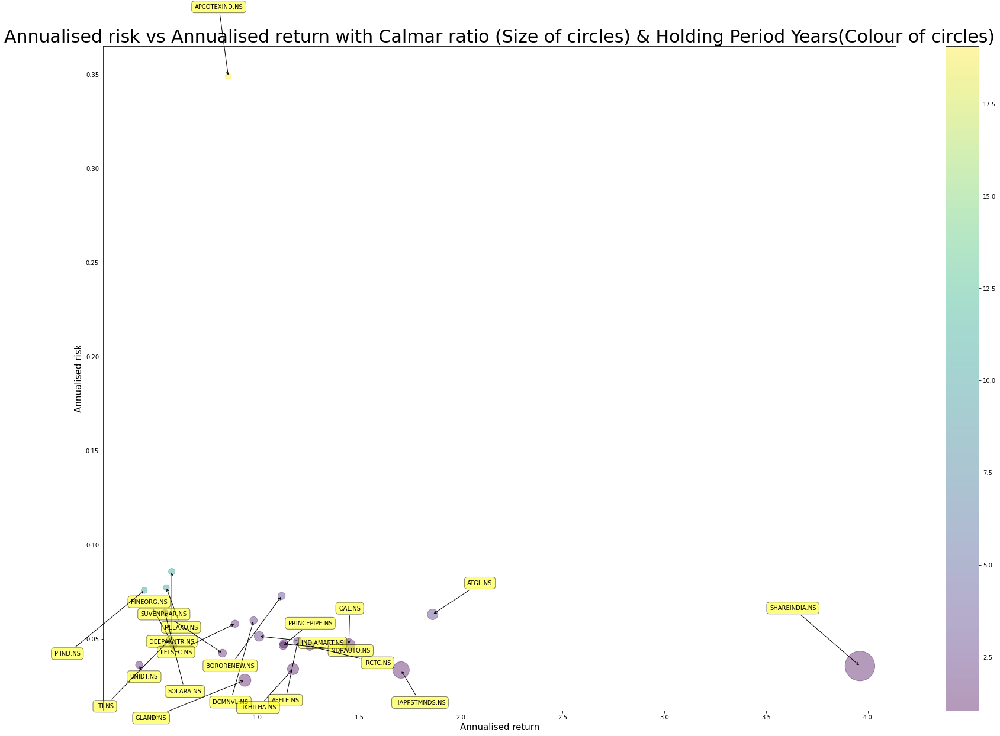

<Figure size 432x288 with 0 Axes>

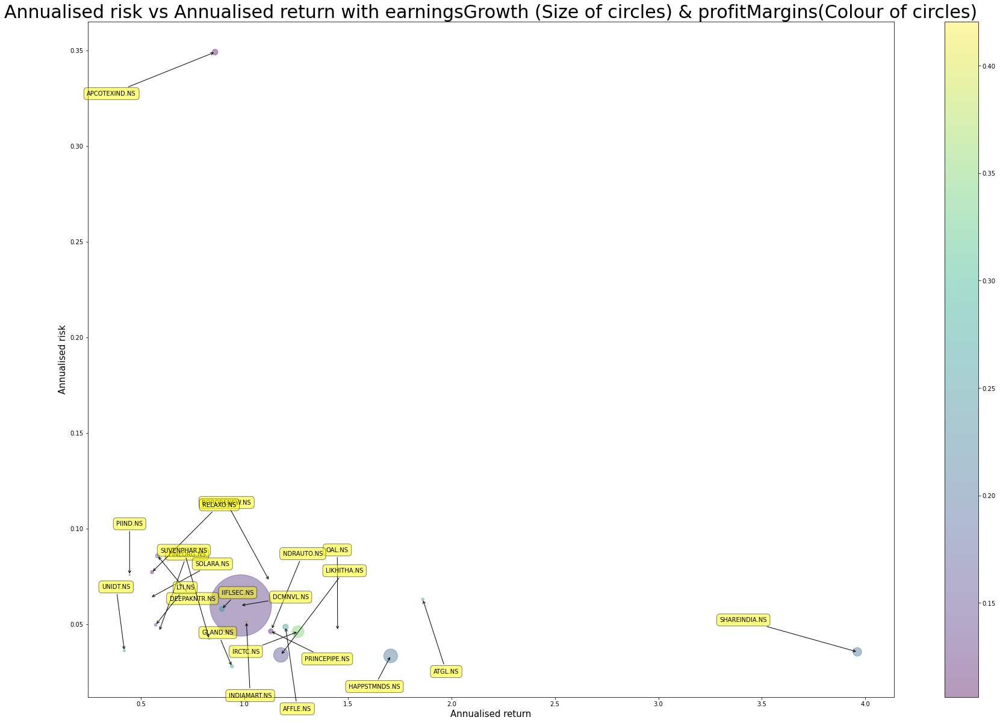

<Figure size 432x288 with 0 Axes>

In [31]:
def display_scatter_graph(data, x_param, y_param, colour_param, circle_size_param):
    #####################################################################
    ############ plt.scatter NOT EFFICIENT FOR large dataset ############ 
    #####################################################################
    rets = data #.dropna()#.sort_values(by=["Average drawdown", 'Max drawdown'])

    labels = rets.index

    rng = np.random.RandomState(0)
    colors = rng.rand(100)
    title = y_param + " vs " + x_param + " with " + circle_size_param + " (Size of circles) & " + colour_param +  "(Colour of circles)"
    fig=plt.figure(figsize=(30,20))
    plt.xlabel(x_param, fontsize=15)
    plt.ylabel(y_param, fontsize=15)
    plt.title(title, fontsize=30)
    plt.subplots_adjust(bottom = 0.1)
    colors[:len(rets.index)]
    plt.scatter(
    #    data[:, 0], data[:, 1], marker='o', c=data[:, 2], s=data[:, 3] * 1500,
        #rets["Annualised return"], rets["Annualised risk"], marker='o', c=colors[:len(rets.index)], alpha=0.8, s=rets["Calmar ratio"]*50, cmap='viridis')
        rets[x_param], rets[y_param], marker='o', c=rets[colour_param], alpha=0.4, s=rets[circle_size_param]*100, cmap='viridis')
    #    cmap=plt.get_cmap('Spectral'))
    plt.colorbar();  # show color scale

    for label, x, y in zip(labels, rets[x_param], rets[y_param]):
        # plt.annotate(
        #     label,
        #     xy=(x, y), xytext=(-20, 20),
        #     textcoords='offset points', ha='right', va='bottom',
        #     bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
        #     arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
        plt.annotate(
            label,
            xy=(x, y), xytext=(random.randint(-150, 150), random.randint(-150, 150)),
            textcoords='offset points', ha='right', va='bottom',
            bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
            arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
    plt.show()

    #fig.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


data_directory
file = 'gsm_asm_groupby_sector_sorted_all_ratios.csv'
gsm_asm_groupby_sector_sorted_all_ratios = pd.DataFrame()

if (os.path.exists(data_directory + file)):
    #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
    gsm_asm_groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + file, sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

pd.set_option('display.max_columns', 500)
#gsm_asm_groupby_sector_sorted_all_ratios.head()

result = gsm_asm_groupby_sector_sorted_all_ratios

good = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 1.0) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 40) & (result['HeldPercentInsiders'] >= 0.45) & (result['profitMargins'] > 0.1)] #&
#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]
#good
len(good.index)


display_scatter_graph(good, "Annualised return", "Annualised risk", "Holding Period Years", "Calmar ratio")

display_scatter_graph(good, "Annualised return", "Annualised risk", "profitMargins", "earningsGrowth")


Index(['OAL.NS', 'PRINCEPIPE.NS', 'FINEORG.NS', 'DEEPAKNTR.NS',
       'APCOTEXIND.NS', 'PIIND.NS', 'INDIAMART.NS', 'AFFLE.NS', 'NDRAUTO.NS',
       'DCMNVL.NS', 'BORORENEW.NS', 'RELAXO.NS', 'LIKHITHA.NS', 'UNIDT.NS',
       'SHAREINDIA.NS', 'IIFLSEC.NS', 'GLAND.NS', 'SUVENPHAR.NS', 'SOLARA.NS',
       'IRCTC.NS', 'HAPPSTMNDS.NS', 'LTI.NS', 'ATGL.NS'],
      dtype='object')

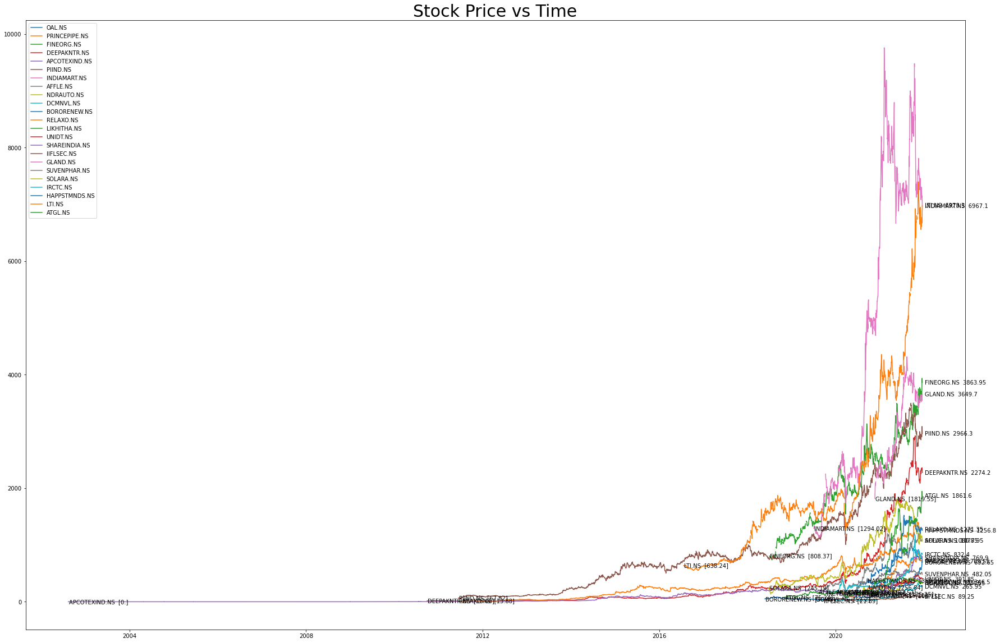

In [8]:
def display_annotated_stock_price(df_all_stock_price, title):
    fig, ax = plt.subplots(1, 1, figsize=(30, 20))
    ax.plot(df_all_stock_price.index ,df_all_stock_price)

    no_of_rows, no_of_columns = df_all_stock_price.shape
    plt.legend(labels=df_all_stock_price.columns)
    plt.title(title, fontsize=30)

    for i in df_all_stock_price.head(1).columns:
        df_cln = clean_dataset(pd.DataFrame(df_all_stock_price[i]))
        txt = i + "  " + str((df_cln.head(1).values[0]).round(2))
        ax.annotate(xy=(df_cln.head(1).index, df_cln.head(1)[i]), xytext=(1,0), textcoords='offset points', text=txt, va='center')

    for i in df_all_stock_price.tail(1).columns:
        txt = i + "  " + str((df_all_stock_price[i].tail(1).values[0]).round(2))
        ax.annotate(xy=(df_all_stock_price.tail(1).index, df_all_stock_price.tail(1)[i]), xytext=(5,0), textcoords='offset points', text=txt, va='center')

    return

#df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, labels)

good.index

display_annotated_stock_price(df_all_stock_price[good.index], 'Stock Price vs Time')

Date,2021-12-17
FINEORG.NS,0.977750
BORORENEW.NS,0.956810
ATGL.NS,0.955268
LTI.NS,0.938822
RELAXO.NS,0.884287
AFFLE.NS,0.869894
PIIND.NS,0.845201
SHAREINDIA.NS,0.826299
PRINCEPIPE.NS,0.810795
SUVENPHAR.NS,0.803192


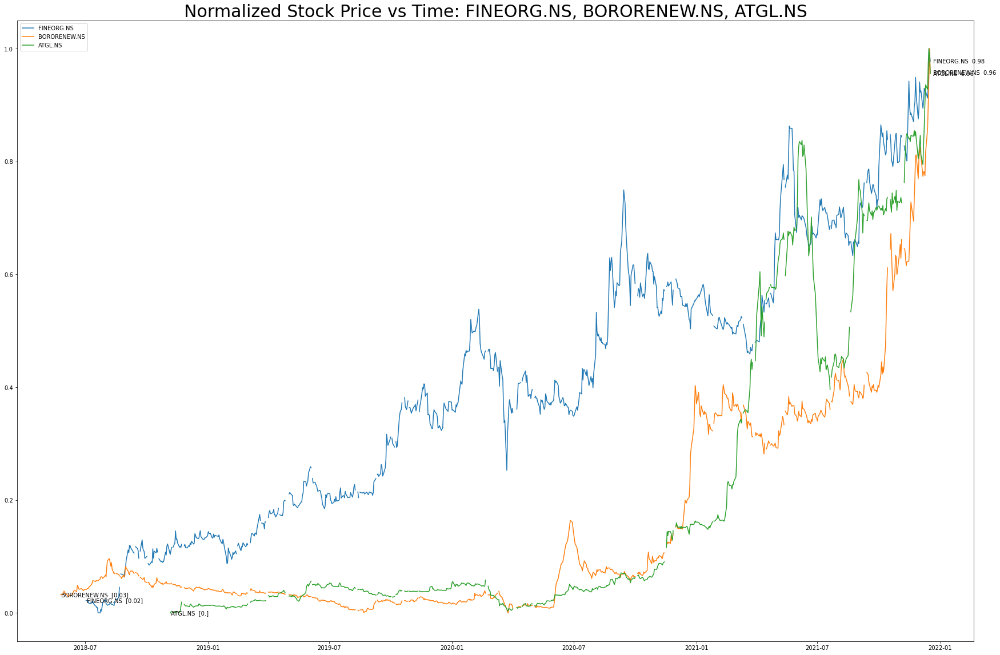

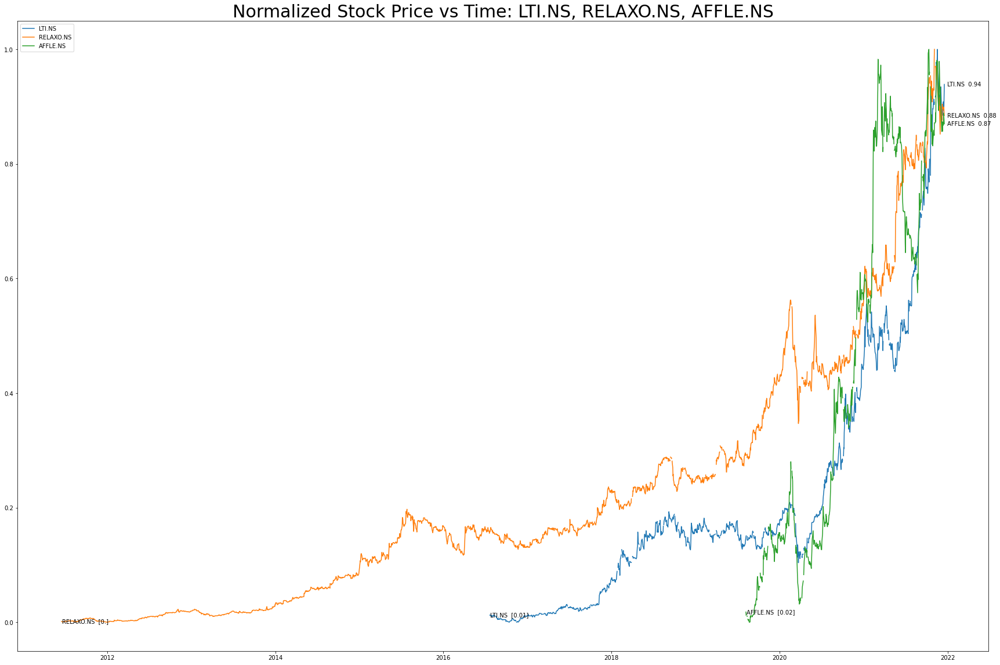

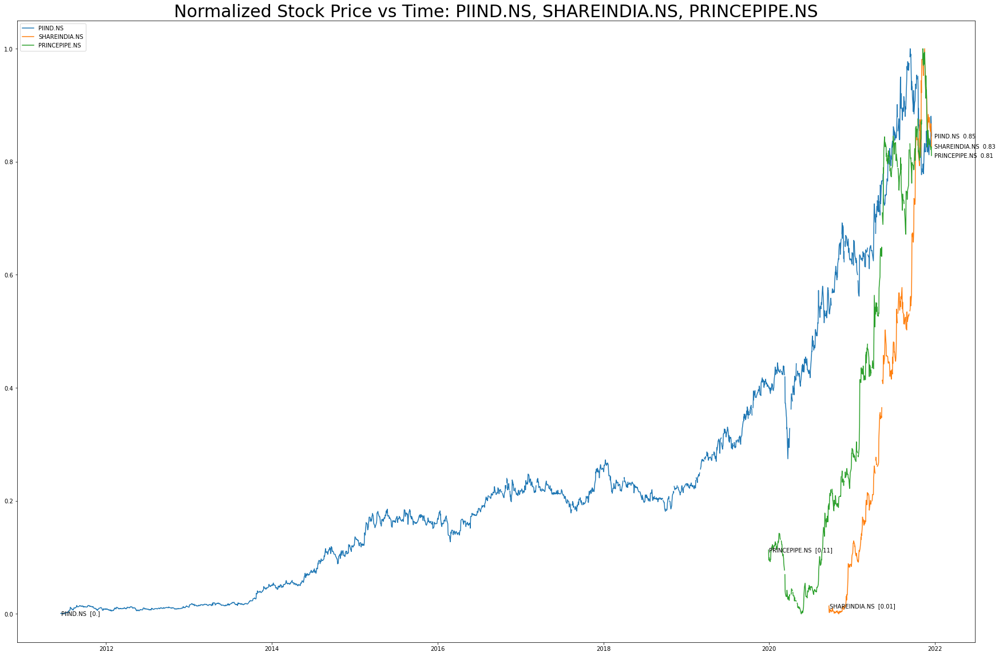

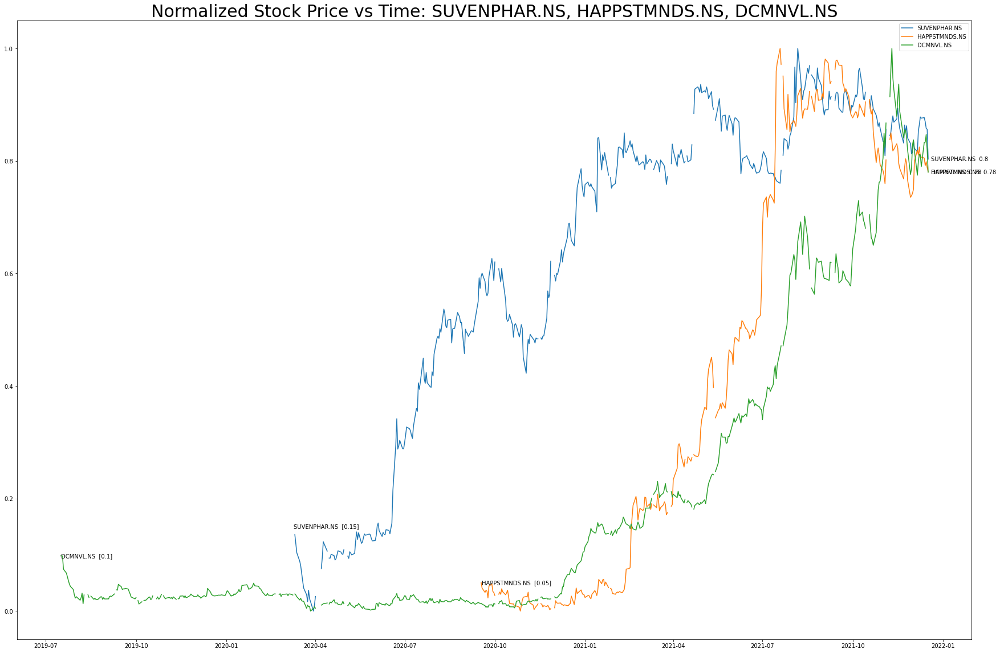

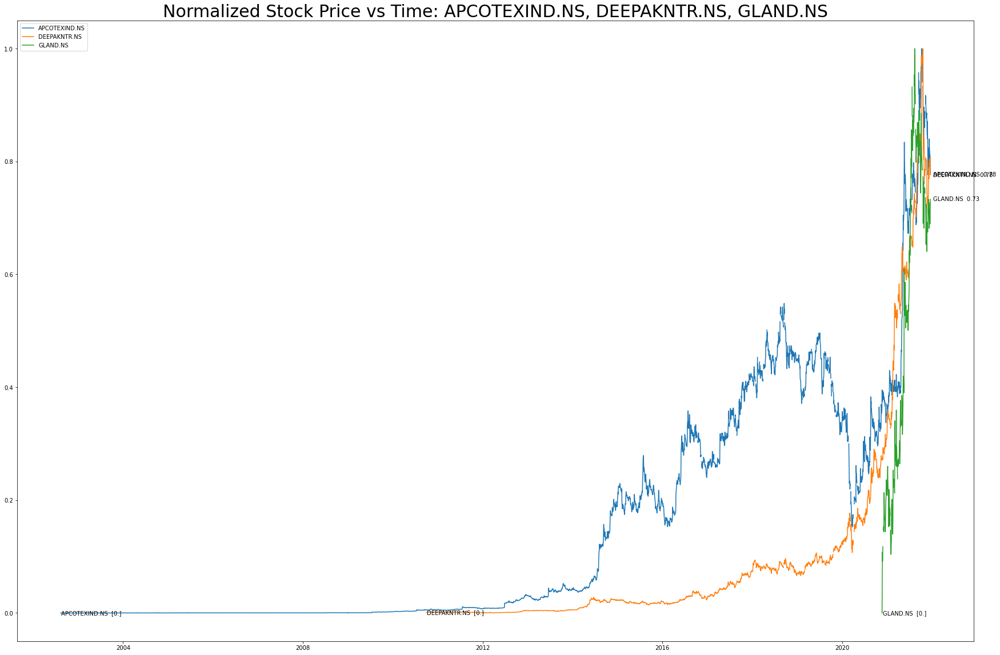

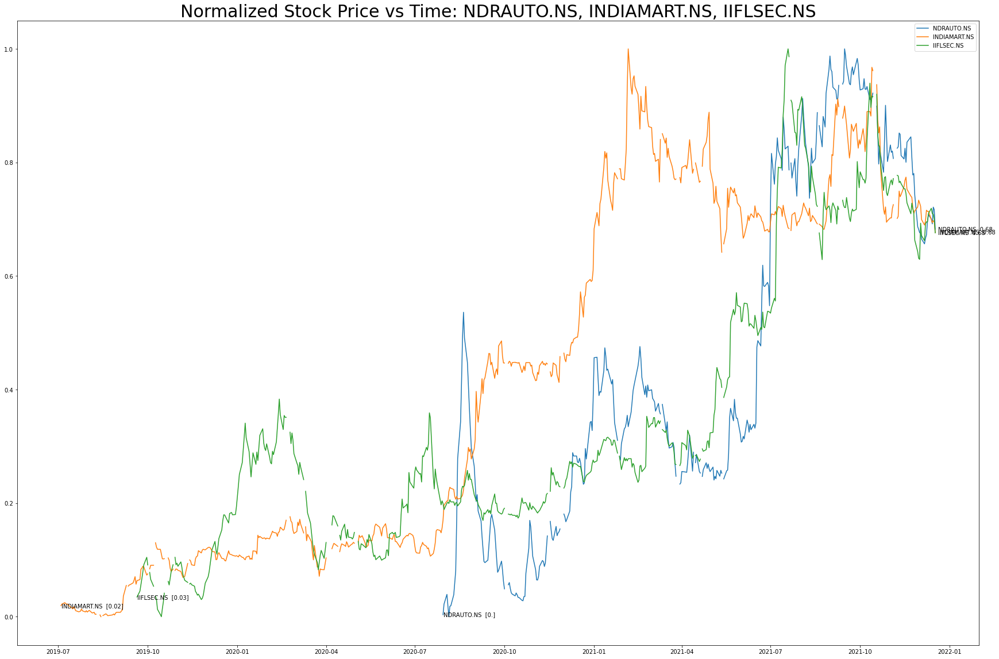

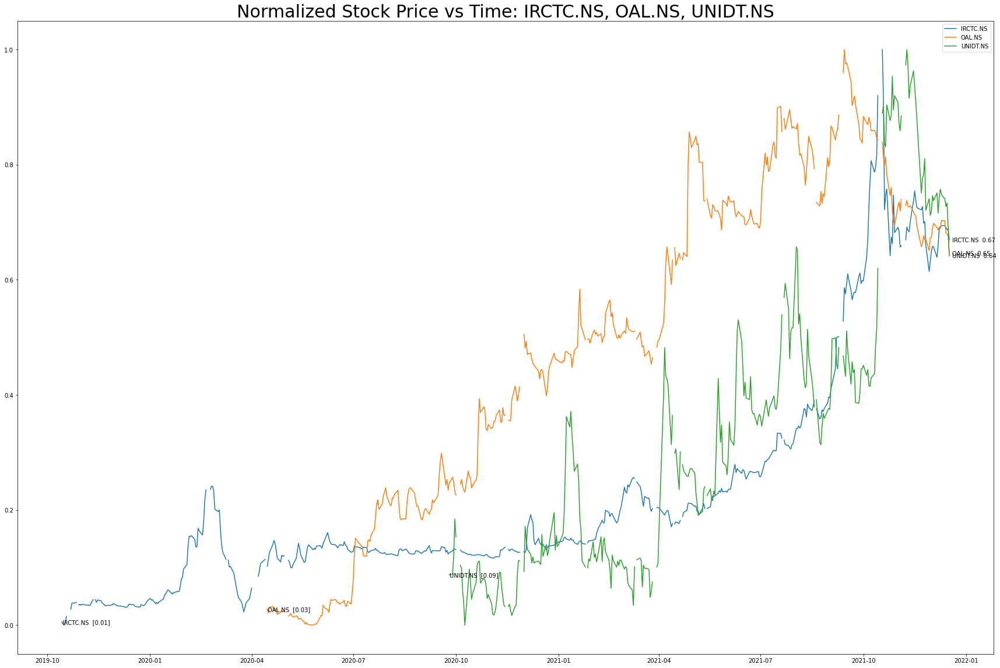

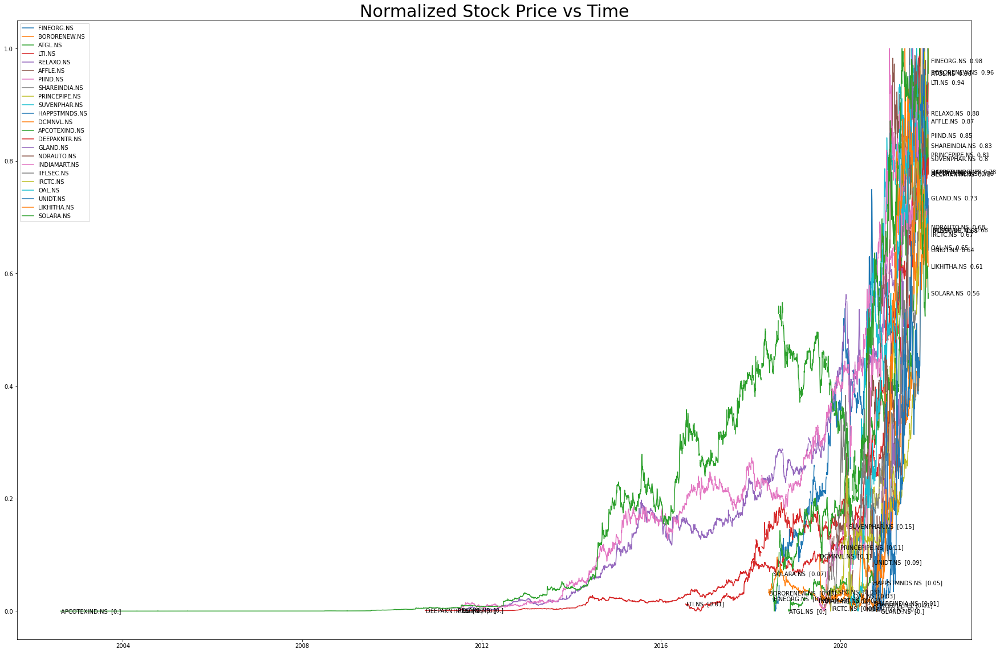

In [115]:
def normalize_data(df):
    # df on input should contain only one column with the price data (plus dataframe index)
    min = df.min()
    max = df.max()
    x = df 
    
    # time series normalization part
    # y will be a column in a dataframe
    y = (x - min) / (max - min)
    return y

df_all_stock_price_normalized = normalize_data(df_all_stock_price[good.index])
no_of_rows, no_of_columns =  df_all_stock_price_normalized.shape
df_all_stock_price_normalized_wo_index = df_all_stock_price_normalized.reset_index(inplace = False, drop = True)
last_day = df_all_stock_price_normalized_wo_index.tail(1)
x = last_day.to_dict('r')

dct = {k: v for k, v in sorted(x[0].items(), key=lambda item: item[1], reverse=True)}
sorted_stock = list(dct.keys())

#df_all_stock_price_normalized.head()
df_all_stock_price_normalized_sorted = df_all_stock_price_normalized[sorted_stock]
df_all_stock_price_normalized_sorted.tail(1).T

no_of_stocks_per_graph = 3
start = 0
for j in np.arange(no_of_stocks_per_graph,len(sorted_stock),no_of_stocks_per_graph):
    t = df_all_stock_price_normalized_sorted.T[start:j].T
    display_annotated_stock_price(t, 'Normalized Stock Price vs Time: ' + ', '.join(pd.Series(t[start:j].columns.values).to_list()))
    start = j

display_annotated_stock_price(df_all_stock_price_normalized_sorted, 'Normalized Stock Price vs Time')

In [9]:
#sorted_all_ratios = sorted_all_ratios[["Annualised return", "Expected return[Equity Risk Premium based]", "Annualised risk", "Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Max drawdown", "Average drawdown", "Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", "Semideviation"]]
#sorted_all_ratios = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)

too_good = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 1.0) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 40) & (result['HeldPercentInsiders'] >= 0.45) & (result['profitMargins'] > 0.1)] #&
#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]

#too_good = result.loc[(result["Annualised return"] >= 0.5) & (result['Calmar ratio'] >= 3.0) & (result['Sharpe ratio'] >= 3.0) & (result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000)]
too_good


,Sector,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
OAL.NS,Basic Materials,1.44980,1.662698,NaN,NaN,NaN,2.549182e+10,2.583751e+10,-0.635,NaN,757.00,4.550177,-172.307091,16.494425,29.928767,1.554222,1.353917,11.170770,10.814088,0.120755,0.307417,-0.008118,0.123,0.046738,259.099,0.9,0.125199,0.76010,0.00025,165.639,11.831,0.17038,0.10738,0.0020,NaN,24.991745,NaN,845.436,803.15780,0.003266,"(0.089899994,)",12791.0,2998.0,1.50,2021-12-09,0.999118,Oriental Aromatics Limited manufactures and se...
PRINCEPIPE.NS,Basic Materials,1.12695,1.944444,NaN,Stage I,NaN,8.237123e+10,8.233071e+10,0.629,NaN,747.45,1.797586,-76.987882,11.288498,23.213032,1.195500,1.031067,9.709418,9.058494,0.105679,0.598553,-0.013976,0.123,0.046351,218.426,0.9,0.113823,0.70567,0.15693,100.886,14.475,0.25646,0.10735,0.0057,NaN,37.094296,1.807576,755.923,644.71576,0.004712,"(0.0723,)",370060.0,41060.0,4.00,2021-09-07,NaN,Prince Pipes and Fittings Limited manufactures...
FINEORG.NS,Basic Materials,0.58751,3.384921,NaN,NaN,NaN,1.142385e+11,8.703735e+10,-0.075,NaN,3717.95,1.445117,-28.919267,5.634026,11.559497,0.766443,0.501601,5.893337,5.808628,0.082575,0.371257,-0.018552,0.107,0.046413,369.661,0.7,0.086354,0.75000,0.16991,238.571,13.130,0.17823,0.10618,0.0021,NaN,94.724840,NaN,3412.596,2973.70000,0.001627,"(0.0764,)",44550.0,3544.0,6.00,2021-08-17,-0.039307,Fine Organic Industries Limited manufactures a...
DEEPAKNTR.NS,Basic Materials,0.57975,10.972222,NaN,NaN,NaN,3.027379e+11,2.945339e+11,0.494,NaN,2219.60,1.237075,-7.271541,2.868307,6.166367,0.755357,0.493841,5.554976,5.547173,0.086207,0.427420,-0.072715,0.107,0.085747,433.006,0.7,0.089026,0.49104,0.16506,207.362,14.478,0.45569,0.18011,0.0020,NaN,39.022503,1.545944,2439.908,2007.08850,0.002092,"(0.0,)",988027.0,1071567.0,4.50,2021-07-20,0.935455,Deepak Nitrite Limited manufactures and sells ...
APCOTEXIND.NS,Basic Materials,0.85731,19.067460,NaN,NaN,NaN,1.882017e+10,1.832936e+10,0.915,NaN,362.60,1.115893,-4.582336,2.758832,2.310198,1.007887,0.766414,3.908352,3.907422,0.193544,0.722569,-0.175960,0.115,0.349022,150.233,0.8,0.196143,0.60362,0.00014,67.992,10.299,0.27048,0.10681,0.0104,NaN,42.573677,1.021589,399.543,313.18200,0.009729,"(0.2495,)",97721.0,52213.0,3.50,2021-07-01,0.828028,Apcotex Industries Limited produces and sells ...
PIIND.NS,Basic Materials,0.44468,10.269841,NaN,NaN,NaN,4.480464e+11,4.257982e+11,0.037,4.010000,2953.25,1.073012,-8.319487,2.413248,5.196330,0.656133,0.363758,4.310819,4.479346,0.079755,0.366893,-0.047320,0.099,0.075761,323.984,0.6,0.081208,0.47088,0.30397,355.368,6.069,0.14735,0.16140,0.0017,35.53,59.195230,NaN,3026.450,2845.72580,0.001699,"(0.095699996,)",353567.0,416036.0,5.00,2021-09-07,0.524900,PI Industries Limited manufactures and distrib...
INDIAMART.NS,Communication Services,1.00919,2.412698,NaN,NaN,NaN,2.240465e+11,1.943674e+11,0.135,NaN,7367.60,2.798157,-60.643857,9.271771,18.667774,1.368843,0.923281,8.293923,8.178539,0.109516,0.342436,-0.015800,0.107,0.051329,237.024,0.7,0.112891,0.55174,0.25773,543.715,3.942,NaN,0.42057,0.0021,NaN,77.898080,NaN,7949.318,7732.15200,0.002023,"(0.0,)",107721.0,40086.0,15.00,2021-08-23,0.839498,IndiaMART InterMESH Limited operates an online...
AFFLE.NS,Communica

,ATGL.NS,LTI.NS,GLAND.NS,PIIND.NS,RELAXO.NS,DEEPAKNTR.NS,INDIAMART.NS,HAPPSTMNDS.NS,IRCTC.NS,SUVENPHAR.NS,FINEORG.NS,PRINCEPIPE.NS,BORORENEW.NS,SOLARA.NS,AFFLE.NS,IIFLSEC.NS,SHAREINDIA.NS,OAL.NS,APCOTEXIND.NS,UNIDT.NS,LIKHITHA.NS,DCMNVL.NS,NDRAUTO.NS
MarketCap,182321.007821,121737.235661,59746.779136,44804.639949,31822.102528,30273.788314,22404.651418,17909.329101,13152.319078,12679.882342,11423.847219,8237.123174,7846.574490,4281.589350,3007.655117,2681.151898,2587.262362,2549.182259,1882.017382,846.401075,677.801062,519.613645,189.145715
enterpriseValue,179198.872781,117883.496038,56614.453248,42579.820544,29461.341798,29453.392282,19436.737331,16667.426816,62996.905984,12609.683456,8703.734579,8233.071411,5287.515341,6369.524531,10498.365030,2676.096819,2164.260250,2583.750861,1832.936243,1223.415706,628.904448,564.258253,140.037082


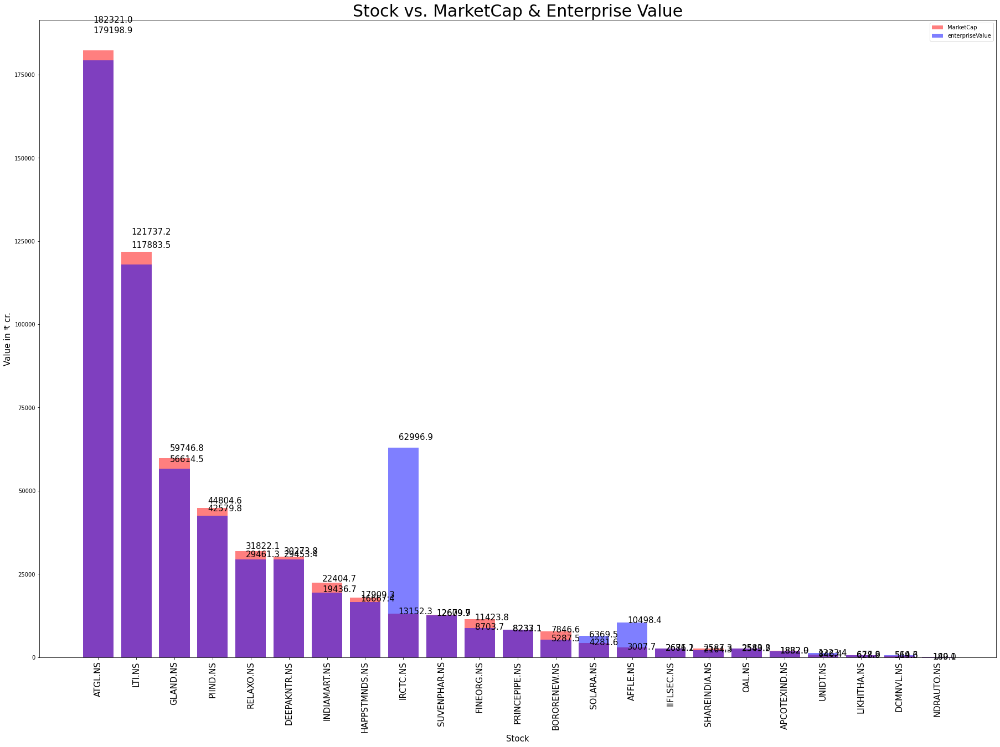

In [44]:
# xtick_parm1, xtick_parm2 are columns names within dataframe data
def display_bar_graph_two_parameters(data, xtick_parm1, xtick_parm2, xlabel, ylabel, title):
    xticks = data.columns

    fig=plt.figure(figsize=(24,16))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel(ylabel, fontsize=15)
    plt.title(title, fontsize=30)
    plt.xticks(range(len(xticks)), xticks, rotation='vertical', fontsize=15)
    #plt.scatter(range(len(rets.columns)), rets.loc["Calmer Ratio", : ], s=area)

    ax.bar(range(len(xticks)), data.loc[xtick_parm1], color='r', alpha=0.5)
    ax.bar(range(len(xticks)), data.loc[xtick_parm2], color='b', alpha=0.5)
    #ax.bar(range(len(rets.columns)), np.clip(rets.loc["Sterling Ratio", : ], -0.5, 1.5), color='b')

    # Annotate Text
    for i, ar in enumerate(data.loc[xtick_parm1]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)


    for i, ar in enumerate(data.loc[xtick_parm2]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)

    #p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1,  angle=0.0, facecolor='red', label="red", transform=fig.transFigure)
    #p2 = patches.Rectangle((.124,-0.005), width=.446, height=.13, alpha=.1,  angle=0.0, facecolor='green', label="green", transform=fig.transFigure)
    #fig.add_artist(p1)
    #fig.add_artist(p2)

    ax.legend(labels=[xtick_parm1, xtick_parm2])
    plt.savefig(data_directory + title + ".svg")

    return

title = "Stock vs. MarketCap & Enterprise Value"

#rets = sorted_all_ratios.dropna().sort_values(by=['Annualised return'], ascending=False)
rets = too_good[['MarketCap', 'enterpriseValue']].sort_values(by=['MarketCap'], ascending=False)
rets = np.divide(rets, 10000000)
rets = rets.T
rets

display_bar_graph_two_parameters(rets, 'MarketCap', 'enterpriseValue', "Stock", "Value in ₹ cr.", title)

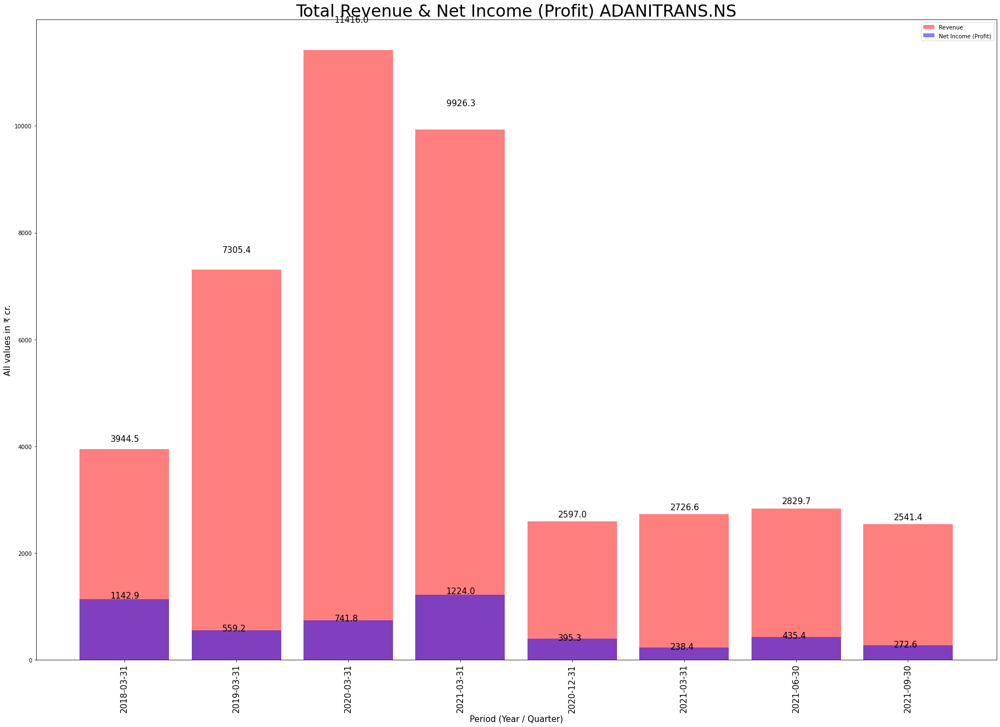

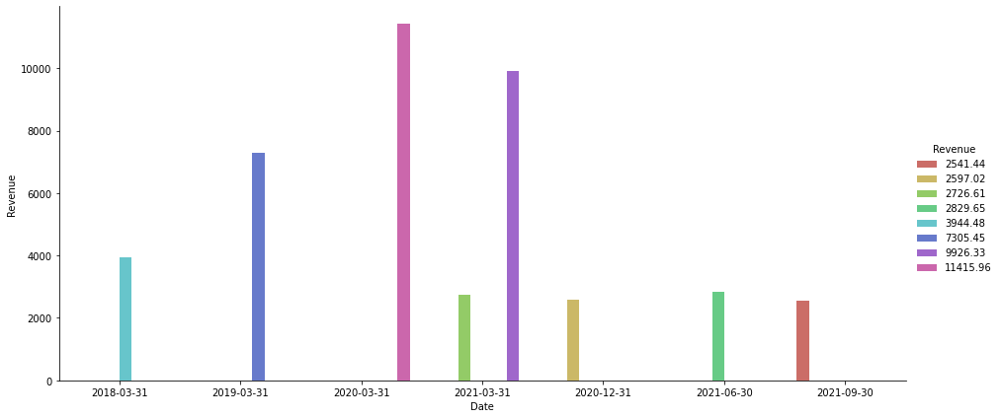

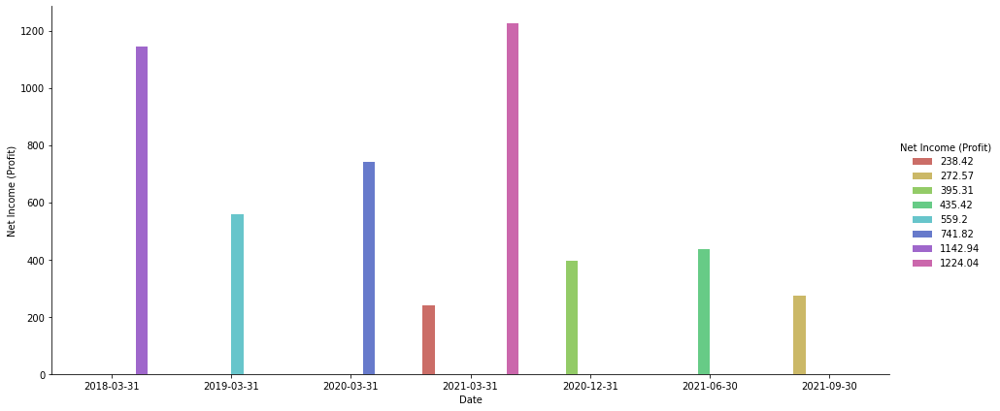

In [70]:
import seaborn as sns

def get_financial(stock):
    if (os.path.exists(data_directory + stock + '_financials.csv')):
        financial_yearly = pd.read_csv(data_directory + stock + '_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial_quarterly = pd.read_csv(data_directory + stock + '_quarterly_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial = pd.concat([financial_yearly, financial_quarterly], axis=1)
        financial = financial.T

        financial.rename(columns = {'Total Revenue':'Revenue'}, inplace = True)
        financial.rename(columns = {'Net Income':'Net Income (Profit)'}, inplace = True)
        financial = financial[['Revenue', 'Net Income (Profit)']].T
    else:
        print("File does not exist!!")
    
    return financial


title = "Total Revenue & Net Income (Profit)"

for i in ['ADANITRANS.NS']: #too_good.index[:1]:
    financial  = get_financial(i).divide(10000000) #Convert into crore

    display_bar_graph_two_parameters(financial, 'Revenue', 'Net Income (Profit)', 'Period (Year / Quarter)', 'All values in ₹ cr.', title + " " + i)

    financial = financial.T.reset_index()
    financial.columns = ["Date", "Revenue", "Net Income (Profit)"]
    sns.catplot(x='Date', y='Revenue', hue='Revenue', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')
    sns.catplot(x='Date', y='Net Income (Profit)', hue='Net Income (Profit)', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')

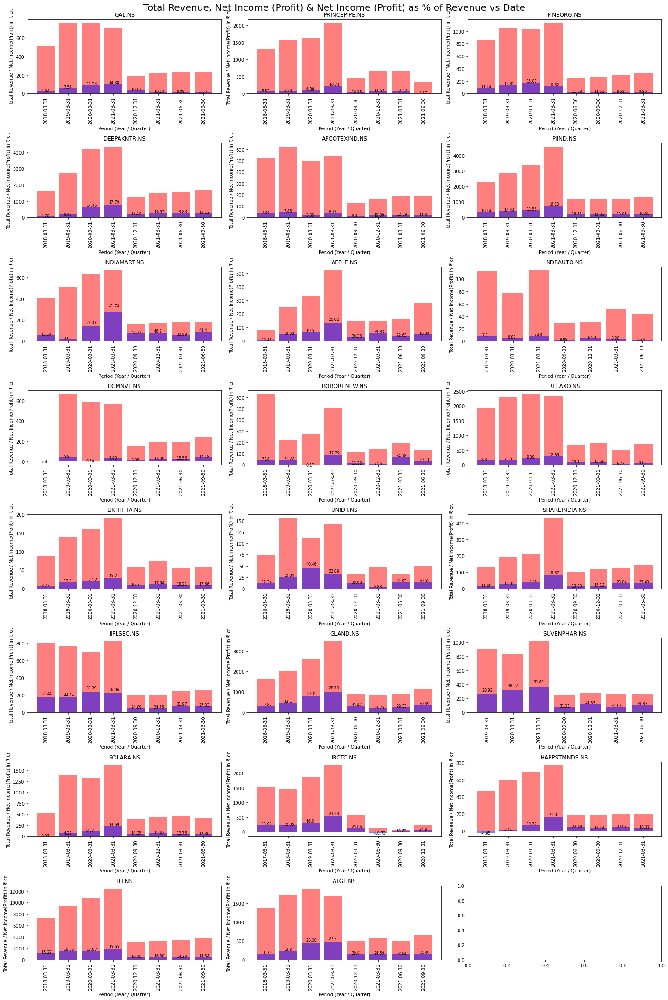

In [119]:

def display_multigrid_bar_graph(list_of_stocks, num_of_columns_in_subplot):
    length = len(list_of_stocks)
    length

    num_of_columns_in_subplot
    num_of_rows_in_subplot = math.ceil(length / num_of_columns_in_subplot)
    num_of_rows_in_subplot

    fig, ax_lst = plt.subplots(num_of_rows_in_subplot, num_of_columns_in_subplot)  # a figure with a 2x2 grid of Axes
    fig.set_figheight(6 * 5)
    fig.set_figwidth(4 * 5)

    fig.suptitle('Total Revenue, Net Income (Profit) & Net Income (Profit) as % of Revenue vs Date', fontsize=20,  y=0.99 )  # add a overall title

    for i, v in enumerate(list_of_stocks):
        r= int(i/num_of_columns_in_subplot)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_title(list_of_stocks[i])
        financial  = get_financial(v).divide(10000000).T.reset_index() #Convert into crore
        percent_profit_of_revenue = ((financial['Net Income (Profit)'] / financial['Revenue']) * 100).round(2)
        #percent_profit_of_revenue
        financial = pd.concat([financial, percent_profit_of_revenue], axis=1)
        financial.columns = ["Date", "Revenue", "Net Income (Profit)", "Profit as % of revenue"]
        ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Revenue'])), financial['Revenue'], color='r', alpha=0.5)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Net Income (Profit)'])), financial['Net Income (Profit)'], color='b', alpha=0.5)
        #g = sns.catplot(x='Date', y='Revenue', hue='Revenue', data=f, kind='bar', legend=True, palette='hls', ax=ax_lst[r,i-(num_of_columns_in_subplot*r)]) # pass ax

        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticks(range(len(financial['Date'])))
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticklabels(financial['Date'], rotation='vertical', fontsize=10)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set(xlabel='Period (Year / Quarter)', ylabel='Total Revenue / Net Income(Profit) in ₹ cr.')

        # Annotate Text
        for y, profit_percentage in enumerate(financial['Net Income (Profit)']):
            ax_lst[r,i-(num_of_columns_in_subplot*r)].text(y-0.2, financial['Net Income (Profit)'][y] * 1.20, financial["Profit as % of revenue"][y], verticalalignment='center', fontsize=8)
        
    plt.tight_layout()




display_multigrid_bar_graph(too_good.index, 3)

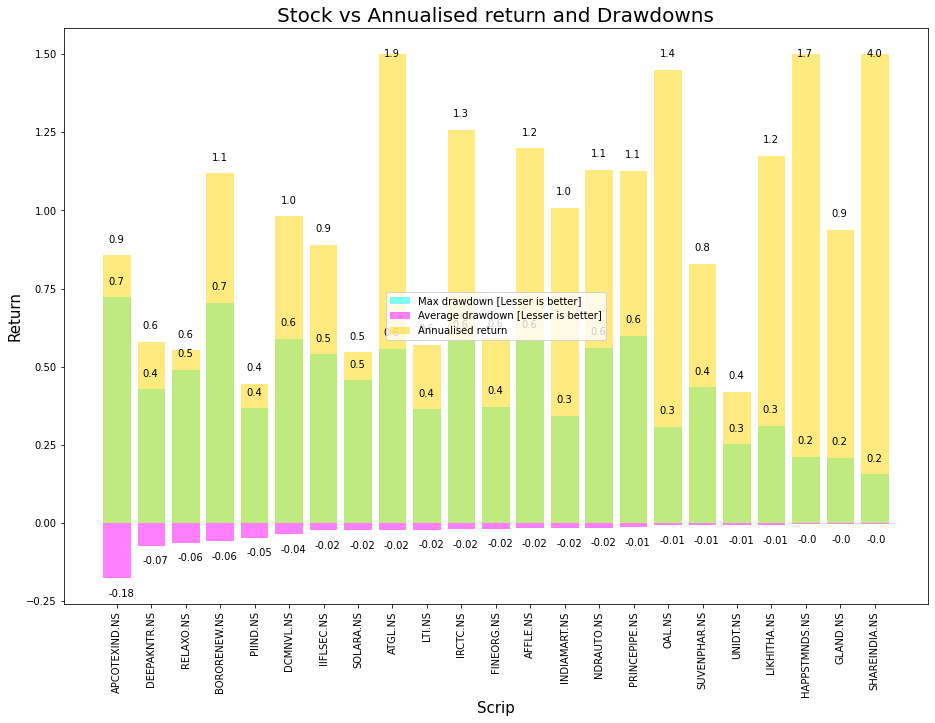

In [120]:


def add_annotate_text(y_axis_values, ax, lower_clip_limit=0, upper_clip_limit=100000):
    # # Annotate Text
    for i, ar in enumerate(y_axis_values):
        if (ar > 0.0):
            if (ar > upper_clip_limit):
                ax.text(i-0.25, upper_clip_limit, round(ar, 1), verticalalignment='center')
            else:
                ax.text(i-0.25, ar+0.05, round(ar, 1), verticalalignment='center')
        elif (ar < 0.0):
            if (ar > lower_clip_limit):
                ax.text(i-0.25, lower_clip_limit, round(ar, 2), verticalalignment='center')
            else:
                ax.text(i-0.25, ar-0.05, round(ar, 2), verticalalignment='center')
        else:
            ax.text(i-0.25, ar, round(ar, 2), verticalalignment='center')


def display_overlapping_multi_bar_graph(rets):
    title = "Stock vs Annualised return and Drawdowns"

    fig=plt.figure(figsize=(12,8))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel("Scrip", fontsize=15)
    plt.ylabel("Return", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(range(len(rets.columns)), rets.columns, rotation='vertical')

    ax.bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    add_annotate_text(rets.loc["Max drawdown", : ], ax)
    ax.bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)
    add_annotate_text(rets.loc["Average drawdown", : ], ax)
    lower_clip_limit = -0.5
    upper_clip_limit = 1.5
    ax.bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ], lower_clip_limit, upper_clip_limit), color='gold', alpha=0.5)
    add_annotate_text(rets.loc['Annualised return', : ], ax, lower_clip_limit, upper_clip_limit)


    ax.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


rets = too_good[['Annualised return', 'Average drawdown', 'Max drawdown']].dropna().sort_values(by=["Average drawdown", 'Max drawdown'])
rets = rets.T
display_overlapping_multi_bar_graph(rets)


,Sector,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
APCOTEXIND.NS,Basic Materials,0.85731,19.067460,NaN,NaN,NaN,1.882017e+10,1.832936e+10,0.915,NaN,362.60,1.115893,-4.582336,2.758832,2.310198,1.007887,0.766414,3.908352,3.907422,0.193544,0.722569,-0.175960,0.115,0.349022,150.233,0.8,0.196143,0.60362,0.00014,67.992,10.299,0.27048,0.10681,0.0104,NaN,42.573677,1.021589,399.543,313.1820,0.009729,"(0.2495,)",97721.0,52213.0,3.5,2021-07-01,0.828028,Apcotex Industries Limited produces and sells ...
DEEPAKNTR.NS,Basic Materials,0.57975,10.972222,NaN,NaN,NaN,3.027379e+11,2.945339e+11,0.494,NaN,2219.60,1.237075,-7.271541,2.868307,6.166367,0.755357,0.493841,5.554976,5.547173,0.086207,0.427420,-0.072715,0.107,0.085747,433.006,0.7,0.089026,0.49104,0.16506,207.362,14.478,0.45569,0.18011,0.0020,NaN,39.022503,1.545944,2439.908,2007.0885,0.002092,"(0.0,)",988027.0,1071567.0,4.5,2021-07-20,0.935455,Deepak Nitrite Limited manufactures and sells ...
RELAXO.NS,Consumer Cyclical,0.55301,10.261905,NaN,NaN,NaN,3.182210e+11,2.946134e+11,0.278,307.315189,1280.65,1.022574,-7.990378,3.158398,6.502120,1.004020,0.477075,5.465958,5.759654,0.082719,0.490928,-0.062827,0.091,0.077207,100.325,0.5,0.082831,0.74660,0.10161,55.260,9.168,NaN,0.11967,0.0021,14.99,132.025770,NaN,1309.502,1110.2120,0.000000,"(0.0,)",260038.0,122694.0,2.5,2021-08-17,0.252131,Relaxo Footwears Limited manufactures and sell...
BORORENEW.NS,Consumer Cyclical,1.11942,3.488095,NaN,NaN,Stage I,7.846574e+10,5.287515e+10,NaN,NaN,602.85,1.516566,-18.075729,7.821423,14.683007,1.335525,1.028524,7.818988,7.659036,0.130266,0.704500,-0.059108,0.115,0.072766,47.933,0.8,0.134289,0.68506,0.00091,47.326,9.996,NaN,0.22442,NaN,NaN,79.742060,NaN,444.382,318.7480,NaN,"(0.0,)",1402649.0,141354.0,NaN,2019-12-18,2.757602,Borosil Renewables Limited engages in the manu...
PIIND.NS,Basic Materials,0.44468,10.269841,NaN,NaN,NaN,4.480464e+11,4.257982e+11,0.037,4.010000,2953.25,1.073012,-8.319487,2.413248,5.196330,0.656133,0.363758,4.310819,4.479346,0.079755,0.366893,-0.047320,0.099,0.075761,323.984,0.6,0.081208,0.47088,0.30397,355.368,6.069,0.14735,0.16140,0.0017,35.53,59.195230,NaN,3026.450,2845.7258,0.001699,"(0.095699996,)",353567.0,416036.0,5.0,2021-09-07,0.524900,PI Industries Limited manufactures and distrib...


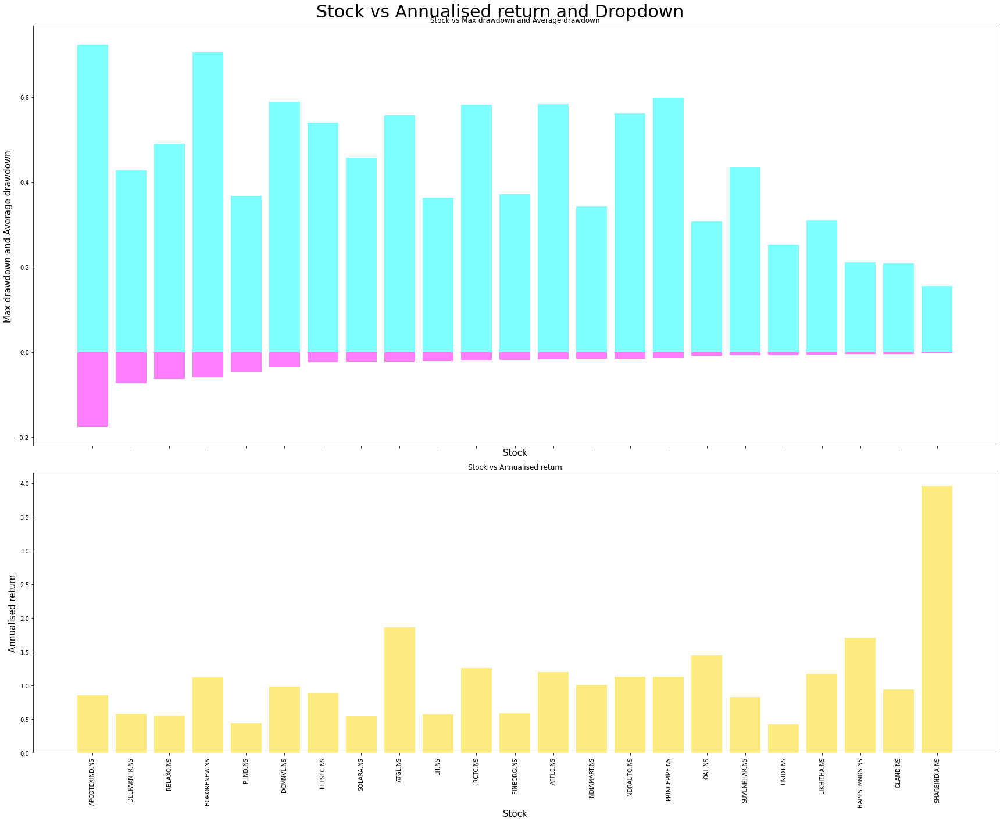

In [12]:
#color='rgbycmk'
#ax.set_color_cycle(colors)

def display_hortzontal_subplots(rets):
    # using subplot function and creating plot one
    # row 2, column 1, count 1
    fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, sharey=False, gridspec_kw={'height_ratios':[3,2]}, figsize=(24,20))
    fig.suptitle("Stock vs Annualised return and Dropdown", fontsize=30)
    #ax[0].plot(x, y, color='red')
    #ax[1].plot(x, y, color='blue')
    plt.gca().set_xlabel('Stock', fontsize=15)
    ax[0].set_xticks(range(len(rets.columns)))
    ax[0].set_xticklabels(rets.columns, rotation='vertical')
    ax[0].title.set_text('Stock vs Max drawdown and Average drawdown')
    ax[0].set_xlabel('Stock', fontsize=15)
    ax[0].set_ylabel('Max drawdown and Average drawdown', fontsize=15)
    ax[0].bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    ax[0].bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)

    ax[1].set_xticks(range(len(rets.columns)))
    ax[1].set_xticklabels(rets.columns, rotation='vertical')
    ax[1].title.set_text('Stock vs Annualised return')
    ax[1].set_xlabel('Stock', fontsize=15)
    ax[1].set_ylabel('Annualised return', fontsize=15)
    ax[1].bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ],-100, 150 ), color='gold', alpha=0.5)

    plt.subplots_adjust(left=1,
                        bottom=0.8, 
                        right=2, 
                        top=1, 
                        wspace=1,
                        hspace=1)
    fig.tight_layout()
    
    # show plot
    plt.show()

rets = too_good.sort_values(by=["Average drawdown", 'Max drawdown'])
rets.head()
rets = rets.T
display_hortzontal_subplots(rets)

[[0.5488135  0.71518937 0.60276338 0.54488318]
 [0.4236548  0.64589411 0.43758721 0.891773  ]
 [0.96366276 0.38344152 0.79172504 0.52889492]
 [0.56804456 0.92559664 0.07103606 0.0871293 ]
 [0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918]
 [0.11827443 0.63992102 0.14335329 0.94466892]
 [0.52184832 0.41466194 0.26455561 0.77423369]
 [0.45615033 0.56843395 0.0187898  0.6176355 ]
 [0.61209572 0.616934   0.94374808 0.6818203 ]]
0 (-30, 30)
1 (-30, 30)
2 (-30, 30)
3 (-30, 30)
4 (-30, 30)
5 (-30, 30)
6 (-30, 30)
7 (-30, 30)
8 (30, -30)
9 (-30, 30)


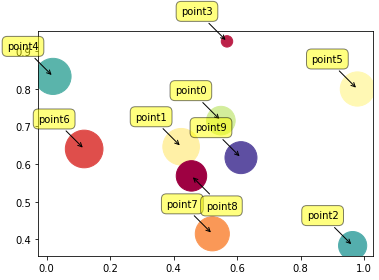

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree


def get_label_xy(tree, thresh, data, i):
    neighbors = tree.query_ball_point([data[i, 0], data[i, 1]], thresh)
    if len(neighbors) == 1:
        xy = (-30, 30)
    else:
        mean = np.mean(data[:, :2][neighbors], axis=0)

        if mean[0] == data[i, 0] and mean[1] == data[i, 1]:
            if i < np.max(neighbors):
                xy = (-30, 30)
            else:
                xy = (30, -30)
        else:
            angle = np.arctan2(data[i, 1] - mean[1], data[i, 0] - mean[0])

            if angle > np.pi / 2:
                xy = (-30, 30)
            elif angle > 0:
                xy = (30, 30)
            elif angle > -np.pi / 2:
                xy = (30, -30)
            else:
                xy = (-30, -30)
    return xy


def labeled_scatter_plot(data, labels):
    plt.subplots_adjust(bottom = 0.1)
    plt.scatter(
        data[:, 0], data[:, 1], marker = 'o', c = data[:, 2], s = data[:, 3]*1500,
        cmap = plt.get_cmap('Spectral'))

    #print(data[:, :2])

    tree = cKDTree(data[:, :2])
    thresh = .1

    for i in range(data.shape[0]):
        xy = get_label_xy(tree, thresh, data, i)
        print(i, xy)
        plt.annotate(
            labels[i],
            xy = data[i, :2], xytext = xy,
            textcoords = 'offset points', ha = 'center', va = 'center',
            bbox = dict(boxstyle = 'round,pad=0.5', fc = 'yellow', alpha = 0.5),
            arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))


np.random.seed(0)
N = 10
data = np.random.random((N, 4))
print(data)


# data[1, :2] = data[0, :2]
# data[-1, :2] = data[-2, :2] + .01
# data[5, :2] = data[4, :2] + [.05, 0]
# data[6, :2] = data[4, :2] + [.05, .05]
# data[7, :2] = data[4, :2] + [0, .05]
# print(data)

labels = ['point{0}'.format(i) for i in range(N)]

labeled_scatter_plot(data, labels)

plt.show()

Text(0.5, 0, 'Stock')

Text(0, 0.5, 'Risks')

Text(0.5, 1.0, 'Stock vs Systematic and Unsystematic Risks')

([<matplotlib.axis.XTick at 0xffff144d2910>,
 [Text(0.6, 0, 'OAL.NS'),
  Text(2.6, 0, 'PRINCEPIPE.NS'),
  Text(4.6, 0, 'FINEORG.NS'),
  Text(6.6, 0, 'DEEPAKNTR.NS'),
  Text(8.6, 0, 'APCOTEXIND.NS'),
  Text(10.6, 0, 'PIIND.NS'),
  Text(12.6, 0, 'INDIAMART.NS'),
  Text(14.6, 0, 'AFFLE.NS'),
  Text(16.6, 0, 'NDRAUTO.NS'),
  Text(18.6, 0, 'DCMNVL.NS'),
  Text(20.6, 0, 'BORORENEW.NS'),
  Text(22.6, 0, 'RELAXO.NS'),
  Text(24.6, 0, 'LIKHITHA.NS'),
  Text(26.6, 0, 'UNIDT.NS'),
  Text(28.6, 0, 'SHAREINDIA.NS'),
  Text(30.6, 0, 'IIFLSEC.NS'),
  Text(32.6, 0, 'GLAND.NS'),
  Text(34.6, 0, 'SUVENPHAR.NS'),
  Text(36.6, 0, 'SOLARA.NS'),
  Text(38.6, 0, 'IRCTC.NS'),
  Text(40.6, 0, 'HAPPSTMNDS.NS'),
  Text(42.6, 0, 'LTI.NS'),
  Text(44.6, 0, 'ATGL.NS')])

<BarContainer object of 23 artists>

<BarContainer object of 23 artists>

<BarContainer object of 23 artists>

<BarContainer object of 23 artists>

<BarContainer object of 23 artists>

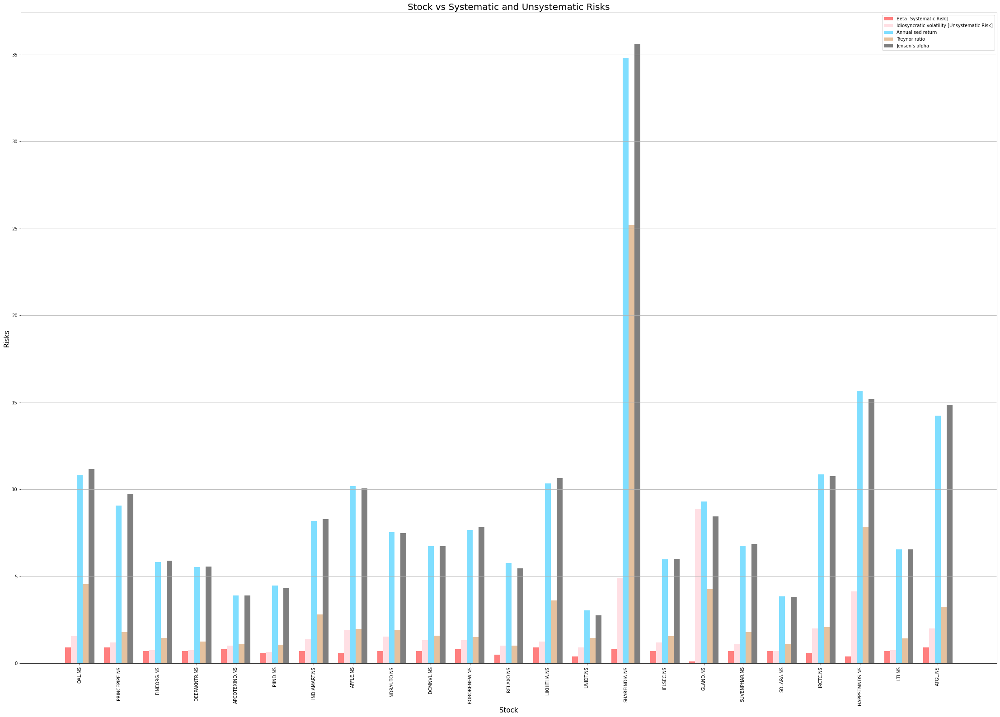

<Figure size 432x288 with 0 Axes>

In [ ]:
#index = ["Annualised return", "Expected return", "Annualised risk", "Sharpe ratio", "Beta [Systematic Risk]", 
#        "Treynor ratio", "Jensen's alpha", "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]", "Appraisal ratio", 
#        "Semideviation", "Max drawdown", "Average drawdown", "Sortino ratio", "Calmar ratio", "Sterling ratio"]

title = "Stock vs Systematic and Unsystematic Risks"

#rets = sorted_all_ratios.dropna()
rets = too_good
bar_width=0.3

#rets.index.values
#rets.columns

X = np.arange(len(rets.index.values))

#rets.plot.xticks(range(len(rets.columns)), rets.columns, rotation='vertical')
# a.plot(x='Sterling ratio', y='Annualised return', title = title, kind = 'scatter', color='r', alpha=0.5)
# a.plot(x='Calmar ratio', y='Annualised return', title = title, kind = 'scatter', color='g', alpha=0.5)
# a.plot(x='Sortino ratio', y='Annualised return', title = title, kind = 'scatter', color='b', alpha=0.5)

fig=plt.figure(figsize=(30,20))
# fig.add_axes([0,0,1,1])
# plt.axis.bar(a['Sterling ratio'], a['Annualised return'], title = title, color='r', alpha=0.5)
ax=fig.add_axes([0,0,1,1])
plt.xlabel("Stock", fontsize=15)
plt.ylabel("Risks", fontsize=15)
plt.title(title, fontsize=20)
plt.xticks(X+range(len(rets.index.values))+(bar_width*2), rets.index.values, rotation='vertical')

# ax.bar(X + range(len(rets.columns))+0.0, rets.loc["Beta [Systematic Risk]", : ], color='r', alpha=0.5, width=bar_width)
# ax.bar(X + range(len(rets.columns))+(bar_width*1), rets.loc["Treynor ratio", : ], color='pink', alpha=0.5, width=bar_width)
# ax.bar(X + range(len(rets.columns))+(bar_width*2), rets.loc["Appraisal ratio", : ], color='deepskyblue', alpha=0.5, width=bar_width)
# ax.bar(X + range(len(rets.columns))+(bar_width*3), rets.loc["Semideviation", : ], color='lawngreen', alpha=0.5, width=bar_width)

ax.bar(X + range(len(rets.index.values))+0.0, rets["Beta [Systematic Risk]"], color='r', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Treynor ratio"], color='pink', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Appraisal ratio"], color='deepskyblue', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*3), rets["Calmar ratio"], color='peru', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets["Information ratio"], color='black', alpha=0.5, width=bar_width)

#ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Idiosyncratic volatility [Unsystematic Risk]"], color='g', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Annualised return"], color='b', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets.loc["Jensen's alpha", : ], color='aqua', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*5), rets.loc["Tracking error", : ], color='grey', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*7), rets["Annualised return"], color='orange', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*8), rets.loc["Expected return", : ], color='lawngreen', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*9), rets["Annualised risk"], color='peru', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*10), rets.loc["Information ratio", : ], color='black', alpha=0.5, width=bar_width)

#df=pd.DataFrame({'x_values': range(1,11), 'y1_values': np.random.randn(10), 'y2_values': np.random.randn(10)+range(1,11), 'y3_values': np.random.randn(10)+range(11,21) })


# multiple line plots
# plt.plot( range(len(rets.index.values)), rets.loc["Beta [Systematic Risk]", : ], data=rets, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
# plt.plot( range(len(rets.index.values)), rets.loc["Idiosyncratic volatility [Unsystematic Risk]", : ], data=rets, marker='', color='olive', linewidth=2)
# plt.plot( range(len(rets.index.values)), rets.loc["Annualised return", : ], data=rets, marker='', color='olive', linewidth=2, linestyle='dashed', label="toto")

plt.legend(labels=["Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", "Annualised return", "Treynor ratio", "Jensen's alpha", "Tracking error", "Appraisal ratio", "Annualised return", "Expected return", "Annualised risk", "Information ratio"])
plt.grid(axis = 'y')
plt.show()
plt.savefig(data_directory + title + ".svg")

<BarContainer object of 23 artists>

 Text(0, 0, 'OAL.NS'),
 Text(1, 0, 'PRINCEPIPE.NS'),
 Text(2, 0, 'FINEORG.NS'),
 Text(3, 0, 'DEEPAKNTR.NS'),
 Text(4, 0, 'APCOTEXIND.NS'),
 Text(5, 0, 'PIIND.NS'),
 Text(6, 0, 'INDIAMART.NS'),
 Text(7, 0, 'AFFLE.NS'),
 Text(8, 0, 'NDRAUTO.NS'),
 Text(9, 0, 'DCMNVL.NS'),
 Text(10, 0, 'BORORENEW.NS'),
 Text(11, 0, 'RELAXO.NS'),
 Text(12, 0, 'LIKHITHA.NS'),
 Text(13, 0, 'UNIDT.NS'),
 Text(14, 0, 'SHAREINDIA.NS'),
 Text(15, 0, 'IIFLSEC.NS'),
 Text(16, 0, 'GLAND.NS'),
 Text(17, 0, 'SUVENPHAR.NS'),
 Text(18, 0, 'SOLARA.NS'),
 Text(19, 0, 'IRCTC.NS'),
 Text(20, 0, 'HAPPSTMNDS.NS'),
 Text(21, 0, 'LTI.NS'),
 Text(22, 0, 'ATGL.NS')]

Text(0.5, 1.0, 'Stock')

[Text(0, 0, 'OAL.NS'),
 Text(1, 0, 'PRINCEPIPE.NS'),
 Text(2, 0, 'FINEORG.NS'),
 Text(3, 0, 'DEEPAKNTR.NS'),
 Text(4, 0, 'APCOTEXIND.NS'),
 Text(5, 0, 'PIIND.NS'),
 Text(6, 0, 'INDIAMART.NS'),
 Text(7, 0, 'AFFLE.NS'),
 Text(8, 0, 'NDRAUTO.NS'),
 Text(9, 0, 'DCMNVL.NS'),
 Text(10, 0, 'BORORENEW.NS'),
 Text(11, 0, 'RELAXO.NS'),
 Text(12, 0, 'LIKHITHA.NS'),
 Text(13, 0, 'UNIDT.NS'),
 Text(14, 0, 'SHAREINDIA.NS'),
 Text(15, 0, 'IIFLSEC.NS'),
 Text(16, 0, 'GLAND.NS'),
 Text(17, 0, 'SUVENPHAR.NS'),
 Text(18, 0, 'SOLARA.NS'),
 Text(19, 0, 'IRCTC.NS'),
 Text(20, 0, 'HAPPSTMNDS.NS'),
 Text(21, 0, 'LTI.NS'),
 Text(22, 0, 'ATGL.NS')]

Text(0, 0.5, 'Beta [Systematic Risk]')

Text(0, 0.5, 'Idiosyncratic volatility [Unsystematic Risk]')

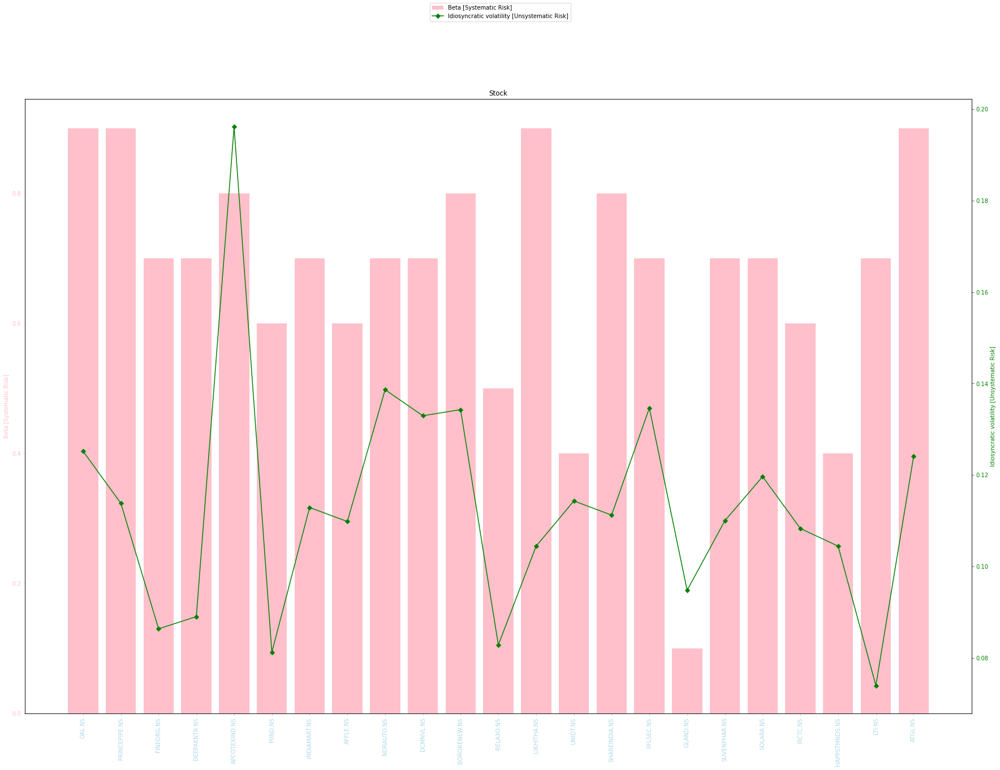

<Figure size 432x288 with 0 Axes>

In [127]:
#"Beta [Systematic Risk]", 
#        "Treynor ratio", "Jensen's alpha", "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]"

#rets = all_ratios.dropna()
rets = too_good.T

color1 = 'pink'
color2 = 'green'
line_size = 6
title = "Stock vs Beta [Systematic Risk] and Idiosyncratic volatility [Unsystematic Risk]"

#create basic bar plot
fig, ax = plt.subplots()
ax.bar(range(len(rets.columns)), rets.loc["Beta [Systematic Risk]", : ], color=color1)
fig.set_figheight(20)
fig.set_figwidth(30)

# Set the ticks and ticklabels for all axes
plt.setp(ax, xticks=range(len(rets.columns)), xticklabels= rets.columns, )
ax.set_title('Stock')
ax.set_xticks(range(len(rets.columns)), )
ax.set_xticklabels(rets.columns)
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
ax.tick_params(axis='x', colors='lightblue')
ax.set_ylabel('Beta [Systematic Risk]')
#specify axis colors
ax.tick_params(axis='y', colors=color1)
ax.yaxis.label.set_color(color1)

ax2 = ax.twinx()
ax2.plot(range(len(rets.columns)), rets.loc["Idiosyncratic volatility [Unsystematic Risk]", :], color=color2, marker="D", ms=line_size)
ax2.set_ylabel('Idiosyncratic volatility [Unsystematic Risk]')
ax2.yaxis.label.set_color(color2)
ax2.tick_params(axis='y', colors=color2)

#display Pareto chart
fig.legend(labels=["Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", "Annualised return"], loc='upper center')
plt.show()
plt.savefig(data_directory + title + ".svg")

,Sector,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
OAL.NS,Basic Materials,1.44980,1.662698,NaN,NaN,NaN,2.549182e+10,2.583751e+10,-0.635,NaN,757.00,4.550177,-172.307091,16.494425,29.928767,1.554222,1.353917,11.170770,10.814088,0.120755,0.307417,-0.008118,0.123,0.046738,259.099,0.9,0.125199,0.76010,0.00025,165.639,11.831,0.17038,0.10738,0.0020,NaN,24.991745,NaN,845.436,803.15780,0.003266,"(0.089899994,)",12791.0,2998.0,1.50,2021-12-09,0.999118,Oriental Aromatics Limited manufactures and se...
PRINCEPIPE.NS,Basic Materials,1.12695,1.944444,NaN,Stage I,NaN,8.237123e+10,8.233071e+10,0.629,NaN,747.45,1.797586,-76.987882,11.288498,23.213032,1.195500,1.031067,9.709418,9.058494,0.105679,0.598553,-0.013976,0.123,0.046351,218.426,0.9,0.113823,0.70567,0.15693,100.886,14.475,0.25646,0.10735,0.0057,NaN,37.094296,1.807576,755.923,644.71576,0.004712,"(0.0723,)",370060.0,41060.0,4.00,2021-09-07,NaN,Prince Pipes and Fittings Limited manufactures...
FINEORG.NS,Basic Materials,0.58751,3.384921,NaN,NaN,NaN,1.142385e+11,8.703735e+10,-0.075,NaN,3717.95,1.445117,-28.919267,5.634026,11.559497,0.766443,0.501601,5.893337,5.808628,0.082575,0.371257,-0.018552,0.107,0.046413,369.661,0.7,0.086354,0.75000,0.16991,238.571,13.130,0.17823,0.10618,0.0021,NaN,94.724840,NaN,3412.596,2973.70000,0.001627,"(0.0764,)",44550.0,3544.0,6.00,2021-08-17,-0.039307,Fine Organic Industries Limited manufactures a...
DEEPAKNTR.NS,Basic Materials,0.57975,10.972222,NaN,NaN,NaN,3.027379e+11,2.945339e+11,0.494,NaN,2219.60,1.237075,-7.271541,2.868307,6.166367,0.755357,0.493841,5.554976,5.547173,0.086207,0.427420,-0.072715,0.107,0.085747,433.006,0.7,0.089026,0.49104,0.16506,207.362,14.478,0.45569,0.18011,0.0020,NaN,39.022503,1.545944,2439.908,2007.08850,0.002092,"(0.0,)",988027.0,1071567.0,4.50,2021-07-20,0.935455,Deepak Nitrite Limited manufactures and sells ...
APCOTEXIND.NS,Basic Materials,0.85731,19.067460,NaN,NaN,NaN,1.882017e+10,1.832936e+10,0.915,NaN,362.60,1.115893,-4.582336,2.758832,2.310198,1.007887,0.766414,3.908352,3.907422,0.193544,0.722569,-0.175960,0.115,0.349022,150.233,0.8,0.196143,0.60362,0.00014,67.992,10.299,0.27048,0.10681,0.0104,NaN,42.573677,1.021589,399.543,313.18200,0.009729,"(0.2495,)",97721.0,52213.0,3.50,2021-07-01,0.828028,Apcotex Industries Limited produces and sells ...
PIIND.NS,Basic Materials,0.44468,10.269841,NaN,NaN,NaN,4.480464e+11,4.257982e+11,0.037,4.010000,2953.25,1.073012,-8.319487,2.413248,5.196330,0.656133,0.363758,4.310819,4.479346,0.079755,0.366893,-0.047320,0.099,0.075761,323.984,0.6,0.081208,0.47088,0.30397,355.368,6.069,0.14735,0.16140,0.0017,35.53,59.195230,NaN,3026.450,2845.72580,0.001699,"(0.095699996,)",353567.0,416036.0,5.00,2021-09-07,0.524900,PI Industries Limited manufactures and distrib...
INDIAMART.NS,Communication Services,1.00919,2.412698,NaN,NaN,NaN,2.240465e+11,1.943674e+11,0.135,NaN,7367.60,2.798157,-60.643857,9.271771,18.667774,1.368843,0.923281,8.293923,8.178539,0.109516,0.342436,-0.015800,0.107,0.051329,237.024,0.7,0.112891,0.55174,0.25773,543.715,3.942,NaN,0.42057,0.0021,NaN,77.898080,NaN,7949.318,7732.15200,0.002023,"(0.0,)",107721.0,40086.0,15.00,2021-08-23,0.839498,IndiaMART InterMESH Limited operates an online...
AFFLE.NS,Communica

<Figure size 1728x1152 with 0 Axes>

Text(0.5, 0, 'Return')

Text(0, 0.5, 'Risk')

Text(0.5, 1.0, 'Return vs. Risk for Stocks [Non Normalised]')

Text(50, 0, 'OAL.NS')

Text(50, 0, 'PRINCEPIPE.NS')

Text(50, 0, 'FINEORG.NS')

Text(50, 0, 'DEEPAKNTR.NS')

Text(50, 0, 'APCOTEXIND.NS')

Text(50, 0, 'PIIND.NS')

Text(50, 0, 'INDIAMART.NS')

Text(50, 0, 'AFFLE.NS')

Text(50, 0, 'NDRAUTO.NS')

Text(50, 0, 'DCMNVL.NS')

Text(50, 0, 'BORORENEW.NS')

Text(50, 0, 'RELAXO.NS')

Text(50, 0, 'LIKHITHA.NS')

Text(50, 0, 'UNIDT.NS')

Text(50, 0, 'SHAREINDIA.NS')

Text(50, 0, 'IIFLSEC.NS')

Text(50, 0, 'GLAND.NS')

Text(50, 0, 'SUVENPHAR.NS')

Text(50, 0, 'SOLARA.NS')

Text(50, 0, 'IRCTC.NS')

Text(50, 0, 'HAPPSTMNDS.NS')

Text(50, 0, 'LTI.NS')

Text(50, 0, 'ATGL.NS')

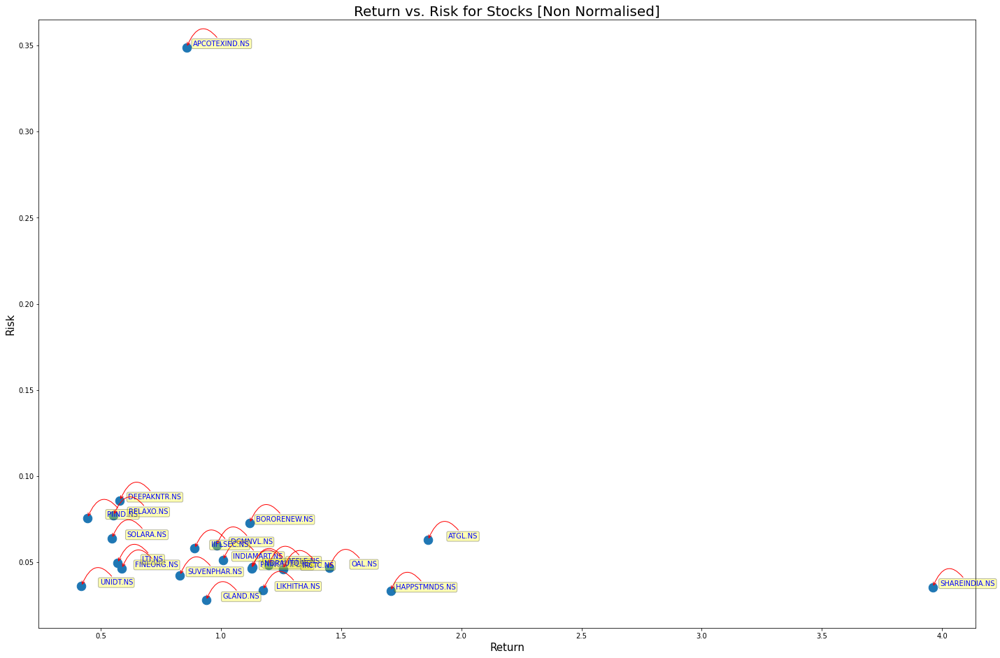

In [128]:

rets = too_good#.dropna()
#rets = stock_Parameters.dropna()
title = "Return vs. Risk for Stocks [Non Normalised]"
rets

area = np.pi*50.0
# sns.set(style='darkgrid')
plt.figure(figsize=(24,16))
plt.scatter(rets["Annualised return"], rets["Annualised risk"], s=area)
plt.xlabel("Return", fontsize=15)
plt.ylabel("Risk", fontsize=15)
plt.title(title, fontsize=20)

for label, x, y in zip(rets.index, rets["Annualised return"], rets["Annualised risk"]) : 
    plt.annotate(label, xy=(x,y), xytext=(50, 0), 
         textcoords='offset points', ha='center', va='bottom',color='blue',
         bbox=dict(boxstyle='round,pad=0.2', fc='yellow', alpha=0.3),
         arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.95', 
                            color='r'))

plt.savefig(data_directory + title + ".svg")



rets = too_good#.dropna()
#rets = stock_Parameters.dropna()
title = "Return vs. Risk for Stocks [Non Normalised]"
rets

area = np.pi*50.0
# sns.set(style='darkgrid')
plt.figure(figsize=(24,16))
plt.scatter(rets["Annualised return"], rets["Annualised risk"], s=area)
plt.xlabel("Return", fontsize=15)
plt.ylabel("Risk", fontsize=15)
plt.title(title, fontsize=20)

for label, x, y in zip(rets.index, rets["Annualised return"], rets["Annualised risk"]) : 
    plt.annotate(label, xy=(x,y), xytext=(50, 0), 
         textcoords='offset points', ha='center', va='bottom',color='blue',
         bbox=dict(boxstyle='round,pad=0.2', fc='yellow', alpha=0.3),
         arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.95', 
                            color='r'))

plt.savefig(data_directory + title + ".svg")

OAL.NS           16.494425
PRINCEPIPE.NS    11.288498
FINEORG.NS        5.634026
DEEPAKNTR.NS      2.868307
APCOTEXIND.NS     2.758832
PIIND.NS          2.413248
INDIAMART.NS      9.271771
AFFLE.NS         11.750510
NDRAUTO.NS       12.318720
DCMNVL.NS         6.812509
BORORENEW.NS      7.821423
RELAXO.NS         3.158398
LIKHITHA.NS      18.166068
UNIDT.NS          5.170728
SHAREINDIA.NS    72.478988
IIFLSEC.NS        7.019943
GLAND.NS         17.143982
SUVENPHAR.NS      9.472396
SOLARA.NS         3.588352
IRCTC.NS         11.898002
HAPPSTMNDS.NS    27.571104
LTI.NS            4.877656
ATGL.NS          14.304844
Name: Sortino ratio, dtype: float64

Text(0.5, 0, 'Scrip')

Text(0, 0.5, 'Calmer Ratio')

Text(0.5, 1.0, 'Scrip vs Calmer Ratio Sortino Ratio')

([<matplotlib.axis.XTick at 0xffff4eb4d370>,
 [Text(0, 0, 'OAL.NS'),
  Text(1, 0, 'PRINCEPIPE.NS'),
  Text(2, 0, 'FINEORG.NS'),
  Text(3, 0, 'DEEPAKNTR.NS'),
  Text(4, 0, 'APCOTEXIND.NS'),
  Text(5, 0, 'PIIND.NS'),
  Text(6, 0, 'INDIAMART.NS'),
  Text(7, 0, 'AFFLE.NS'),
  Text(8, 0, 'NDRAUTO.NS'),
  Text(9, 0, 'DCMNVL.NS'),
  Text(10, 0, 'BORORENEW.NS'),
  Text(11, 0, 'RELAXO.NS'),
  Text(12, 0, 'LIKHITHA.NS'),
  Text(13, 0, 'UNIDT.NS'),
  Text(14, 0, 'SHAREINDIA.NS'),
  Text(15, 0, 'IIFLSEC.NS'),
  Text(16, 0, 'GLAND.NS'),
  Text(17, 0, 'SUVENPHAR.NS'),
  Text(18, 0, 'SOLARA.NS'),
  Text(19, 0, 'IRCTC.NS'),
  Text(20, 0, 'HAPPSTMNDS.NS'),
  Text(21, 0, 'LTI.NS'),
  Text(22, 0, 'ATGL.NS')])

<BarContainer object of 23 artists>

<BarContainer object of 23 artists>

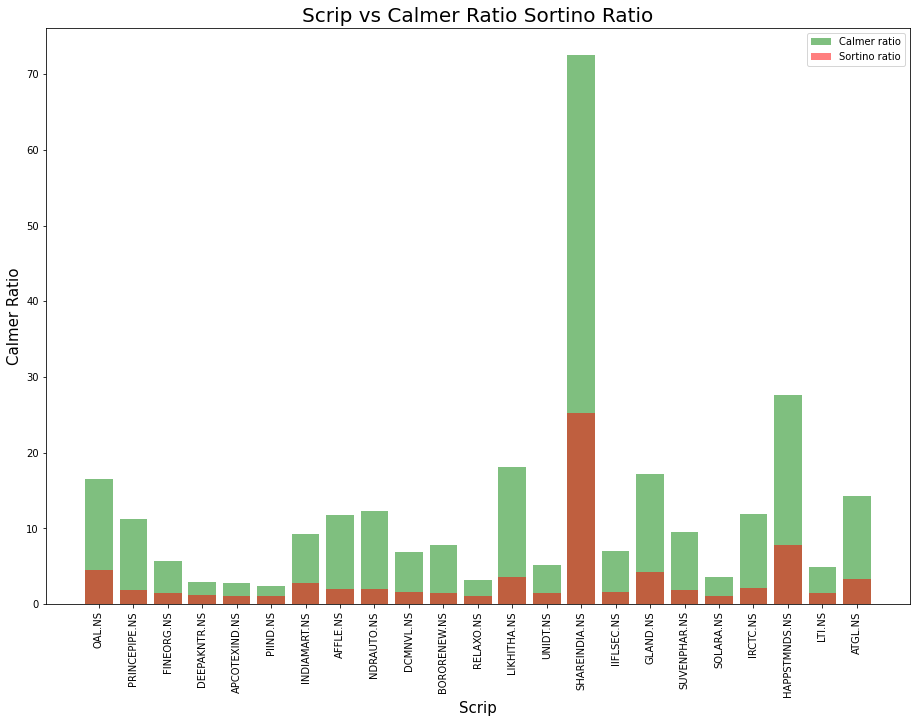

In [65]:

#params = stock_RiskAdjustedReturn_parameters.dropna()

#############################################################
#          Remove Outlier Stocks for better graph display   #
#############################################################
#params = params.drop(columns=['HAPPSTMNDS.NS', 'INTLCONV.NS'])

title = "Scrip vs Calmer Ratio Sortino Ratio"
rets = too_good[["Sortino ratio", "Calmar ratio"]] #.dropna()
rets["Sortino ratio"]

fig=plt.figure(figsize=(12,8))
ax=fig.add_axes([0,0,1,1])

plt.xlabel("Scrip", fontsize=15)
plt.ylabel("Calmer Ratio", fontsize=15)
plt.title(title, fontsize=20)
plt.xticks(range(len(rets.index)), rets.index, rotation='vertical')

#############################################################
#          Data has been clipped for Outlier Stocks         #
#############################################################
#ax.bar(range(len(rets.columns)), np.clip(rets["Calmer Ratio"], -0.5, 1.5), color='r', alpha=0.5)
#ax.bar(range(len(rets.index)), rets.loc["Calmer Ratio"], color='r', alpha=0.5)
#ax.bar(range(len(rets.columns)), np.clip(rets["Sortino Ratio"], -0.5, 1.5), color='g', alpha=0.5)
ax.bar(range(len(rets["Sortino ratio"])), rets["Sortino ratio"], color='g', alpha=0.5)
ax.bar(range(len(rets["Calmar ratio"])), rets["Calmar ratio"], color='r', alpha=0.5)
#ax.bar(range(len(rets.index)), rets.loc["Sortino Ratio"], color='g', alpha=0.5)
#ax.bar(range(len(rets.columns)), np.clip(rets.loc["Sterling Ratio", : ], -0.5, 1.5), color='b')

plt.legend(labels=["Calmer ratio", "Sortino ratio"])
plt.savefig(data_directory + title + ".svg")

In [ ]:
def cumulative_returns(returns):
    
    return returns

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, np.NINF, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = (returns + 1).prod().squeeze()
    return cum_ret_final ** (1 / num_years) - 1

def calmar(returns):
    max_dd = max_drawdown(cumulative_returns(returns))
    if max_dd < 0:
        return annual_returns(returns) / abs(max_dd)
    return np.nan